# 100% Renewable Electricity System for Ivory Coast

In [1]:
# Ignore all warnings
import warnings
warnings.filterwarnings("ignore")

## Shape

Firstly, we plot the whole contry but without EEZ

In [2]:
folder = "./files/"

EPSG:4326


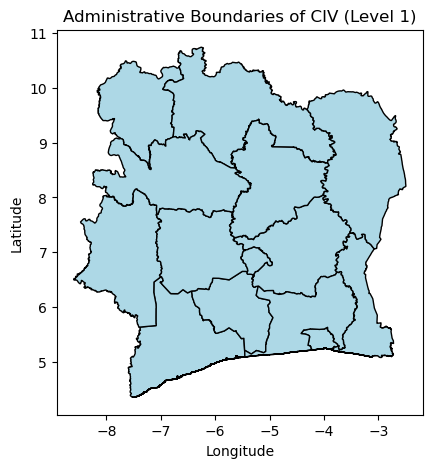

In [3]:
import geopandas as gpd
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd

file_path = folder + "gadm_410-levels-ADM_1-CIV.gpkg"
geo_data = gpd.read_file(file_path)

#print(geo_data)
print(geo_data.crs)
geo_data.plot(figsize=(5, 5), edgecolor="black", facecolor="lightblue")
plt.title("Administrative Boundaries of CIV (Level 1)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

The land area is divided into four regions, labeled as A, B, C, and D.
The relevant regions were merged together, and the resulting file was additionally saved as "4_regions.gpkg" for further land eligibility analysis.

In [4]:
geo_data["region"] = ""
geo_data.loc[geo_data.index.isin([3, 9, 11]), "region"] = "A"
geo_data.loc[geo_data.index.isin([5, 10, 12, 13]), "region"] = "B"
geo_data.loc[geo_data.index.isin([7, 8, 4, 1]), "region"] = "C"
geo_data.loc[geo_data.index.isin([6, 0, 2]), "region"] = "D"

merged_geo = geo_data.dissolve(by="region", as_index=False)

output_file = folder + "4_regions.gpkg"
merged_geo.to_file(output_file, driver="GPKG")
print(f"The file has been saved as {output_file}")

The file has been saved as ./files/4_regions.gpkg


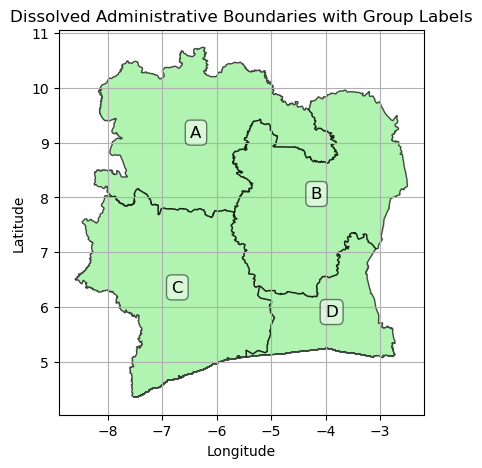

In [5]:
# PLot country with new regions

fig, ax = plt.subplots(figsize=(5, 5))
merged_geo.plot(
    ax=ax,
    edgecolor="black",
    facecolor="lightgreen",
    alpha=0.7
)
for idx, row in merged_geo.iterrows():
    centroid = row.geometry.centroid
    ax.text(
        centroid.x, centroid.y,
        row["region"],
        fontsize=12,
        ha="center",
        va="center",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.5)
    )
plt.title("Dissolved Administrative Boundaries with Group Labels")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(visible=True)
plt.show()

Secondly, let's focus on the EEZ. Here are the EEZs all over the world

EPSG:4326


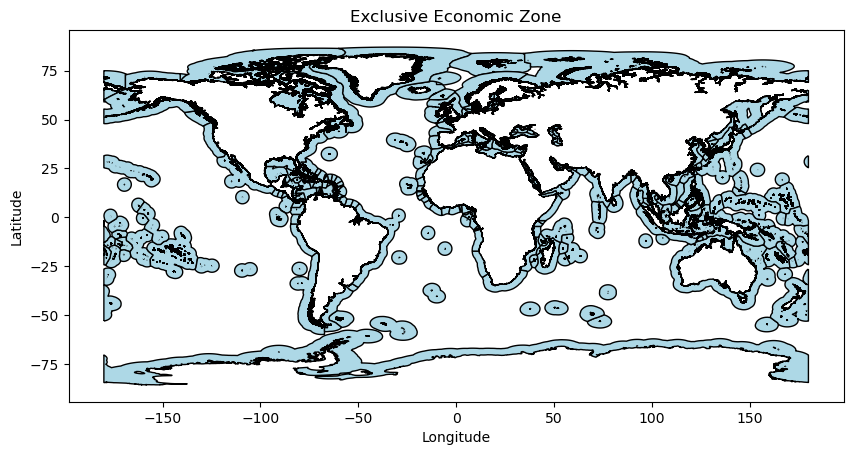

In [6]:
file_path_eez_v11 = folder + "eez_v11.gpkg"
geo_data_eez_v11 = gpd.read_file(file_path_eez_v11)
print(geo_data_eez_v11.crs)
geo_data_eez_v11.plot(figsize=(10, 10), edgecolor="black", facecolor="lightblue")
plt.title("Exclusive Economic Zone")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

The EEZ of CIV is as follows. We label it as Region E.

EPSG:4326


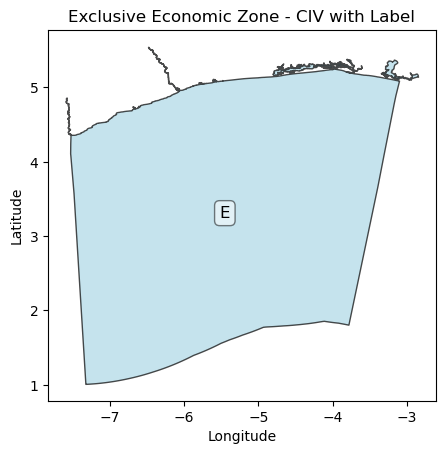

In [7]:
eez_civ = geo_data_eez_v11[geo_data_eez_v11["ISO_SOV1"] == "CIV"]
print(eez_civ.crs)
centroid = eez_civ.geometry.centroid.iloc[0]

fig, ax = plt.subplots(figsize=(5, 5))

eez_civ.plot(
    ax=ax,
    edgecolor="black",
    facecolor="lightblue",
    alpha=0.7
)
ax.text(
    centroid.x, centroid.y,
    "E",
    fontsize=12,
    ha="center",
    va="center",
    bbox=dict(boxstyle="round", facecolor="white", alpha=0.5)
)
plt.title("Exclusive Economic Zone - CIV with Label")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

Same as land regions, the file is saved as "region_E.gpkg" for further eligibility analysis.

In [8]:
output_file = folder + "region_E.gpkg"
eez_civ.to_file(output_file, driver="GPKG")
print(f"The file has been saved as {output_file}")

The file has been saved as ./files/region_E.gpkg


Thirdly, we identify the representive points for each regions. You can use the coordinates and distances as Buses and Links for further pypsa model

Combine the regions and the EEZ

The combined regions are saved as combined_eev_civ.gpkg


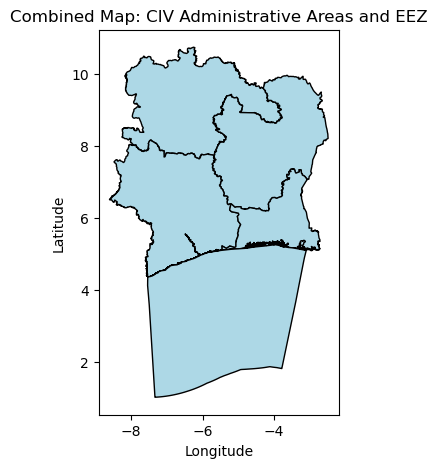

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [9]:
eez_civ['region'] = "E"
combined_regions = gpd.GeoDataFrame(pd.concat([merged_geo, eez_civ], ignore_index=True))
output_file = folder + "combined_eev_civ.gpkg"
combined_regions.to_file(output_file, driver="GPKG")
print("The combined regions are saved as combined_eev_civ.gpkg")
#print(combined_data)
combined_regions.plot(figsize=(5, 5), edgecolor="black", facecolor="lightblue")
plt.title("Combined Map: CIV Administrative Areas and EEZ")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()
combined_regions.crs

Identify the points for each region

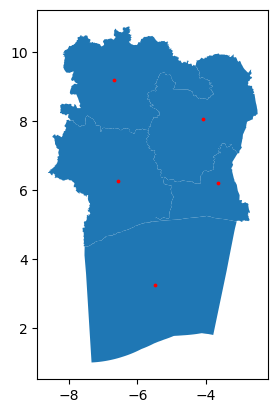

In [10]:
points = combined_regions.representative_point()
fig, ax = plt.subplots()
combined_regions.plot(ax=ax)
points.plot(ax=ax, color="red", markersize=3);

In [11]:
points = points.to_crs(4087)
points.index = combined_regions.region
distances = pd.concat({k: points.distance(p) for k, p in points.items()}, axis=1).div(1e3)

The coordinates of all points and their distances are as follows. Notice: the prejection is 4087.

In [12]:
points

region
A    POINT (-742961.364 1022630.512)
B      POINT (-454598.45 898330.513)
C     POINT (-730705.785 696518.327)
D     POINT (-405827.007 692359.994)
E     POINT (-609687.497 362913.956)
dtype: geometry

In [13]:
print(points) #  the projection is 4087.

region
A    POINT (-742961.364 1022630.512)
B      POINT (-454598.45 898330.513)
C     POINT (-730705.785 696518.327)
D     POINT (-405827.007 692359.994)
E     POINT (-609687.497 362913.956)
dtype: geometry


In [14]:
print(distances) # km

                 A           B           C          D           E
region                                                           
A         0.000000  314.012197  326.342391  471.95147  673.043727
B       314.012197    0.000000  341.999150  211.66603  557.425781
C       326.342391  341.999150    0.000000  324.90539  354.876461
D       471.951470  211.666030  324.905390    0.00000  387.419400
E       673.043727  557.425781  354.876461  387.41940    0.000000


## Renewable potentials（Region A，B，C，D）

In [15]:
import atlite
import geopandas as gpd
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import cartopy.crs as ccrs
from atlite.gis import ExclusionContainer, shape_availability
import xarray as xr
import pandas as pd

EPSG:4326


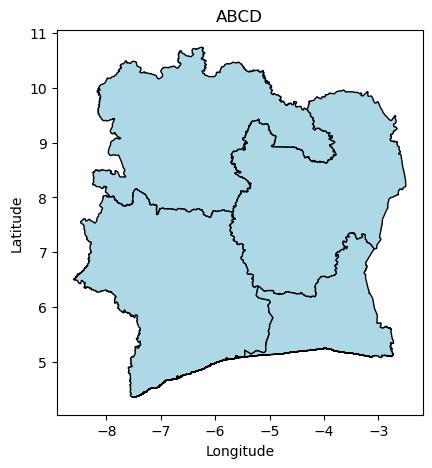

In [16]:
file_path = folder + "4_regions.gpkg"
ABCD = gpd.read_file(file_path)
#print(ABCD)
print(ABCD.crs)
ABCD.plot(figsize=(5,5), edgecolor="black", facecolor="lightblue")
plt.title("ABCD")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

The following code block demonstrates how to request weather data from ERA5 using atlite. However, the entire process is very time-consuming (each request takes 1 to 2 hours and requires the user to configure a `.cdsapi` file). The required weather data is uploaded in two files named "era5-2020-CIV.nc" and "era5-2020-region-E.nc". The cutout will directly locate and read the data.

In [17]:
# Load cutout xarray
minx, miny, maxx, maxy = ABCD.total_bounds
buffer = 0.25
cutout = atlite.Cutout(
    path = folder + "era5-2020-CIV.nc",
    module="era5",
    x=slice(minx - buffer, maxx + buffer),
    y=slice(miny - buffer, maxy + buffer),
    time="2020",
)

We choose a projection which is suitable for africa and the calculation of areas

In [18]:
AREA_CRS = "ESRI:54009"  # special crs for africa

In [19]:
def plot_area(masked, transform, shape):
    fig, ax = plt.subplots(figsize=(5, 5))
    ax = show(masked, transform=transform, cmap="Greens", vmin=0, ax=ax)
    shape.plot(ax=ax, edgecolor="k", color="None", linewidth=1)

Add some exclusions into excluder for wind_onshore

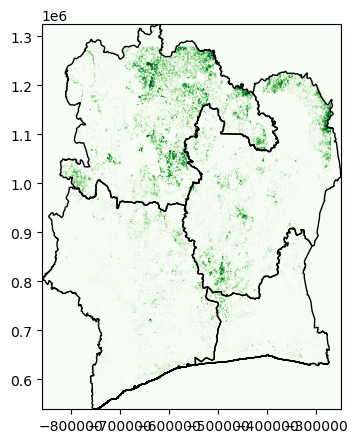

In [20]:
excluder_wind_onshore = ExclusionContainer(crs=AREA_CRS, res=300)
fn = folder + "PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326-CI.tif"
excluder_wind_onshore.add_raster(fn, codes=[50], buffer=1000, crs=4326)
excluder_wind_onshore.add_raster(fn, codes=[20, 30, 40, 60], crs=4326, invert=True)
fn = folder + "WDPA_Oct2022_Public_shp-CIV.tif"
excluder_wind_onshore.add_raster(fn, crs=3035)
fn = folder + "GEBCO_2014_2D-CI.nc"
excluder_wind_onshore.add_raster(fn, codes=lambda x: x >10, crs=4326, invert=True)
excluder_wind_onshore.add_raster(fn, codes=lambda x: x >2000, crs=4326)
fn = folder + "ne_10m_airports.gpkg"
excluder_wind_onshore.add_geometry(fn, buffer=10000)
fn = folder + "ne_10m_roads.gpkg"
excluder_wind_onshore.add_geometry(fn, buffer=300)
masked_1, transform_1 = shape_availability(ABCD.to_crs(AREA_CRS).geometry, excluder_wind_onshore)
plot_area(masked_1, transform_1, ABCD.to_crs(AREA_CRS).geometry)

Exclusions for solar

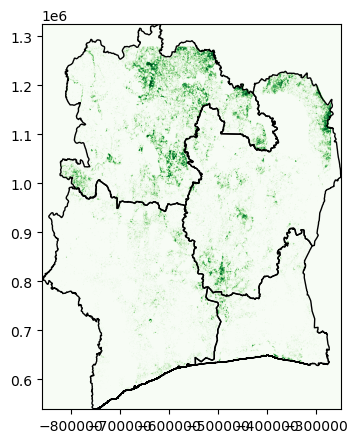

In [21]:
excluder_solar = ExclusionContainer(crs=AREA_CRS, res=300)
fn = folder + "PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326-CI.tif"
excluder_solar.add_raster(fn, codes=[50], buffer=1000, crs=4326)
excluder_solar.add_raster(fn, codes=[20, 30, 40, 60], crs=4326, invert=True)
fn = folder + "WDPA_Oct2022_Public_shp-CIV.tif"
excluder_solar.add_raster(fn, crs=3035)
masked_2, transform_2 = shape_availability(ABCD.to_crs(AREA_CRS).geometry, excluder_solar)
plot_area(masked_2, transform_2, ABCD.to_crs(AREA_CRS).geometry)

In [22]:
ABCD.set_index('region', inplace=True)

In [23]:
# Availability matrices
A_wind_on_shore = cutout.availabilitymatrix(ABCD, excluder_wind_onshore)
A_solar = cutout.availabilitymatrix(ABCD, excluder_solar)

In [24]:
# Determine capacity matrices (contain the maximum deployable capacities for every cell of the grid)
cap_per_sqkm = 3  # MW/km2

area = cutout.grid.set_index(["y", "x"]).to_crs(AREA_CRS).area / 1e6

area = xr.DataArray(area, dims=("spatial"))

capacity_matrix_wind_on_shore = A_wind_on_shore.stack(spatial=["y", "x"]) * area * cap_per_sqkm
capacity_matrix_solar = A_solar.stack(spatial=["y", "x"]) * area * cap_per_sqkm

In [25]:
# Store maximal deployable capacity for each region in a DataFrame
p_nom_max = pd.DataFrame(index=['solar', 'onwind', 'offwind'], columns=['A', 'B', 'C', 'D', 'E'])

for region in p_nom_max.columns[:-1]: # Exclude E
  p_nom_max.at['solar', region] = capacity_matrix_solar.sel(region=region).sum().item()
  p_nom_max.at['onwind', region] = capacity_matrix_wind_on_shore.sel(region=region).sum().item()

In [26]:
# Onshore wind capacity factor time series
wind = cutout.wind(
    atlite.windturbines.Vestas_V112_3MW,
    matrix=capacity_matrix_wind_on_shore,
    index=ABCD.index,
    per_unit=True,
)
wind.to_pandas().head()

region,A,B,C,D
time,,,,
2020-01-01 00:00:00,0.166150,0.106018,0.040451,0.007954
2020-01-01 01:00:00,0.172816,0.109675,0.040474,0.010271
2020-01-01 02:00:00,0.176686,0.108063,0.026544,0.007141
2020-01-01 03:00:00,0.169282,0.111990,0.011163,0.002792
2020-01-01 04:00:00,0.161394,0.127721,0.001217,0.000973


In [27]:
df = wind.to_pandas()
df.to_csv(folder + "wind_onshore_capacity_factors.csv")

In [28]:
# Solar capacity factor time series
pv = cutout.pv(
    panel=atlite.solarpanels.CdTe,
    matrix=capacity_matrix_solar,
    orientation="latitude_optimal",
    index=ABCD.index,
    per_unit=True,
)
pv.to_pandas().head()

region,A,B,C,D
time,,,,
2020-01-01 00:00:00,0.0,0.0,0.0,0.0
2020-01-01 01:00:00,0.0,0.0,0.0,0.0
2020-01-01 02:00:00,0.0,0.0,0.0,0.0
2020-01-01 03:00:00,0.0,0.0,0.0,0.0
2020-01-01 04:00:00,0.0,0.0,0.0,0.0


In [29]:
df1 = pv.to_pandas()

df1.to_csv(folder + "solar_capacity_factors.csv")

The capacity factor times series for the 2 renewable technologies are as follows. Each of them is saved as a ".csv" file into colab folder for the further pypsa model

## Renewable potentials（Region E）

In [30]:
fn = folder + "region_E.gpkg"
region_E = gpd.read_file(fn)

In [31]:
# Load cutout xarray
minx, miny, maxx, maxy = region_E.total_bounds
buffer = 0.25
cutout = atlite.Cutout(
    path = folder + "era5-2020-region-E.nc",
    module ="era5",
    x=slice(minx - buffer, maxx + buffer),
    y=slice(miny - buffer, maxy + buffer),
    time="2020",
)

In [32]:
AREA_CRS = "ESRI:54009"

In [33]:
# Create the 10km coastline buffer
fn = folder + "4_regions.gpkg"
land = gpd.read_file(fn)
coastline = land.boundary
coastline = coastline.to_crs(AREA_CRS)
coastline_buffer = coastline.buffer(10000)

In [34]:
excluder = ExclusionContainer(crs=AREA_CRS, res=300)

# 10km coastline buffer
excluder.add_geometry(coastline_buffer)
# natural protection areas
fn = folder + "WDPA_Oct2022_Public_shp-CIV.tif"
excluder.add_raster(fn, crs=3035)
# water depth
fn = folder + "GEBCO_2014_2D-CI.nc"
excluder.add_raster(fn, codes=lambda x: x >-50, crs=4326, invert=True)


In [35]:
masked, transform = shape_availability(region_E.to_crs(AREA_CRS).geometry, excluder)

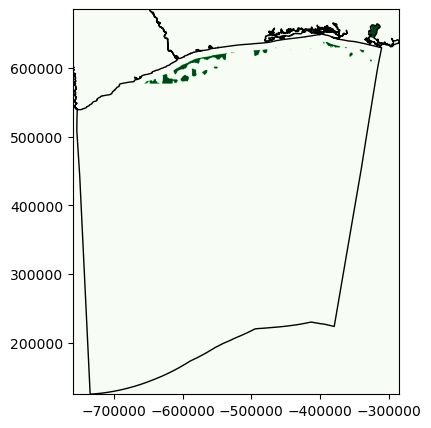

In [36]:
plot_area(masked, transform, region_E.to_crs(AREA_CRS).geometry)

In [37]:
# Availability matrix
A = cutout.availabilitymatrix(region_E, excluder)

In [38]:
# Determine capacity matrices (contain the maximum deployable capacities for every cell of the grid)
cap_per_sqkm = 3  # MW/km2

area = cutout.grid.set_index(["y", "x"]).to_crs(AREA_CRS).area / 1e6

area = xr.DataArray(area, dims=("spatial"))

capacity_matrix = A.stack(spatial=["y", "x"]) * area * cap_per_sqkm

In [39]:
# Store the maximal deployable capacity for the region E
p_nom_max.at['offwind', 'E'] = capacity_matrix.sum().item()

In [40]:
# Offshore wind capacity factor time series
wind = cutout.wind(
    turbine="NREL_ReferenceTurbine_5MW_offshore",
    matrix=capacity_matrix,
    index=region_E.index,
    per_unit=True,
)

Just for demonstration, visually

<Axes: xlabel='time'>

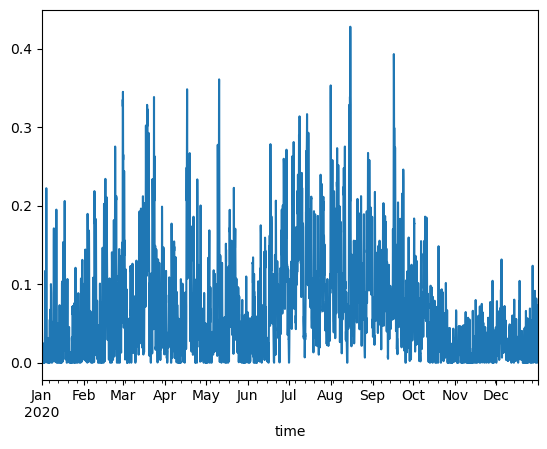

In [41]:
wind.to_pandas().head()
wind.to_pandas().iloc[:, 0].plot()

In [42]:
df2 = wind.to_pandas()
df2.to_csv(folder + "wind_offshore_capacity_factors.csv")


The coordinates of the nodes used for modeling and the distances between them are stored in the last two code blocks of the "Shape" section.



The capacity factors time series for renewable technologies can be found as follows:

wind onshore series for A, B, C, and D — "wind_onshore_capacity_factors.csv"

solar series for A, B, C, and D     — "solar_capacity_factors.csv".

wind offshore for E             — "wind_offshore_capacity_factors.csv".

## Building the Model

In [43]:
import pypsa
import plotly.express as px
import plotly.io as pio

# Set the renderer
pio.renderers.default = "plotly_mimetype" 

- Define the **year of projection** and pre-process **technologies costs** for this year.

In [44]:
year = 2030
costs = pd.read_csv(folder + "costs_{}.csv".format(year), index_col=[0, 1])

# Conversion in /MW
costs.loc[costs.unit.str.contains("/kW"), "value"] *= 1e3
costs.unit = costs.unit.str.replace("/kW", "/MW")

defaults = {
    "FOM": 0,
    "VOM": 0,
    "efficiency": 1,
    "fuel": 0,
    "investment": 0,
    "lifetime": 25,
    "CO2 intensity": 0,
    "discount rate": 0.07,
}
costs = costs.value.unstack().fillna(defaults)

costs.at["OCGT", "fuel"] = costs.at["gas", "fuel"]
costs.at["CCGT", "fuel"] = costs.at["gas", "fuel"]
costs.at["OCGT", "CO2 intensity"] = costs.at["gas", "CO2 intensity"]
costs.at["CCGT", "CO2 intensity"] = costs.at["gas", "CO2 intensity"]

In [45]:
def annuity(r, n):
    return r / (1.0 - 1.0 / (1.0 + r) ** n)

# Calculate marginal and capital costs
costs["marginal_cost"] = costs["VOM"] + costs["fuel"] / costs["efficiency"]
annuity = costs.apply(lambda x: annuity(x["discount rate"], x["lifetime"]), axis=1)
costs["capital_cost"] = (annuity + costs["FOM"] / 100) * costs["investment"]

- **Initialize** the model

In [46]:
n = pypsa.Network()

In [47]:
# Carriers
carriers = [
    "onwind",
    "offwind",
    "solar",
    "hydro",
    "OCGT",
    "hydrogen storage underground",
    "battery storage",
]

n.add(
    "Carrier",
    carriers,
    color=["dodgerblue", "aquamarine", "gold", "aqua", "indianred", "magenta", "yellowgreen"],
    co2_emissions=[costs.at[c, "CO2 intensity"] for c in carriers],
)

n.add("Carrier", ["links", "electricity", "AC"], color=["black"])

Index(['links', 'electricity', 'AC'], dtype='object')

In [48]:
# Buses
file_path = folder + "combined_eev_civ.gpkg"
ABCDE = gpd.read_file(file_path)
ABCDE.set_index("region", inplace=True)

regions = ABCDE.index
coordinates = points.to_crs(4326).get_coordinates() # points is a geodataframe containing the geometry of each region representative point


for region in regions:
  n.add("Bus", region, x=coordinates.loc[region, "x"], y=coordinates.loc[region, "y"], carrier="AC")

- Add the fleet of **existing power plants** from the global database of power plants from WRI

In [49]:
# Perform a spatial join on a GeoDataFrame of the fleet of existing power plants and on a GeoDataFrame of our regions
existing_power_plants = pd.read_csv(folder + "global_power_plant_database.csv", index_col=[0, 1])
existing_power_plants = existing_power_plants.query("country == 'CIV'")
geometry = gpd.points_from_xy(existing_power_plants['longitude'], existing_power_plants['latitude'])
existing_power_plants = gpd.GeoDataFrame(existing_power_plants, geometry=geometry, crs=4326)

joined = existing_power_plants.sjoin(ABCDE)

In [50]:
# Add existing power plants from each region to the pypsa Network
for region in regions:
  power_plants_region = joined.query("region == '{}'".format(region)).copy()
  power_plants_region['primary_fuel'] = power_plants_region['primary_fuel'].str.lower()
  sum_capacities = power_plants_region.groupby(by='primary_fuel')['capacity_mw'].sum()
  carriers = sum_capacities.index # carriers in use in the region

  for carrier in carriers:
    power_plants = power_plants_region.query("primary_fuel=='{}'".format(carrier)).copy()

    # gas = OCGT
    if carrier == "gas":
        n.add(
            "Generator",
            "OCGT_{}".format(region),
            bus=region,
            carrier="OCGT",
            p_nom=sum_capacities.loc[carrier],
            capital_cost=0,
            marginal_cost=costs.at["OCGT", "marginal_cost"],
            efficiency=costs.at["OCGT", "efficiency"],
        )

    # Special case for hydro
    elif carrier == "hydro":
      p_max_pu = (power_plants['estimated_generation_gwh_2017'].sum() /
       (power_plants['capacity_mw'].div(1e3).sum() * 24 * 365.25)) # constant capacity factor

      n.add(
          "Generator",
          "{}_{}".format(carrier, region),
          bus=region,
          carrier=carrier,
          p_nom=sum_capacities.loc[carrier],
          p_max_pu=p_max_pu,
          capital_cost=0,
          marginal_cost=costs.at[carrier, "marginal_cost"],
          efficiency=costs.at[carrier, "efficiency"],
      )

    # Do not add the power plant if it is a wind or solar generator
    elif ("wind" in carrier) or ("solar" in carrier):
      continue

    else:
      n.add(
          "Generator",
          "{}_{}".format(carrier, region),
          bus=region,
          carrier=carrier,
          p_nom=sum_capacities.loc[carrier],
          capital_cost=0,
          marginal_cost=costs.at[carrier, "marginal_cost"],
          efficiency=costs.at[carrier, "efficiency"],
      )


In [51]:
n.generators[['p_nom', 'p_max_pu']]

,p_nom,p_max_pu
Generator,,
hydro_B,174.0,0.360930
hydro_C,165.0,0.414107
OCGT_D,604.0,1.000000
hydro_D,260.0,0.437043


- Add the **load time series** for our year of projection from the GEGIS dataset

In [52]:
# Get load time series for Ivory Coast and downsample it
fn =  folder + "load.csv"
ts = pd.read_csv(fn, index_col=0, parse_dates=True)
load = ts["CI"] # MW
resolution = 3 # 3-hourly resolution
load = load.resample("{}h".format(resolution)).first()
load.index = load.index.map(lambda x: x.replace(year=year))

# Update the model
n.set_snapshots(load.index)
n.snapshot_weightings.loc[:, :] = resolution

In [53]:
# Add load per region in proportion to its population to the pypsa Network
population = {"A": 3780262, "B": 5220397, "C": 10523515, "D": 9864976}
population_total = sum(population.values())

for region in regions[:-1]: # exclude E
  load_region = load * population[region] / population_total

  n.add(
      "Load",
      "{} electricity demand".format(region),
      bus=region,
      p_set=load_region,
      carrier="electricity",
  )

loads = n.loads_t.p_set

In [54]:
# Plot loads per region

fig = px.line(loads)
fig.update_layout(
        title=dict(text='Loads per region'),
       yaxis=dict(title=dict(text='MW')),
)
fig.show()

In [55]:
loads.mean().round(0) # mean loads per region in MW

Load
A electricity demand    181.0
B electricity demand    250.0
C electricity demand    503.0
D electricity demand    472.0
dtype: float64

In [56]:
load.mean()

1405.7248861670707

- Add one **solar and on-/offshore wind generator** per region

In [57]:
# Get capacity factors and align them with loads time series
solar_capacity_factors = pd.read_csv(folder + "solar_capacity_factors.csv", index_col=0, parse_dates=True)
wind_onshore_capacity_factors = pd.read_csv(folder + "wind_onshore_capacity_factors.csv", index_col=0, parse_dates=True)
wind_offshore_capacity_factors = pd.read_csv(folder + "wind_offshore_capacity_factors.csv", index_col=0, parse_dates=True)

solar_capacity_factors = solar_capacity_factors[solar_capacity_factors.index.day_of_year!=60] # delete 2020-02-29
wind_onshore_capacity_factors = wind_onshore_capacity_factors[wind_onshore_capacity_factors.index.day_of_year!=60] # delete 2020-02-29
wind_offshore_capacity_factors = wind_offshore_capacity_factors[wind_offshore_capacity_factors.index.day_of_year!=60] # delete 2020-02-29

solar_capacity_factors.index = solar_capacity_factors.index.map(lambda x: x.replace(year=year))
wind_onshore_capacity_factors.index = wind_onshore_capacity_factors.index.map(lambda x: x.replace(year=year))
wind_offshore_capacity_factors.index = wind_offshore_capacity_factors.index.map(lambda x: x.replace(year=year))

solar_capacity_factors = solar_capacity_factors.resample("{}h".format(resolution)).first()
wind_onshore_capacity_factors = wind_onshore_capacity_factors.resample("{}h".format(resolution)).first()
wind_offshore_capacity_factors = wind_offshore_capacity_factors.resample("{}h".format(resolution)).first()

In [58]:
# Add the solar and on-/offshore wind generators to the pypsa Network
p_max_pu = {"solar": solar_capacity_factors, "onwind": wind_onshore_capacity_factors, "offwind": wind_offshore_capacity_factors}

for region in regions:
  if region == "E":
    n.add(
         "Generator",
          "offwind_{}".format(region),
          bus=region,
          carrier="offwind",
          p_nom_max=p_nom_max.at["offwind", region],
          p_max_pu=p_max_pu["offwind"]["0"],
          capital_cost=costs.at["offwind", "capital_cost"],
          marginal_cost=costs.at["offwind", "marginal_cost"],
          efficiency=costs.at["offwind", "efficiency"],
          p_nom_extendable=True
      )
    continue

  for carrier in ["solar", "onwind"]:
    n.add(
          "Generator",
          "{}_{}".format(carrier, region),
          bus=region,
          carrier=carrier,
          p_nom_max=p_nom_max.at[carrier, region],
          p_max_pu=p_max_pu[carrier][region],
          capital_cost=costs.at[carrier, "capital_cost"],
          marginal_cost=costs.at[carrier, "marginal_cost"],
          efficiency=costs.at[carrier, "efficiency"],
          p_nom_extendable=True
      )

In [59]:
n.generators['p_nom_max'].tail(9).round(0)

Generator
solar_A      33019.0
onwind_A     32732.0
solar_B      17923.0
onwind_B     17726.0
solar_C       7620.0
onwind_C      7465.0
solar_D       2750.0
onwind_D      2302.0
offwind_E     4240.0
Name: p_nom_max, dtype: float64

In [60]:
p_nom_max_solar = n.generators.loc[n.generators['carrier'] == "solar", 'p_nom_max']

- Add bidirectional Links as **transmission lines** between neighbouring regions

In [61]:
# Get neighbors for each region (including the region itself)
ABCDE_projected = ABCDE.to_crs(AREA_CRS)
neighbors = ABCDE_projected.sjoin_nearest(ABCDE_projected)["region_right"]

In [62]:
# Add links to the pypsa Network
done = set()

for region in regions:
  neighbors_region = neighbors.loc[region]

  for neighbor in neighbors_region:
    if (neighbor not in done) and (neighbor != region): # if the neighbor is not a previous region and not itself
      length = distances.at[region, neighbor] * 1.5

      n.add(
          "Link",
          "{}-{}".format(region, neighbor),
          bus0=region,
          bus1=neighbor,
          carrier="links",
          length=length,
          p_min_pu=-1,
          capital_cost=600 / length ,
          efficiency=1,
          p_nom_extendable=True
      )

    done.add(region)

In [63]:
n.links

,bus0,bus1,type,carrier,efficiency,active,build_year,lifetime,p_nom,p_nom_mod,...,shut_down_cost,min_up_time,min_down_time,up_time_before,down_time_before,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down,p_nom_opt
Link,,,,,,,,,,,,,,,,,,,,,
A-C,A,C,,links,1.0,True,0,inf,0.0,0.0,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
A-B,A,B,,links,1.0,True,0,inf,0.0,0.0,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
B-D,B,D,,links,1.0,True,0,inf,0.0,0.0,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
B-C,B,C,,links,1.0,True,0,inf,0.0,0.0,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
C-E,C,E,,links,1.0,True,0,inf,0.0,0.0,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
C-D,C,D,,links,1.0,True,0,inf,0.0,0.0,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
D-E,D,E,,links,1.0,True,0,inf,0.0,0.0,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0


- Add one **battery storage** and one **hydrogen storage** per region

In [64]:
for region in regions:

  n.add(
      "StorageUnit",
      "battery storage_{}".format(region),
      carrier="battery storage",
      bus=region,
      max_hours=6,
      capital_cost=costs.at["battery inverter", "capital_cost"]
      + 6 * costs.at["battery storage", "capital_cost"],
      efficiency_store=costs.at["battery inverter", "efficiency"],
      efficiency_dispatch=costs.at["battery inverter", "efficiency"],
      p_nom_extendable=True,
      cyclic_state_of_charge=True,
  )

In [65]:
capital_costs = (
    costs.at["electrolysis", "capital_cost"]
    + costs.at["fuel cell", "capital_cost"]
    + 300 * costs.at["hydrogen storage underground", "capital_cost"]
)

for region in regions:

  n.add(
      "StorageUnit",
      "hydrogen storage underground_{}".format(region),
      carrier="hydrogen storage underground",
      bus=region,
      max_hours=300,
      capital_cost=capital_costs,
      efficiency_store=costs.at["electrolysis", "efficiency"],
      efficiency_dispatch=costs.at["fuel cell", "efficiency"],
      p_nom_extendable=True,
      cyclic_state_of_charge=True,
  )

### Without CO2 limitation

- **Optimize** the model

In [66]:
n.optimize(solver_name="gurobi")

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter WLSAccessID


INFO:gurobipy:Set parameter WLSAccessID


Set parameter WLSSecret


INFO:gurobipy:Set parameter WLSSecret


Set parameter LicenseID to value 2619906


INFO:gurobipy:Set parameter LicenseID to value 2619906


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.43it/s]
INFO:linopy.io: Writing time: 5.02s


Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-jhf4s91a.lp


INFO:gurobipy:Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-jhf4s91a.lp


Reading time = 1.14 seconds


INFO:gurobipy:Reading time = 1.14 seconds


obj: 335848 rows, 146026 columns, 732801 nonzeros


INFO:gurobipy:obj: 335848 rows, 146026 columns, 732801 nonzeros


Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


Optimize a model with 335848 rows, 146026 columns and 732801 nonzeros


INFO:gurobipy:Optimize a model with 335848 rows, 146026 columns and 732801 nonzeros


Model fingerprint: 0x723762cd


INFO:gurobipy:Model fingerprint: 0x723762cd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [8e-09, 3e+02]


INFO:gurobipy:  Matrix range     [8e-09, 3e+02]


  Objective range  [3e-02, 5e+05]


INFO:gurobipy:  Objective range  [3e-02, 5e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [6e+01, 1e+100]


INFO:gurobipy:  RHS range        [6e+01, 1e+100]


INFO:gurobipy:Warning: Model contains large rhs


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 163722 rows and 11834 columns


INFO:gurobipy:Presolve removed 163722 rows and 11834 columns


Presolve time: 1.61s


INFO:gurobipy:Presolve time: 1.61s


Presolved: 172126 rows, 134192 columns, 606658 nonzeros


INFO:gurobipy:Presolved: 172126 rows, 134192 columns, 606658 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.20s


INFO:gurobipy:Ordering time: 0.20s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 5.922e+05


INFO:gurobipy: AA' NZ     : 5.922e+05


 Factor NZ  : 2.646e+06 (roughly 150 MB of memory)


INFO:gurobipy: Factor NZ  : 2.646e+06 (roughly 150 MB of memory)


 Factor Ops : 7.348e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 7.348e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.17545005e+12 -1.04596711e+13  3.27e+04 3.35e+03  1.90e+10     3s


INFO:gurobipy:   0   1.17545005e+12 -1.04596711e+13  3.27e+04 3.35e+03  1.90e+10     3s


   1   1.43735725e+12 -1.08817301e+13  2.37e+04 1.73e+06  1.59e+10     3s


INFO:gurobipy:   1   1.43735725e+12 -1.08817301e+13  2.37e+04 1.73e+06  1.59e+10     3s


   2   1.42133801e+12 -1.26664382e+13  2.16e+04 1.14e+06  1.16e+10     3s


INFO:gurobipy:   2   1.42133801e+12 -1.26664382e+13  2.16e+04 1.14e+06  1.16e+10     3s


   3   1.02031927e+12 -1.88446412e+13  1.54e+04 3.21e+05  5.57e+09     3s


INFO:gurobipy:   3   1.02031927e+12 -1.88446412e+13  1.54e+04 3.21e+05  5.57e+09     3s


   4   5.73864605e+11 -1.78832534e+13  8.48e+03 9.10e+04  2.11e+09     4s


INFO:gurobipy:   4   5.73864605e+11 -1.78832534e+13  8.48e+03 9.10e+04  2.11e+09     4s


   5   1.03990422e+11 -1.28057022e+13  1.15e+03 1.24e+04  3.27e+08     5s


INFO:gurobipy:   5   1.03990422e+11 -1.28057022e+13  1.15e+03 1.24e+04  3.27e+08     5s


   6   4.91448039e+10 -7.64468255e+12  3.18e+02 4.36e+03  1.12e+08     5s


INFO:gurobipy:   6   4.91448039e+10 -7.64468255e+12  3.18e+02 4.36e+03  1.12e+08     5s


   7   3.71213067e+10 -4.37460916e+12  1.44e+02 1.86e+03  4.88e+07     5s


INFO:gurobipy:   7   3.71213067e+10 -4.37460916e+12  1.44e+02 1.86e+03  4.88e+07     5s


   8   3.08778648e+10 -2.15849154e+12  5.69e+01 7.22e+02  1.91e+07     5s


INFO:gurobipy:   8   3.08778648e+10 -2.15849154e+12  5.69e+01 7.22e+02  1.91e+07     5s


   9   2.68103700e+10 -4.34822757e+11  8.06e-02 9.44e+01  2.72e+06     6s


INFO:gurobipy:   9   2.68103700e+10 -4.34822757e+11  8.06e-02 9.44e+01  2.72e+06     6s


  10   2.50872760e+10 -5.82717307e+10  5.57e-10 1.47e+01  4.49e+05     6s


INFO:gurobipy:  10   2.50872760e+10 -5.82717307e+10  5.57e-10 1.47e+01  4.49e+05     6s


  11   2.04786890e+10 -3.84387850e+10  6.51e-10 1.03e+01  2.96e+05     6s


INFO:gurobipy:  11   2.04786890e+10 -3.84387850e+10  6.51e-10 1.03e+01  2.96e+05     6s


  12   1.30206974e+10 -2.03646456e+10  4.22e-10 5.77e+00  1.53e+05     6s


INFO:gurobipy:  12   1.30206974e+10 -2.03646456e+10  4.22e-10 5.77e+00  1.53e+05     6s


  13   1.12671755e+10 -1.73415724e+10  2.73e-10 5.01e+00  1.28e+05     7s


INFO:gurobipy:  13   1.12671755e+10 -1.73415724e+10  2.73e-10 5.01e+00  1.28e+05     7s


  14   8.53613297e+09 -7.97159678e+09  3.18e-10 2.65e+00  6.96e+04     7s


INFO:gurobipy:  14   8.53613297e+09 -7.97159678e+09  3.18e-10 2.65e+00  6.96e+04     7s


  15   4.00481517e+09 -2.97281996e+09  4.47e-10 1.13e+00  2.78e+04     7s


INFO:gurobipy:  15   4.00481517e+09 -2.97281996e+09  4.47e-10 1.13e+00  2.78e+04     7s


  16   2.19355445e+09 -1.22007427e+09  2.74e-10 5.46e-01  1.32e+04     7s


INFO:gurobipy:  16   2.19355445e+09 -1.22007427e+09  2.74e-10 5.46e-01  1.32e+04     7s


  17   1.45910602e+09 -1.23264147e+08  6.00e-10 1.87e-01  5.85e+03     7s


INFO:gurobipy:  17   1.45910602e+09 -1.23264147e+08  6.00e-10 1.87e-01  5.85e+03     7s


  18   1.00344562e+09  1.80485703e+08  2.88e-09 1.01e-01  3.03e+03     8s


INFO:gurobipy:  18   1.00344562e+09  1.80485703e+08  2.88e-09 1.01e-01  3.03e+03     8s


  19   7.22963083e+08  3.48813662e+08  6.14e-09 5.67e-02  1.40e+03     8s


INFO:gurobipy:  19   7.22963083e+08  3.48813662e+08  6.14e-09 5.67e-02  1.40e+03     8s


  20   6.56028700e+08  4.24645292e+08  1.99e-08 3.54e-02  8.69e+02     9s


INFO:gurobipy:  20   6.56028700e+08  4.24645292e+08  1.99e-08 3.54e-02  8.69e+02     9s


  21   6.30863846e+08  4.64340400e+08  1.40e-08 2.43e-02  6.22e+02     9s


INFO:gurobipy:  21   6.30863846e+08  4.64340400e+08  1.40e-08 2.43e-02  6.22e+02     9s


  22   6.09286762e+08  5.03502237e+08  4.17e-08 1.40e-02  3.91e+02     9s


INFO:gurobipy:  22   6.09286762e+08  5.03502237e+08  4.17e-08 1.40e-02  3.91e+02     9s


  23   5.99412095e+08  5.21054280e+08  6.49e-08 9.63e-03  2.88e+02     9s


INFO:gurobipy:  23   5.99412095e+08  5.21054280e+08  6.49e-08 9.63e-03  2.88e+02     9s


  24   5.87297123e+08  5.36725027e+08  1.97e-07 5.83e-03  1.85e+02    10s


INFO:gurobipy:  24   5.87297123e+08  5.36725027e+08  1.97e-07 5.83e-03  1.85e+02    10s


  25   5.82769564e+08  5.47659153e+08  7.11e-07 3.46e-03  1.27e+02    10s


INFO:gurobipy:  25   5.82769564e+08  5.47659153e+08  7.11e-07 3.46e-03  1.27e+02    10s


  26   5.76658233e+08  5.53254900e+08  1.86e-06 2.25e-03  8.41e+01    10s


INFO:gurobipy:  26   5.76658233e+08  5.53254900e+08  1.86e-06 2.25e-03  8.41e+01    10s


  27   5.75227700e+08  5.58426182e+08  1.45e-06 1.10e-03  5.90e+01    11s


INFO:gurobipy:  27   5.75227700e+08  5.58426182e+08  1.45e-06 1.10e-03  5.90e+01    11s


  28   5.68882356e+08  5.60568065e+08  2.49e-06 5.99e-04  2.92e+01    11s


INFO:gurobipy:  28   5.68882356e+08  5.60568065e+08  2.49e-06 5.99e-04  2.92e+01    11s


  29   5.67338227e+08  5.62412255e+08  3.55e-06 1.99e-04  1.69e+01    11s


INFO:gurobipy:  29   5.67338227e+08  5.62412255e+08  3.55e-06 1.99e-04  1.69e+01    11s


  30   5.65622861e+08  5.62925085e+08  7.96e-06 8.83e-05  9.18e+00    11s


INFO:gurobipy:  30   5.65622861e+08  5.62925085e+08  7.96e-06 8.83e-05  9.18e+00    11s


  31   5.65212938e+08  5.62954356e+08  6.18e-06 8.19e-05  7.68e+00    12s


INFO:gurobipy:  31   5.65212938e+08  5.62954356e+08  6.18e-06 8.19e-05  7.68e+00    12s


  32   5.65046208e+08  5.63133941e+08  5.46e-06 4.32e-05  6.45e+00    12s


INFO:gurobipy:  32   5.65046208e+08  5.63133941e+08  5.46e-06 4.32e-05  6.45e+00    12s


  33   5.64087123e+08  5.63232670e+08  4.64e-06 2.42e-05  2.88e+00    12s


INFO:gurobipy:  33   5.64087123e+08  5.63232670e+08  4.64e-06 2.42e-05  2.88e+00    12s


  34   5.63675549e+08  5.63321546e+08  2.83e-06 1.04e-05  1.19e+00    12s


INFO:gurobipy:  34   5.63675549e+08  5.63321546e+08  2.83e-06 1.04e-05  1.19e+00    12s


  35   5.63509601e+08  5.63383781e+08  1.47e-06 1.42e-06  4.20e-01    12s


INFO:gurobipy:  35   5.63509601e+08  5.63383781e+08  1.47e-06 1.42e-06  4.20e-01    12s


  36   5.63479772e+08  5.63389011e+08  1.04e-06 8.89e-07  3.03e-01    13s


INFO:gurobipy:  36   5.63479772e+08  5.63389011e+08  1.04e-06 8.89e-07  3.03e-01    13s


  37   5.63461230e+08  5.63391277e+08  7.85e-07 3.01e-06  2.33e-01    13s


INFO:gurobipy:  37   5.63461230e+08  5.63391277e+08  7.85e-07 3.01e-06  2.33e-01    13s


  38   5.63433377e+08  5.63396562e+08  4.21e-07 7.03e-07  1.23e-01    13s


INFO:gurobipy:  38   5.63433377e+08  5.63396562e+08  4.21e-07 7.03e-07  1.23e-01    13s


  39   5.63413616e+08  5.63399614e+08  8.10e-07 1.44e-05  4.66e-02    13s


INFO:gurobipy:  39   5.63413616e+08  5.63399614e+08  8.10e-07 1.44e-05  4.66e-02    13s


  40   5.63412857e+08  5.63399867e+08  7.64e-07 1.17e-05  4.33e-02    13s


INFO:gurobipy:  40   5.63412857e+08  5.63399867e+08  7.64e-07 1.17e-05  4.33e-02    13s


  41   5.63412797e+08  5.63400016e+08  7.58e-07 1.04e-05  4.26e-02    14s


INFO:gurobipy:  41   5.63412797e+08  5.63400016e+08  7.58e-07 1.04e-05  4.26e-02    14s


  42   5.63410493e+08  5.63400456e+08  6.01e-07 6.55e-06  3.34e-02    14s


INFO:gurobipy:  42   5.63410493e+08  5.63400456e+08  6.01e-07 6.55e-06  3.34e-02    14s


  43   5.63407212e+08  5.63400651e+08  3.88e-07 4.68e-06  2.19e-02    14s


INFO:gurobipy:  43   5.63407212e+08  5.63400651e+08  3.88e-07 4.68e-06  2.19e-02    14s


  44   5.63406674e+08  5.63400897e+08  3.54e-07 2.53e-06  1.92e-02    15s


INFO:gurobipy:  44   5.63406674e+08  5.63400897e+08  3.54e-07 2.53e-06  1.92e-02    15s


  45   5.63403136e+08  5.63401133e+08  1.20e-07 5.02e-07  6.67e-03    15s


INFO:gurobipy:  45   5.63403136e+08  5.63401133e+08  1.20e-07 5.02e-07  6.67e-03    15s


  46   5.63401826e+08  5.63401211e+08  3.63e-08 5.71e-08  2.05e-03    16s


INFO:gurobipy:  46   5.63401826e+08  5.63401211e+08  3.63e-08 5.71e-08  2.05e-03    16s


  47   5.63401754e+08  5.63401219e+08  3.19e-08 6.14e-08  1.78e-03    16s


INFO:gurobipy:  47   5.63401754e+08  5.63401219e+08  3.19e-08 6.14e-08  1.78e-03    16s


  48   5.63401715e+08  5.63401226e+08  2.92e-08 6.74e-08  1.63e-03    16s


INFO:gurobipy:  48   5.63401715e+08  5.63401226e+08  2.92e-08 6.74e-08  1.63e-03    16s


  49   5.63401292e+08  5.63401241e+08  2.04e-09 7.76e-08  1.70e-04    17s


INFO:gurobipy:  49   5.63401292e+08  5.63401241e+08  2.04e-09 7.76e-08  1.70e-04    17s


  50   5.63401260e+08  5.63401245e+08  5.63e-10 5.00e-08  4.92e-05    17s


INFO:gurobipy:  50   5.63401260e+08  5.63401245e+08  5.63e-10 5.00e-08  4.92e-05    17s


  51   5.63401256e+08  5.63401247e+08  3.80e-10 1.02e-08  3.09e-05    17s


INFO:gurobipy:  51   5.63401256e+08  5.63401247e+08  3.80e-10 1.02e-08  3.09e-05    17s


  52   5.63401253e+08  5.63401247e+08  2.43e-10 2.60e-09  2.02e-05    17s


INFO:gurobipy:  52   5.63401253e+08  5.63401247e+08  2.43e-10 2.60e-09  2.02e-05    17s


  53   5.63401250e+08  5.63401247e+08  1.17e-10 7.59e-08  9.92e-06    18s


INFO:gurobipy:  53   5.63401250e+08  5.63401247e+08  1.17e-10 7.59e-08  9.92e-06    18s


  54   5.63401248e+08  5.63401247e+08  3.55e-11 7.12e-08  3.40e-06    18s


INFO:gurobipy:  54   5.63401248e+08  5.63401247e+08  3.55e-11 7.12e-08  3.40e-06    18s


  55   5.63401247e+08  5.63401247e+08  1.60e-09 4.13e-08  2.58e-07    18s


INFO:gurobipy:  55   5.63401247e+08  5.63401247e+08  1.60e-09 4.13e-08  2.58e-07    18s


  56   5.63401247e+08  5.63401247e+08  1.02e-10 1.07e-08  3.99e-10    18s


INFO:gurobipy:  56   5.63401247e+08  5.63401247e+08  1.02e-10 1.07e-08  3.99e-10    18s


INFO:gurobipy:


Barrier solved model in 56 iterations and 18.31 seconds (4.81 work units)


INFO:gurobipy:Barrier solved model in 56 iterations and 18.31 seconds (4.81 work units)


Optimal objective 5.63401247e+08


INFO:gurobipy:Optimal objective 5.63401247e+08


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   75863 DPushes remaining with DInf 2.4931200e-03                18s


INFO:gurobipy:   75863 DPushes remaining with DInf 2.4931200e-03                18s


       0 DPushes remaining with DInf 2.4931200e-03                19s


INFO:gurobipy:       0 DPushes remaining with DInf 2.4931200e-03                19s


INFO:gurobipy:


   20769 PPushes remaining with PInf 1.7915509e-01                19s


INFO:gurobipy:   20769 PPushes remaining with PInf 1.7915509e-01                19s


       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2443959e-02     20s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.2443959e-02     20s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   60543    5.6340125e+08   0.000000e+00   1.244396e-02     20s


INFO:gurobipy:   60543    5.6340125e+08   0.000000e+00   1.244396e-02     20s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


   60565    5.6340125e+08   0.000000e+00   0.000000e+00     20s


INFO:gurobipy:   60565    5.6340125e+08   0.000000e+00   0.000000e+00     20s


INFO:gurobipy:


Solved in 60565 iterations and 19.99 seconds (6.11 work units)


INFO:gurobipy:Solved in 60565 iterations and 19.99 seconds (6.11 work units)


Optimal objective  5.634012471e+08


INFO:gurobipy:Optimal objective  5.634012471e+08


INFO:gurobipy:Warning: environment still referenced so free is deferred (Continue to use WLS)
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 146026 primals, 335848 duals
Objective: 5.63e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper, StorageUnit-ext-p_dispatch-lower, StorageUnit-ext-p_dispatch-upper, StorageUnit-ext-p_store-lower, StorageUnit-ext-p_store-upper, StorageUnit-ext-state_of_charge-lower, StorageUnit-ext-state_of_charge-upper, StorageUnit-energy_balance were not assigned to the network.


('ok', 'optimal')

- Total system cost per technology per year

In [67]:
def plot_total_costs():
    system_cost = pd.DataFrame(columns=['cost_k€'])

    for component_c, carrier_c in n.statistics.capex().index:
        # Add capital expenditures
        system_cost.loc[carrier_c] = n.statistics.capex().at[component_c, carrier_c] / 1e3 # k€
    
        if component_c == 'Generator': # look for operaional expenditures if the element is a generator
            for component_o, carrier_o in n.statistics.opex().index:
                # Add operational expenditures
                system_cost.loc[carrier_o] = n.statistics.opex().at[component_o, carrier_o] / 1e3 # k€
                system_cost.loc[carrier_c] += n.statistics.capex().at[component_c, carrier_c] / 1e3 # k€
    
    # Plot a pie chart

    # Function to display absolute values instead of percentages
    def absolute_value(val):
        a = round(val * system_cost['cost_k€'].sum() / 100, 2)  # Convert percentage to absolute value
        return f'{a}'  # Format as an integer
    
    system_cost['color'] = n.carriers.loc[system_cost.index, 'color']
    
    system_cost.plot.pie(subplots=True,
                         figsize=(10, 6),
                         y='cost_k€',
                         colors=system_cost['color'],
                         legend=False,
                         autopct=absolute_value
                         )
    plt.ylabel('')
    plt.title('Total system cost per technology (k€)')

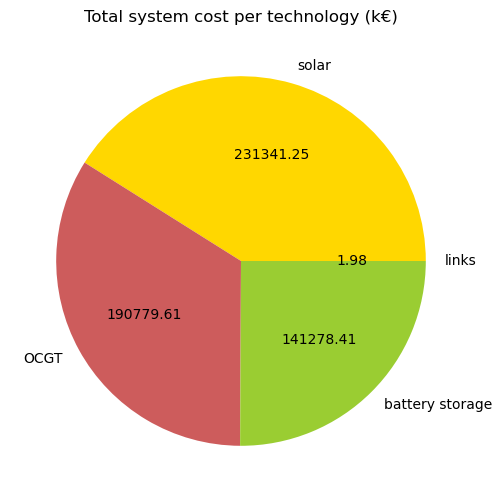

In [68]:
plot_total_costs()

- Capacities built per technologies

In [69]:
def plot_capacities():
    capacities_opt = n.generators[['carrier', 'p_nom_opt']].groupby(by="carrier").sum()  # MW
    capacities_opt = capacities_opt.query("p_nom_opt != 0") 

    capacities_opt['color'] = n.carriers.loc[capacities_opt.index, 'color']
        
    fig = px.bar(capacities_opt['p_nom_opt'], color=capacities_opt.index, color_discrete_sequence=capacities_opt['color'])
    fig.update_layout(
            title=dict(text='Capacities built'),
           yaxis=dict(title=dict(text='MW')),
    )
    fig.show()

    return(capacities_opt)

In [70]:
capacities_opt = plot_capacities()

- Electricity mix per generator

In [71]:
def plot_generators_dispatch():
    generator_mix = pd.DataFrame(n.snapshot_weightings.generators @ n.generators_t.p) # MWh
    generator_mix = generator_mix.query("generators != 0").div(1e6)
    
    for generator in generator_mix.index:
        tech = generator.split('_')[0]
        generator_mix.at[generator, 'color'] = n.carriers.loc[tech, 'color']
        
    fig = px.bar(generator_mix['generators'], color=generator_mix.index, color_discrete_sequence=generator_mix['color'])
    fig.update_layout(
            title=dict(text='Dispatch'),
           yaxis=dict(title=dict(text='TWh')),
    )
    fig.show()

    return(generator_mix)

In [72]:
generator_mix = plot_generators_dispatch()

- Electricity mix per technology

In [73]:
import numpy as np

In [74]:
def plot_technologies_dispatch():
    tech_mix = pd.DataFrame(np.zeros(len(capacities_opt.index)),
                            index=capacities_opt.index,
                            columns=["generated_TWh"], dtype=int)
    
    for generator in generator_mix.index:
      tech = generator.split("_")[0]
      tech_mix.at[tech, "generated_TWh"] += generator_mix.at[generator, 'generators'] # TWh

    # Plot a pie chart

    # Function to display absolute values instead of percentages
    def absolute_value(val):
        a = round(val * tech_mix['generated_TWh'].sum() / 100, 2)  # Convert percentage to absolute value
        return f'{a}'  # Format as an integer
    
    tech_mix['color'] = n.carriers.loc[tech_mix.index, 'color']
    
    tech_mix.plot.pie(subplots=True, 
                      figsize=(10, 6), 
                      y='generated_TWh', 
                      colors=tech_mix['color'], 
                      legend=False, 
                      autopct=absolute_value)
    plt.ylabel('')  # Remove y-label for aesthetics
    plt.title('Electricity generated per technology (TWh)')

    return(tech_mix)

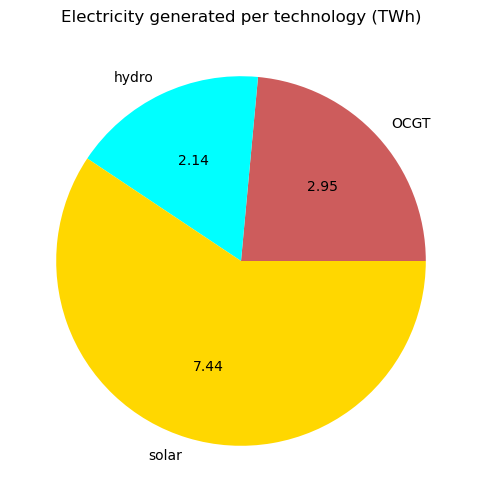

In [75]:
tech_mix = plot_technologies_dispatch()

- CO2 price

In [76]:
def co2_price():
    emissions = (
        n.generators_t.p
        / n.generators.efficiency
        * n.generators.carrier.map(n.carriers.co2_emissions)
    )  # t/h
    
    carbon_price = 11.79 # €/t, price in Ivory Coast in 2023 according to OECD
    total_emissions = n.snapshot_weightings.generators @ emissions.sum(axis=1) # t
    
    total_carbon_price = round(carbon_price * total_emissions / 1e6, 2) # M€
    
    print("The CO2 price of the optimized system is {} M€/a".format(total_carbon_price))

In [77]:
co2_price()

The CO2 price of the optimized system is 16.79 M€/a


- Price duration curves

In [78]:
def plot_price_curves():
    for region in regions:
    
      marginal_prices = n.buses_t.marginal_price[region] # €/MWh
    
      marginal_prices_values = marginal_prices.sort_values(ascending=False).values
    
      time = np.arange(len(marginal_prices_values))
      ticks = [len(time)*(i/5) for i in range(6)]
      percentages = np.linspace(0, 100, 6, dtype=np.int32)
    
      plt.figure(figsize=(10, 6))
      plt.plot(time, marginal_prices_values, color='pink')
      plt.fill_between(time, marginal_prices_values, color='pink', alpha=0.3)
      plt.title("Price duration curve in region {}".format(region))
      plt.xticks(ticks=ticks, labels=percentages)
      plt.xlabel("Percentage of time during the year")
      plt.ylabel("Price (€/MWh)")
    
      plt.show()

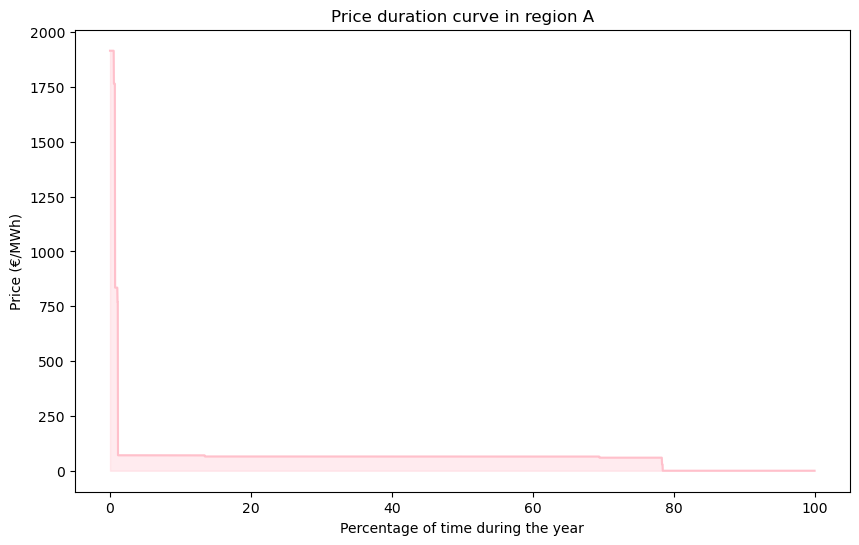

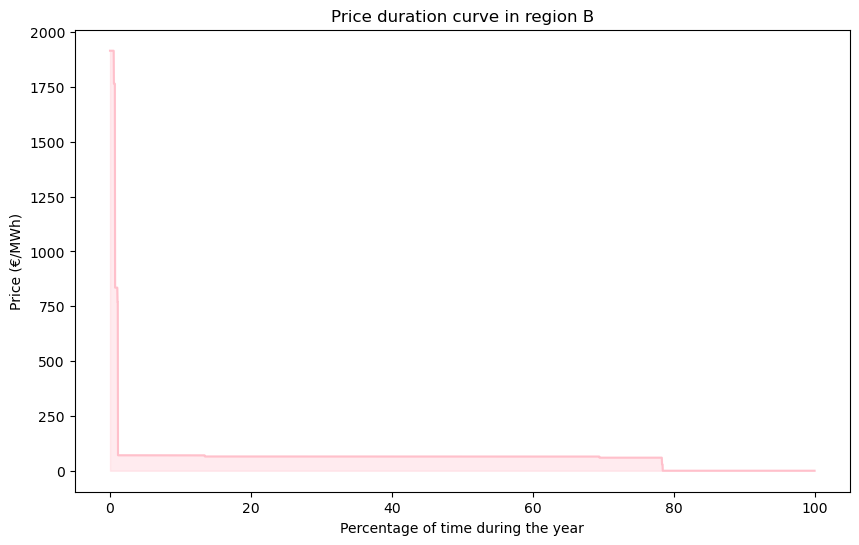

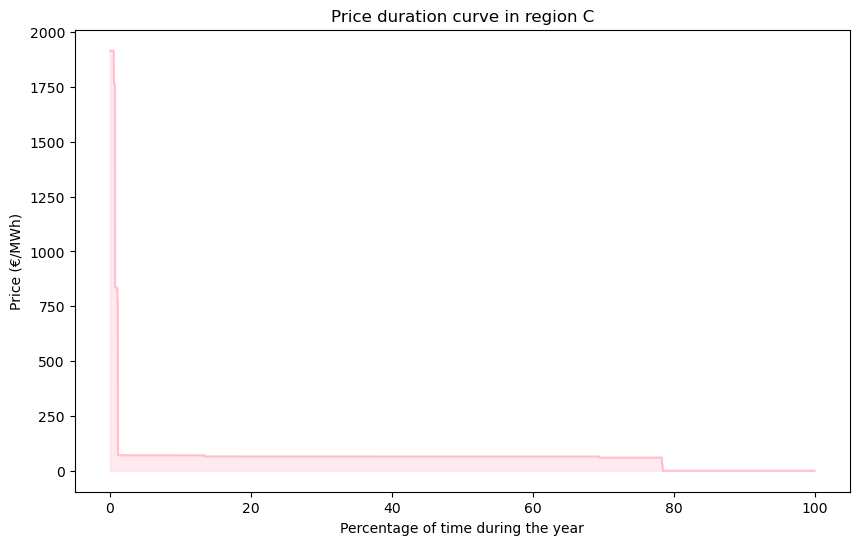

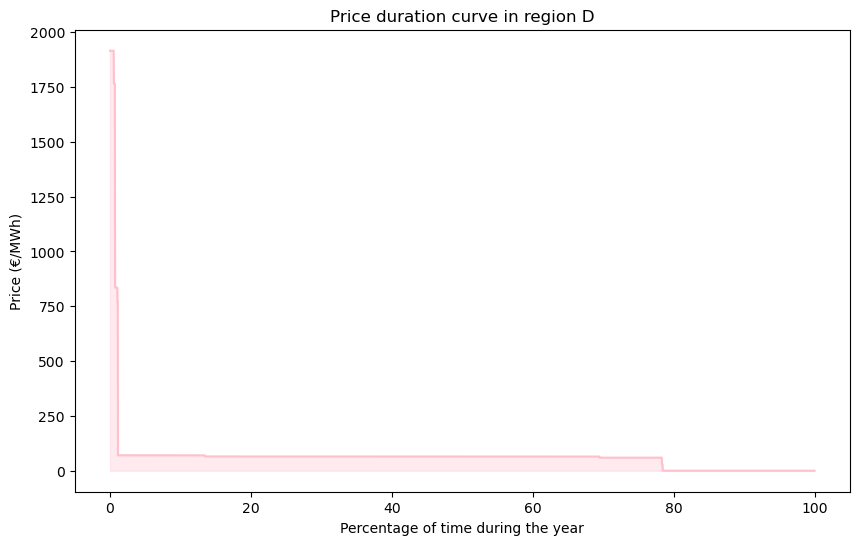

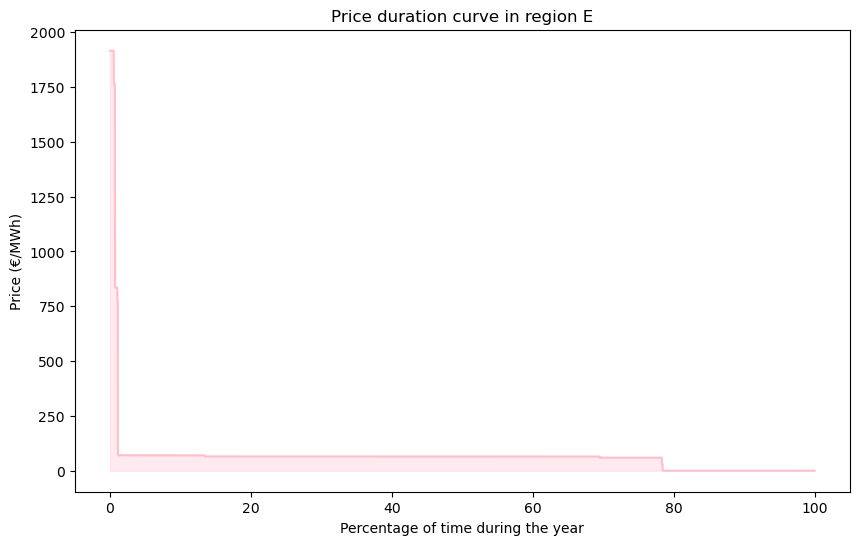

In [79]:
plot_price_curves()

- Average electricity prices per region

In [80]:
n.buses_t.marginal_price.mean() # €/MWh

Bus
A    67.098563
B    67.098709
C    67.098703
D    67.098563
E    67.098680
dtype: float64

- Rate of curtailment

In [81]:
tech_mix

,generated_TWh,color
carrier,,
OCGT,2.949412,indianred
hydro,2.144101,aqua
solar,7.440002,gold


In [82]:
def curtailments():
    curtailments = n.statistics.curtailment().loc["Generator"].div(1e6) #TWh
    
    for carrier in curtailments.index:
      curtailments.at[carrier] = (curtailments.at[carrier] /
                                (curtailments.at[carrier] + tech_mix.at[carrier, "generated_TWh"]))
    
    print(curtailments.round(2)) # rate

In [83]:
curtailments()

carrier
OCGT     0.44
solar    0.06
dtype: float64


- Storage filling levels

In [84]:
def plot_storage():
    # Retrieve built storage units
    storage = n.storage_units.query("p_nom_opt != 0")

    # Plot the states of charge for every storage unit in weeks of abundance and
    #scarcity of solar, onwind and offwind
    
    for unit in storage.index:
      region = storage.at[unit, 'bus']
    
      for tech in p_max_pu.keys(): # "solar", "onwind", "offwind"
        # Retrieve capacity factors per region for the given technology and group them by week
        cf = p_max_pu[tech].copy()
        cf['day'] = cf.index.day_of_year
        cf['week'] = np.ceil(cf['day'] / 7)
        weekly_cf = cf.groupby(by='week').mean()
    
        # Compute the mean capacity factors for Ivory Coast per week
        weekly_cf = weekly_cf.drop(columns='day').mean(axis=1)
        abundance = weekly_cf.idxmax() # week with the highest mean capacity factor
        scarcity = weekly_cf.idxmin() # week with the lowest mean capacity factor
    
        for week_type in ["abundance", "scarcity"]:
          if week_type == "abundance":
            week_index = abundance
    
          if week_type == "scarcity":
            week_index = scarcity
    
          # Get dates of the week_type and the state of charge for those dates
          dates = cf.query("week == @week_index").index
          state_of_charge = n.storage_units_t.state_of_charge.loc[dates][unit].div(1e3) # GWh
    
          _, ax = plt.subplots(figsize=(10, 6))
          ax.set_xlabel('')
          ax.set_ylabel('State of charge (GWh)')
          ax.set_title('State of charge of {} for a week of {} of {}'.format(unit, week_type, tech))
    
          carrier = storage.loc[unit, 'carrier']
          color = n.carriers.loc[carrier, 'color']
          state_of_charge.plot(ax=ax, color=color)
          ax.fill_between(state_of_charge.index, state_of_charge, color=color, alpha=0.3)
          ax.set_xlabel('')

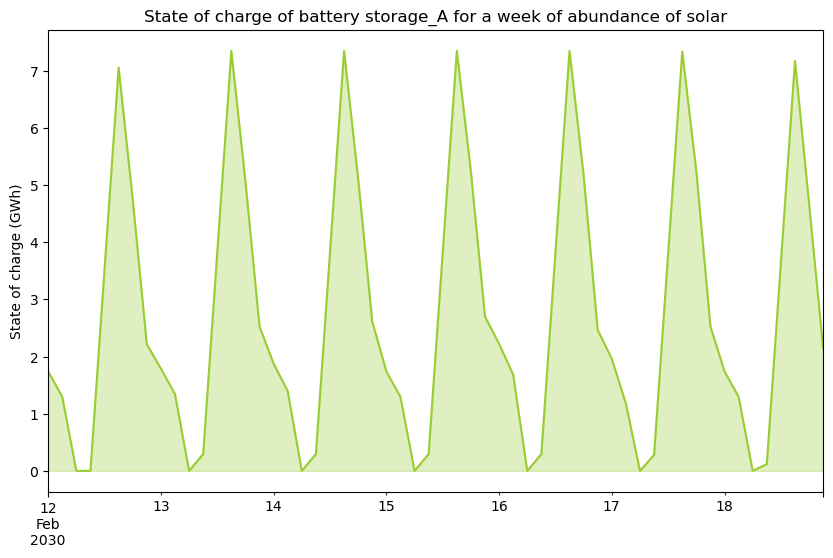

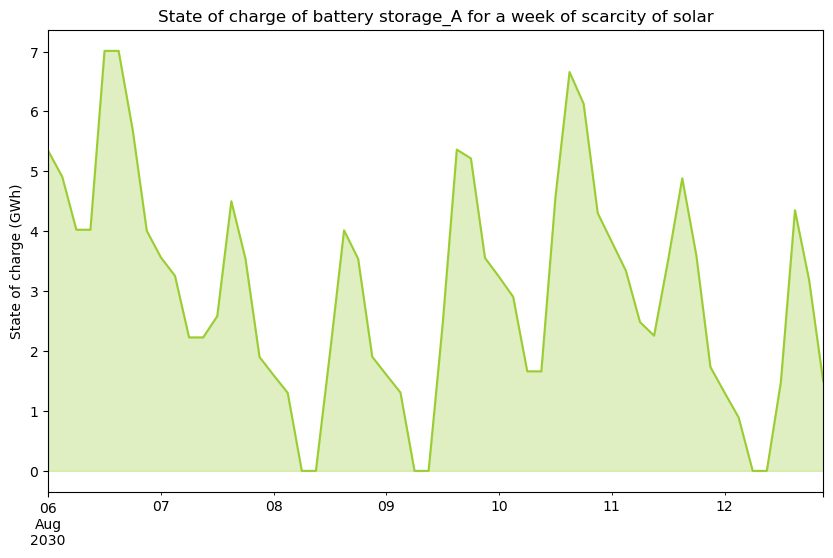

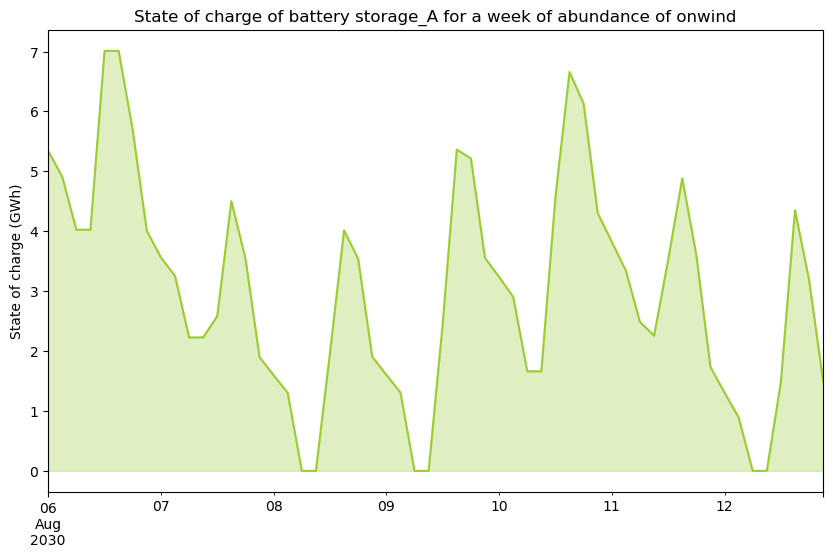

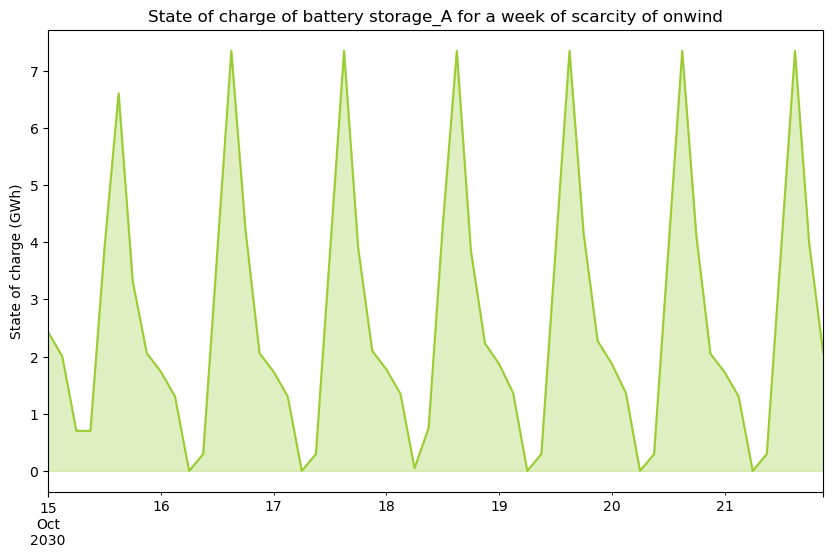

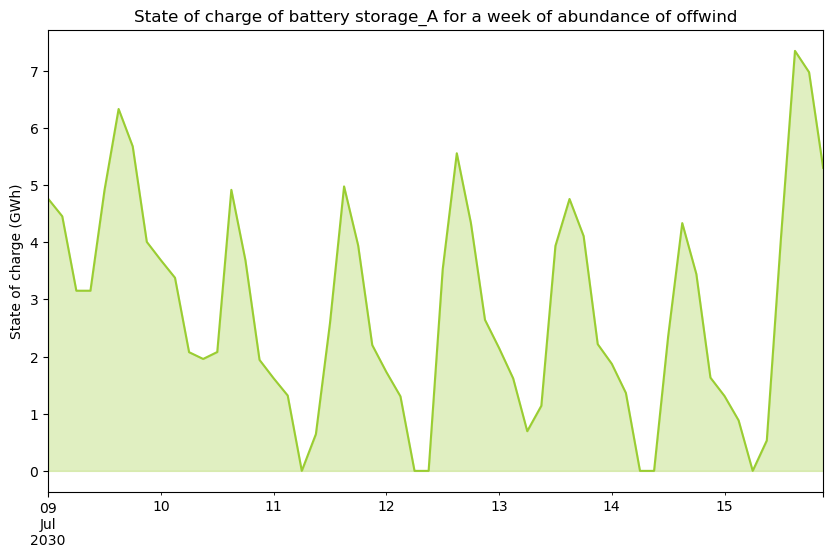

...

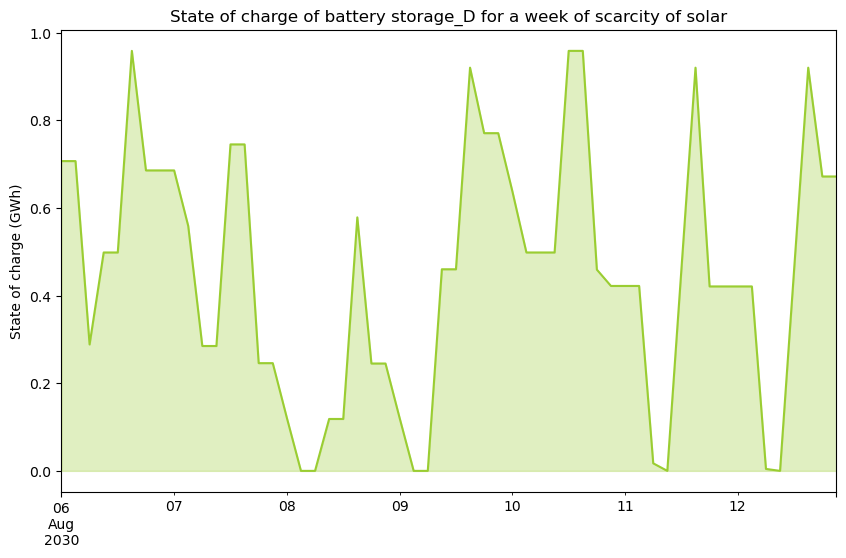

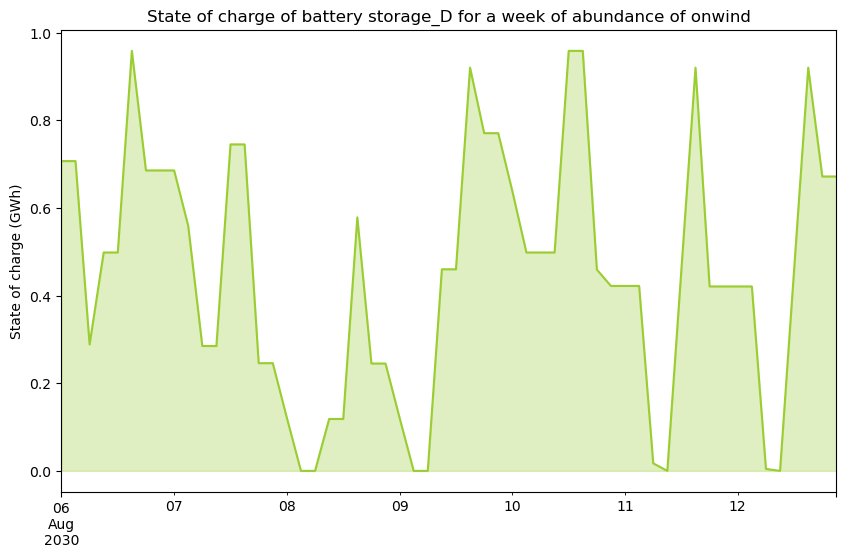

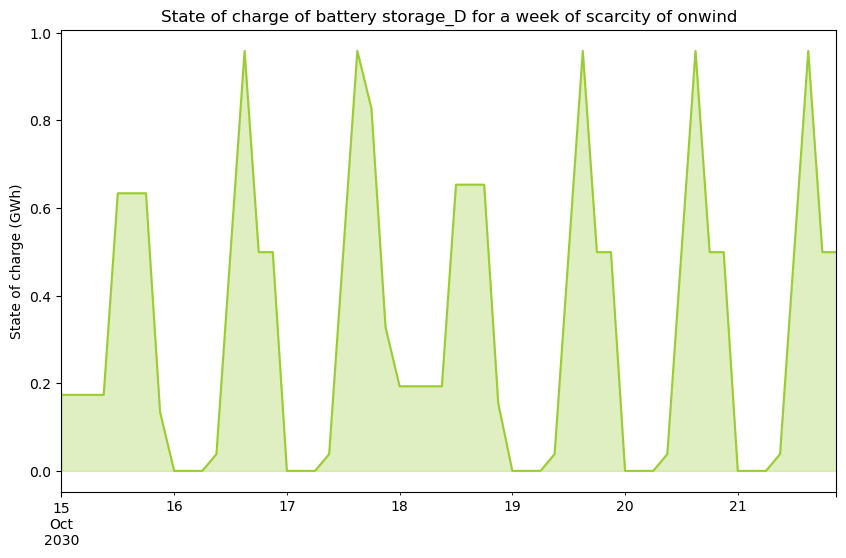

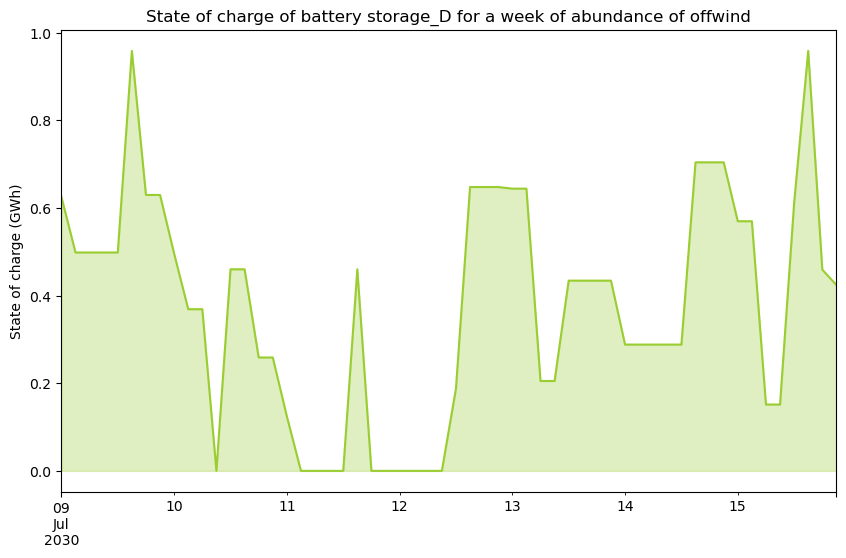

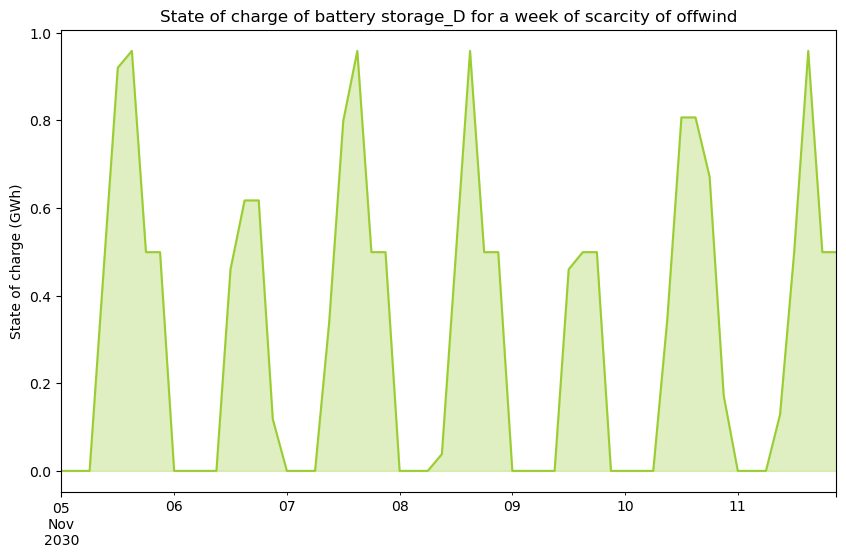

In [85]:
plot_storage()

### With CO2 limitation (100%)

- Add an a **limitation** on **CO2 emissions**

In [86]:
 n.add(
    "GlobalConstraint",
    "emission_limit",
    carrier_attribute="co2_emissions",
    sense="<=",
    constant=0,
)

Index(['emission_limit'], dtype='object')

In [87]:
n.optimize(solver_name="gurobi")

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter WLSAccessID


INFO:gurobipy:Set parameter WLSAccessID


Set parameter WLSSecret


INFO:gurobipy:Set parameter WLSSecret


Set parameter LicenseID to value 2619906


INFO:gurobipy:Set parameter LicenseID to value 2619906


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15.70it/s]
INFO:linopy.io: Writing time: 4.93s


Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-n5jocskc.lp


INFO:gurobipy:Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-n5jocskc.lp


Reading time = 0.88 seconds


INFO:gurobipy:Reading time = 0.88 seconds


obj: 335849 rows, 146026 columns, 735721 nonzeros


INFO:gurobipy:obj: 335849 rows, 146026 columns, 735721 nonzeros


Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


Optimize a model with 335849 rows, 146026 columns and 735721 nonzeros


INFO:gurobipy:Optimize a model with 335849 rows, 146026 columns and 735721 nonzeros


Model fingerprint: 0xa626ae73


INFO:gurobipy:Model fingerprint: 0xa626ae73


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [8e-09, 3e+02]


INFO:gurobipy:  Matrix range     [8e-09, 3e+02]


  Objective range  [3e-02, 5e+05]


INFO:gurobipy:  Objective range  [3e-02, 5e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [6e+01, 1e+100]


INFO:gurobipy:  RHS range        [6e+01, 1e+100]


INFO:gurobipy:Warning: Model contains large rhs


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 163723 rows and 14754 columns


INFO:gurobipy:Presolve removed 163723 rows and 14754 columns


Presolve time: 0.91s


INFO:gurobipy:Presolve time: 0.91s


Presolved: 172126 rows, 131272 columns, 603738 nonzeros


INFO:gurobipy:Presolved: 172126 rows, 131272 columns, 603738 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.19s


INFO:gurobipy:Ordering time: 0.19s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 5.922e+05


INFO:gurobipy: AA' NZ     : 5.922e+05


 Factor NZ  : 2.646e+06 (roughly 140 MB of memory)


INFO:gurobipy: Factor NZ  : 2.646e+06 (roughly 140 MB of memory)


 Factor Ops : 7.348e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 7.348e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.21760457e+12 -3.03256123e+12  3.40e+04 3.36e+03  1.96e+10     2s


INFO:gurobipy:   0   1.21760457e+12 -3.03256123e+12  3.40e+04 3.36e+03  1.96e+10     2s


   1   1.48968769e+12 -3.56362508e+12  2.46e+04 1.74e+06  1.64e+10     2s


INFO:gurobipy:   1   1.48968769e+12 -3.56362508e+12  2.46e+04 1.74e+06  1.64e+10     2s


   2   1.47225245e+12 -6.15070595e+12  2.24e+04 1.13e+06  1.19e+10     2s


INFO:gurobipy:   2   1.47225245e+12 -6.15070595e+12  2.24e+04 1.13e+06  1.19e+10     2s


   3   1.07600747e+12 -1.32278315e+13  1.66e+04 3.35e+05  5.90e+09     2s


INFO:gurobipy:   3   1.07600747e+12 -1.32278315e+13  1.66e+04 3.35e+05  5.90e+09     2s


   4   6.02649504e+11 -1.31283516e+13  9.07e+03 9.78e+04  2.24e+09     2s


INFO:gurobipy:   4   6.02649504e+11 -1.31283516e+13  9.07e+03 9.78e+04  2.24e+09     2s


   5   1.11524128e+11 -9.67813929e+12  1.28e+03 1.34e+04  3.49e+08     3s


INFO:gurobipy:   5   1.11524128e+11 -9.67813929e+12  1.28e+03 1.34e+04  3.49e+08     3s


   6   5.41552326e+10 -6.26354271e+12  3.92e+02 4.69e+03  1.22e+08     3s


INFO:gurobipy:   6   5.41552326e+10 -6.26354271e+12  3.92e+02 4.69e+03  1.22e+08     3s


   7   4.07085970e+10 -3.93314777e+12  1.95e+02 2.01e+03  5.54e+07     3s


INFO:gurobipy:   7   4.07085970e+10 -3.93314777e+12  1.95e+02 2.01e+03  5.54e+07     3s


   8   3.36414263e+10 -2.23326284e+12  9.49e+01 8.46e+02  2.41e+07     3s


INFO:gurobipy:   8   3.36414263e+10 -2.23326284e+12  9.49e+01 8.46e+02  2.41e+07     3s


   9   2.85041409e+10 -8.04309352e+11  2.40e+01 2.07e+02  6.24e+06     3s


INFO:gurobipy:   9   2.85041409e+10 -8.04309352e+11  2.40e+01 2.07e+02  6.24e+06     3s


  10   2.60894553e+10 -6.27762755e+10  6.00e-10 5.38e+00  3.69e+05     3s


INFO:gurobipy:  10   2.60894553e+10 -6.27762755e+10  6.00e-10 5.38e+00  3.69e+05     3s


  11   2.26712451e+10 -4.85910832e+10  5.40e-10 4.50e+00  2.89e+05     4s


INFO:gurobipy:  11   2.26712451e+10 -4.85910832e+10  5.40e-10 4.50e+00  2.89e+05     4s


  12   1.70299082e+10 -3.40242475e+10  7.40e-10 3.22e+00  2.01e+05     4s


INFO:gurobipy:  12   1.70299082e+10 -3.40242475e+10  7.40e-10 3.22e+00  2.01e+05     4s


  13   9.74920387e+09 -2.33806585e+10  7.44e-10 2.35e+00  1.28e+05     4s


INFO:gurobipy:  13   9.74920387e+09 -2.33806585e+10  7.44e-10 2.35e+00  1.28e+05     4s


  14   8.02235357e+09 -1.35391340e+10  1.51e-09 1.48e+00  8.17e+04     4s


INFO:gurobipy:  14   8.02235357e+09 -1.35391340e+10  1.51e-09 1.48e+00  8.17e+04     4s


  15   6.36032238e+09 -5.65690727e+09  6.51e-10 7.66e-01  4.46e+04     4s


INFO:gurobipy:  15   6.36032238e+09 -5.65690727e+09  6.51e-10 7.66e-01  4.46e+04     4s


  16   3.32919067e+09 -2.79929300e+09  1.39e-09 4.07e-01  2.25e+04     4s


INFO:gurobipy:  16   3.32919067e+09 -2.79929300e+09  1.39e-09 4.07e-01  2.25e+04     4s


  17   2.06505611e+09 -9.92906999e+08  2.12e-09 2.11e-01  1.12e+04     5s


INFO:gurobipy:  17   2.06505611e+09 -9.92906999e+08  2.12e-09 2.11e-01  1.12e+04     5s


  18   1.49331862e+09 -1.04643713e+08  8.34e-09 1.01e-01  5.80e+03     5s


INFO:gurobipy:  18   1.49331862e+09 -1.04643713e+08  8.34e-09 1.01e-01  5.80e+03     5s


  19   1.18401806e+09  2.65608848e+08  1.99e-08 5.25e-02  3.31e+03     5s


INFO:gurobipy:  19   1.18401806e+09  2.65608848e+08  1.99e-08 5.25e-02  3.31e+03     5s


  20   1.03951692e+09  4.70670121e+08  3.59e-08 2.73e-02  2.03e+03     5s


INFO:gurobipy:  20   1.03951692e+09  4.70670121e+08  3.59e-08 2.73e-02  2.03e+03     5s


  21   9.66385434e+08  5.26670864e+08  6.40e-08 2.08e-02  1.57e+03     5s


INFO:gurobipy:  21   9.66385434e+08  5.26670864e+08  6.40e-08 2.08e-02  1.57e+03     5s


  22   9.07436069e+08  5.77589146e+08  1.64e-07 1.53e-02  1.18e+03     5s


INFO:gurobipy:  22   9.07436069e+08  5.77589146e+08  1.64e-07 1.53e-02  1.18e+03     5s


  23   8.72230198e+08  6.00003629e+08  6.43e-07 1.32e-02  9.74e+02     6s


INFO:gurobipy:  23   8.72230198e+08  6.00003629e+08  6.43e-07 1.32e-02  9.74e+02     6s


  24   8.44065499e+08  6.58417582e+08  3.22e-06 8.08e-03  6.62e+02     6s


INFO:gurobipy:  24   8.44065499e+08  6.58417582e+08  3.22e-06 8.08e-03  6.62e+02     6s


  25   8.09628330e+08  6.96690822e+08  3.75e-06 4.73e-03  4.03e+02     6s


INFO:gurobipy:  25   8.09628330e+08  6.96690822e+08  3.75e-06 4.73e-03  4.03e+02     6s


  26   7.89742278e+08  7.13962986e+08  2.84e-06 3.29e-03  2.71e+02     7s


INFO:gurobipy:  26   7.89742278e+08  7.13962986e+08  2.84e-06 3.29e-03  2.71e+02     7s


  27   7.76709588e+08  7.24250761e+08  3.99e-06 2.42e-03  1.88e+02     8s


INFO:gurobipy:  27   7.76709588e+08  7.24250761e+08  3.99e-06 2.42e-03  1.88e+02     8s


  28   7.72903177e+08  7.29907008e+08  2.93e-06 1.93e-03  1.54e+02     8s


INFO:gurobipy:  28   7.72903177e+08  7.29907008e+08  2.93e-06 1.93e-03  1.54e+02     8s


  29   7.69770031e+08  7.32390166e+08  3.33e-06 1.72e-03  1.34e+02     8s


INFO:gurobipy:  29   7.69770031e+08  7.32390166e+08  3.33e-06 1.72e-03  1.34e+02     8s


  30   7.68322918e+08  7.40967441e+08  3.41e-06 9.99e-04  9.71e+01     8s


INFO:gurobipy:  30   7.68322918e+08  7.40967441e+08  3.41e-06 9.99e-04  9.71e+01     8s


  31   7.64943487e+08  7.44090897e+08  2.03e-06 7.34e-04  7.39e+01     9s


INFO:gurobipy:  31   7.64943487e+08  7.44090897e+08  2.03e-06 7.34e-04  7.39e+01     9s


  32   7.63662018e+08  7.46020408e+08  2.19e-06 5.67e-04  6.22e+01     9s


INFO:gurobipy:  32   7.63662018e+08  7.46020408e+08  2.19e-06 5.67e-04  6.22e+01     9s


  33   7.61291032e+08  7.49173328e+08  4.41e-06 3.02e-04  4.24e+01     9s


INFO:gurobipy:  33   7.61291032e+08  7.49173328e+08  4.41e-06 3.02e-04  4.24e+01     9s


  34   7.60391804e+08  7.52196847e+08  1.69e-05 1.17e-04  2.83e+01    10s


INFO:gurobipy:  34   7.60391804e+08  7.52196847e+08  1.69e-05 1.17e-04  2.83e+01    10s


  35   7.55105202e+08  7.53799557e+08  5.39e-05 2.16e-05  4.48e+00    10s


INFO:gurobipy:  35   7.55105202e+08  7.53799557e+08  5.39e-05 2.16e-05  4.48e+00    10s


  36   7.54446868e+08  7.54222108e+08  1.14e-05 1.30e-06  7.66e-01    10s


INFO:gurobipy:  36   7.54446868e+08  7.54222108e+08  1.14e-05 1.30e-06  7.66e-01    10s


  37   7.54377083e+08  7.54268422e+08  5.60e-06 9.69e-07  3.70e-01    10s


INFO:gurobipy:  37   7.54377083e+08  7.54268422e+08  5.60e-06 9.69e-07  3.70e-01    10s


  38   7.54365909e+08  7.54278240e+08  4.70e-06 2.44e-07  2.98e-01    11s


INFO:gurobipy:  38   7.54365909e+08  7.54278240e+08  4.70e-06 2.44e-07  2.98e-01    11s


  39   7.54365015e+08  7.54279432e+08  4.62e-06 5.60e-07  2.91e-01    11s


INFO:gurobipy:  39   7.54365015e+08  7.54279432e+08  4.62e-06 5.60e-07  2.91e-01    11s


  40   7.54360709e+08  7.54280441e+08  4.27e-06 5.06e-07  2.73e-01    12s


INFO:gurobipy:  40   7.54360709e+08  7.54280441e+08  4.27e-06 5.06e-07  2.73e-01    12s


  41   7.54356409e+08  7.54282256e+08  3.93e-06 2.11e-07  2.52e-01    12s


INFO:gurobipy:  41   7.54356409e+08  7.54282256e+08  3.93e-06 2.11e-07  2.52e-01    12s


  42   7.54352872e+08  7.54285877e+08  3.66e-06 1.68e-07  2.28e-01    12s


INFO:gurobipy:  42   7.54352872e+08  7.54285877e+08  3.66e-06 1.68e-07  2.28e-01    12s


  43   7.54343812e+08  7.54287078e+08  2.93e-06 8.59e-07  1.93e-01    12s


INFO:gurobipy:  43   7.54343812e+08  7.54287078e+08  2.93e-06 8.59e-07  1.93e-01    12s


  44   7.54342662e+08  7.54288094e+08  2.84e-06 1.42e-06  1.86e-01    13s


INFO:gurobipy:  44   7.54342662e+08  7.54288094e+08  2.84e-06 1.42e-06  1.86e-01    13s


  45   7.54341245e+08  7.54288526e+08  2.73e-06 1.38e-06  1.79e-01    13s


INFO:gurobipy:  45   7.54341245e+08  7.54288526e+08  2.73e-06 1.38e-06  1.79e-01    13s


  46   7.54332890e+08  7.54293061e+08  2.15e-06 8.95e-07  1.36e-01    14s


INFO:gurobipy:  46   7.54332890e+08  7.54293061e+08  2.15e-06 8.95e-07  1.36e-01    14s


  47   7.54329497e+08  7.54294683e+08  1.92e-06 1.07e-06  1.18e-01    15s


INFO:gurobipy:  47   7.54329497e+08  7.54294683e+08  1.92e-06 1.07e-06  1.18e-01    15s


  48   7.54325793e+08  7.54297607e+08  1.64e-06 9.94e-07  9.59e-02    15s


INFO:gurobipy:  48   7.54325793e+08  7.54297607e+08  1.64e-06 9.94e-07  9.59e-02    15s


  49   7.54323064e+08  7.54298765e+08  1.42e-06 7.65e-07  8.27e-02    16s


INFO:gurobipy:  49   7.54323064e+08  7.54298765e+08  1.42e-06 7.65e-07  8.27e-02    16s


  50   7.54314884e+08  7.54299140e+08  7.58e-07 7.21e-07  5.36e-02    17s


INFO:gurobipy:  50   7.54314884e+08  7.54299140e+08  7.58e-07 7.21e-07  5.36e-02    17s


  51   7.54312825e+08  7.54300705e+08  5.95e-07 1.35e-06  4.13e-02    17s


INFO:gurobipy:  51   7.54312825e+08  7.54300705e+08  5.95e-07 1.35e-06  4.13e-02    17s


  52   7.54312145e+08  7.54301921e+08  5.43e-07 1.03e-06  3.48e-02    18s


INFO:gurobipy:  52   7.54312145e+08  7.54301921e+08  5.43e-07 1.03e-06  3.48e-02    18s


  53   7.54311557e+08  7.54302122e+08  4.99e-07 9.74e-07  3.21e-02    19s


INFO:gurobipy:  53   7.54311557e+08  7.54302122e+08  4.99e-07 9.74e-07  3.21e-02    19s


  54   7.54310537e+08  7.54302976e+08  4.21e-07 1.24e-06  2.57e-02    19s


INFO:gurobipy:  54   7.54310537e+08  7.54302976e+08  4.21e-07 1.24e-06  2.57e-02    19s


  55   7.54310256e+08  7.54303281e+08  3.96e-07 9.53e-07  2.37e-02    19s


INFO:gurobipy:  55   7.54310256e+08  7.54303281e+08  3.96e-07 9.53e-07  2.37e-02    19s


  56   7.54309253e+08  7.54303836e+08  3.24e-07 7.10e-07  1.84e-02    20s


INFO:gurobipy:  56   7.54309253e+08  7.54303836e+08  3.24e-07 7.10e-07  1.84e-02    20s


  57   7.54308587e+08  7.54304021e+08  2.67e-07 6.60e-07  1.55e-02    20s


INFO:gurobipy:  57   7.54308587e+08  7.54304021e+08  2.67e-07 6.60e-07  1.55e-02    20s


  58   7.54307707e+08  7.54304182e+08  2.01e-07 6.52e-07  1.20e-02    21s


INFO:gurobipy:  58   7.54307707e+08  7.54304182e+08  2.01e-07 6.52e-07  1.20e-02    21s


  59   7.54307436e+08  7.54304442e+08  1.77e-07 4.31e-07  1.02e-02    21s


INFO:gurobipy:  59   7.54307436e+08  7.54304442e+08  1.77e-07 4.31e-07  1.02e-02    21s


  60   7.54307274e+08  7.54304540e+08  1.64e-07 3.98e-07  9.30e-03    22s


INFO:gurobipy:  60   7.54307274e+08  7.54304540e+08  1.64e-07 3.98e-07  9.30e-03    22s


  61   7.54306781e+08  7.54304719e+08  1.23e-07 2.39e-07  7.01e-03    22s


INFO:gurobipy:  61   7.54306781e+08  7.54304719e+08  1.23e-07 2.39e-07  7.01e-03    22s


  62   7.54306651e+08  7.54304752e+08  1.12e-07 2.39e-07  6.46e-03    23s


INFO:gurobipy:  62   7.54306651e+08  7.54304752e+08  1.12e-07 2.39e-07  6.46e-03    23s


  63   7.54306292e+08  7.54305014e+08  8.17e-08 1.93e-07  4.35e-03    23s


INFO:gurobipy:  63   7.54306292e+08  7.54305014e+08  8.17e-08 1.93e-07  4.35e-03    23s


  64   7.54306129e+08  7.54305084e+08  6.90e-08 6.63e-08  3.55e-03    24s


INFO:gurobipy:  64   7.54306129e+08  7.54305084e+08  6.90e-08 6.63e-08  3.55e-03    24s


  65   7.54305966e+08  7.54305127e+08  5.60e-08 1.12e-07  2.85e-03    24s


INFO:gurobipy:  65   7.54305966e+08  7.54305127e+08  5.60e-08 1.12e-07  2.85e-03    24s


  66   7.54305820e+08  7.54305173e+08  4.37e-08 2.71e-08  2.20e-03    25s


INFO:gurobipy:  66   7.54305820e+08  7.54305173e+08  4.37e-08 2.71e-08  2.20e-03    25s


  67   7.54305772e+08  7.54305243e+08  3.96e-08 8.33e-08  1.80e-03    25s


INFO:gurobipy:  67   7.54305772e+08  7.54305243e+08  3.96e-08 8.33e-08  1.80e-03    25s


  68   7.54305652e+08  7.54305270e+08  2.96e-08 2.46e-08  1.30e-03    25s


INFO:gurobipy:  68   7.54305652e+08  7.54305270e+08  2.96e-08 2.46e-08  1.30e-03    25s


  69   7.54305568e+08  7.54305300e+08  2.20e-08 9.89e-08  9.10e-04    26s


INFO:gurobipy:  69   7.54305568e+08  7.54305300e+08  2.20e-08 9.89e-08  9.10e-04    26s


  70   7.54305512e+08  7.54305303e+08  1.68e-08 4.15e-08  7.09e-04    26s


INFO:gurobipy:  70   7.54305512e+08  7.54305303e+08  1.68e-08 4.15e-08  7.09e-04    26s


  71   7.54305488e+08  7.54305312e+08  1.45e-08 4.49e-08  5.98e-04    27s


INFO:gurobipy:  71   7.54305488e+08  7.54305312e+08  1.45e-08 4.49e-08  5.98e-04    27s


  72   7.54305442e+08  7.54305328e+08  1.01e-08 3.66e-08  3.88e-04    27s


INFO:gurobipy:  72   7.54305442e+08  7.54305328e+08  1.01e-08 3.66e-08  3.88e-04    27s


  73   7.54305404e+08  7.54305333e+08  6.25e-09 2.65e-08  2.43e-04    28s


INFO:gurobipy:  73   7.54305404e+08  7.54305333e+08  6.25e-09 2.65e-08  2.43e-04    28s


  74   7.54305388e+08  7.54305338e+08  4.58e-09 3.01e-08  1.71e-04    28s


INFO:gurobipy:  74   7.54305388e+08  7.54305338e+08  4.58e-09 3.01e-08  1.71e-04    28s


  75   7.54305384e+08  7.54305340e+08  4.09e-09 3.93e-08  1.47e-04    28s


INFO:gurobipy:  75   7.54305384e+08  7.54305340e+08  4.09e-09 3.93e-08  1.47e-04    28s


  76   7.54305363e+08  7.54305342e+08  1.75e-09 1.05e-08  7.10e-05    29s


INFO:gurobipy:  76   7.54305363e+08  7.54305342e+08  1.75e-09 1.05e-08  7.10e-05    29s


  77   7.54305351e+08  7.54305343e+08  6.23e-10 5.99e-08  2.77e-05    29s


INFO:gurobipy:  77   7.54305351e+08  7.54305343e+08  6.23e-10 5.99e-08  2.77e-05    29s


  78   7.54305351e+08  7.54305345e+08  5.70e-10 2.14e-08  2.09e-05    29s


INFO:gurobipy:  78   7.54305351e+08  7.54305345e+08  5.70e-10 2.14e-08  2.09e-05    29s


INFO:gurobipy:


Barrier solved model in 78 iterations and 29.00 seconds (7.90 work units)


INFO:gurobipy:Barrier solved model in 78 iterations and 29.00 seconds (7.90 work units)


Optimal objective 7.54305351e+08


INFO:gurobipy:Optimal objective 7.54305351e+08


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   17067 DPushes remaining with DInf 0.0000000e+00                29s


INFO:gurobipy:   17067 DPushes remaining with DInf 0.0000000e+00                29s


       0 DPushes remaining with DInf 0.0000000e+00                30s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                30s


INFO:gurobipy:


   75020 PPushes remaining with PInf 1.9174805e-06                30s


INFO:gurobipy:   75020 PPushes remaining with PInf 1.9174805e-06                30s


   35569 PPushes remaining with PInf 0.0000000e+00                34s


INFO:gurobipy:   35569 PPushes remaining with PInf 0.0000000e+00                34s


   16719 PPushes remaining with PInf 0.0000000e+00                35s


INFO:gurobipy:   16719 PPushes remaining with PInf 0.0000000e+00                35s


   11537 PPushes remaining with PInf 0.0000000e+00                40s


INFO:gurobipy:   11537 PPushes remaining with PInf 0.0000000e+00                40s


    2901 PPushes remaining with PInf 0.0000000e+00                46s


INFO:gurobipy:    2901 PPushes remaining with PInf 0.0000000e+00                46s


       0 PPushes remaining with PInf 0.0000000e+00                46s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                46s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.5076588e+02     46s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.5076588e+02     46s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   79694    7.5430535e+08   0.000000e+00   1.507659e+02     46s


INFO:gurobipy:   79694    7.5430535e+08   0.000000e+00   1.507659e+02     46s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


   80055    7.5430535e+08   0.000000e+00   0.000000e+00     48s


INFO:gurobipy:   80055    7.5430535e+08   0.000000e+00   0.000000e+00     48s


INFO:gurobipy:


Solved in 80055 iterations and 48.45 seconds (20.23 work units)


INFO:gurobipy:Solved in 80055 iterations and 48.45 seconds (20.23 work units)


Optimal objective  7.543053452e+08


INFO:gurobipy:Optimal objective  7.543053452e+08


INFO:gurobipy:Warning: environment still referenced so free is deferred (Continue to use WLS)
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 146026 primals, 335849 duals
Objective: 7.54e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper, StorageUnit-ext-p_dispatch-lower, StorageUnit-ext-p_dispatch-upper, StorageUnit-ext-p_store-lower, StorageUnit-ext-p_store-upper, StorageUnit-ext-state_of_charge-lower, StorageUnit-ext-state_of_charge-upper, StorageUnit-energy_balance were not assigned to the network.


('ok', 'optimal')

- Total system cost per technology per year

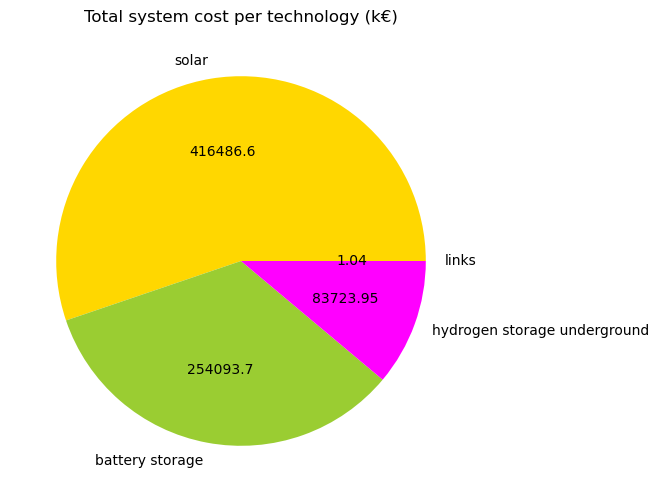

In [88]:
plot_total_costs()

- Capacities built per technologies

In [89]:
capacities_opt = plot_capacities()

- Electricity mix per generator

In [90]:
generator_mix = plot_generators_dispatch()

- Electricity mix per technology

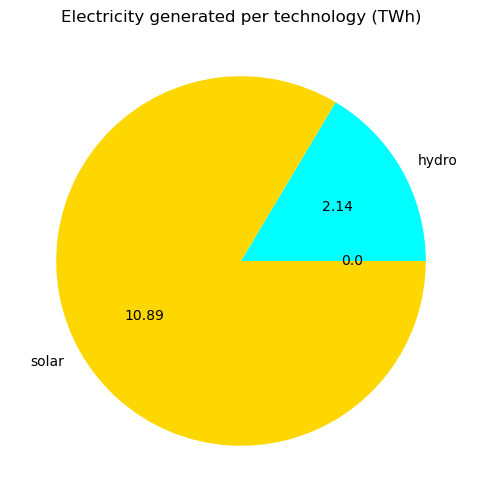

In [91]:
tech_mix = plot_technologies_dispatch()

- Price duration curves

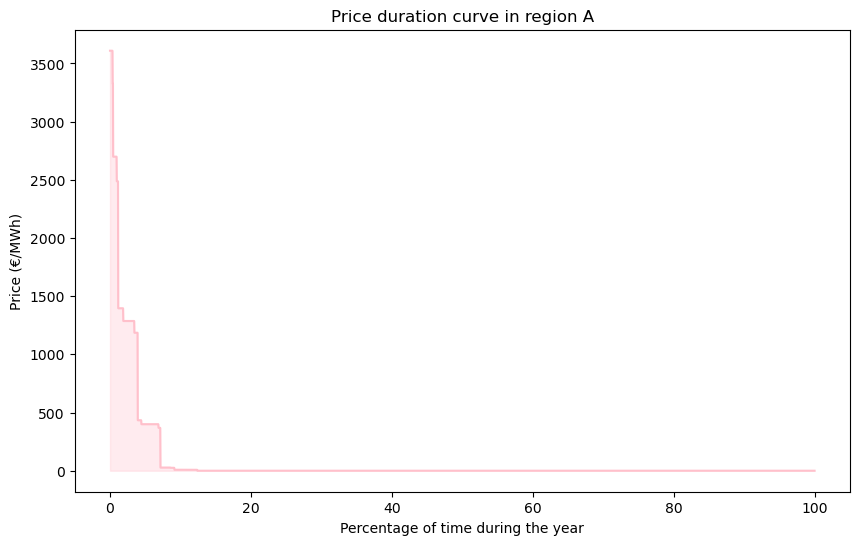

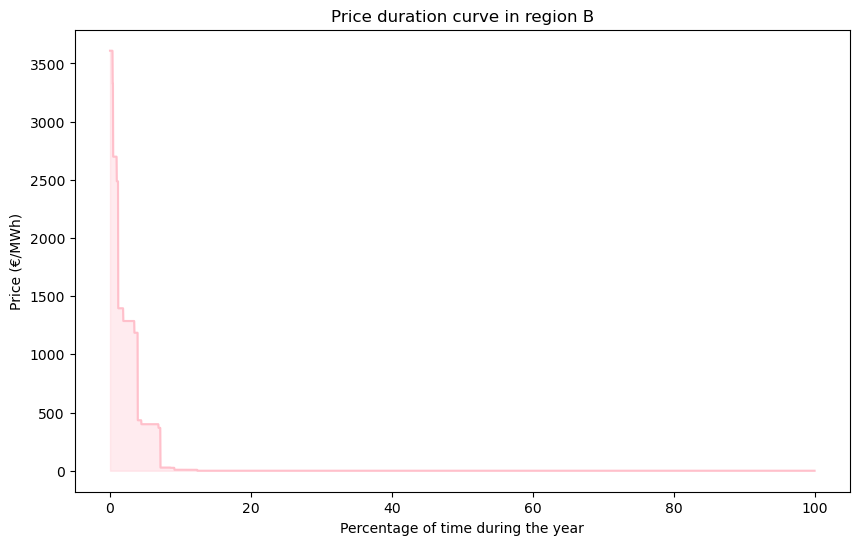

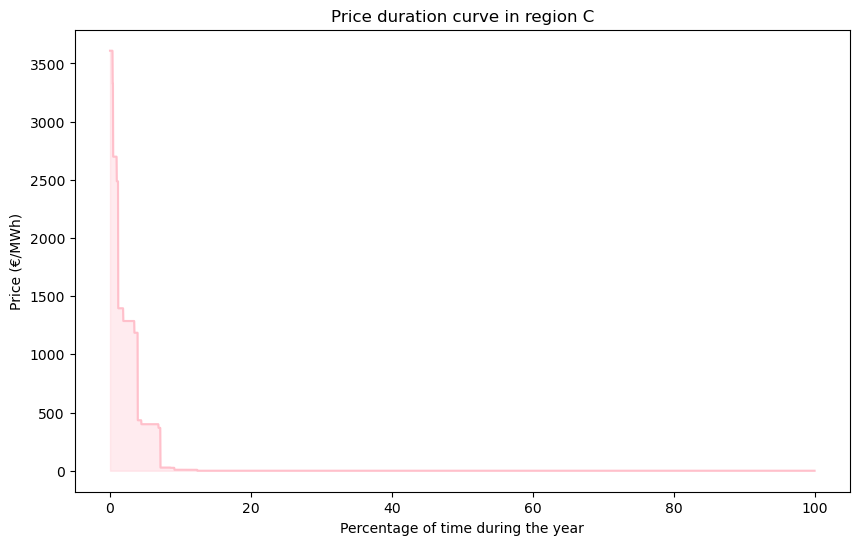

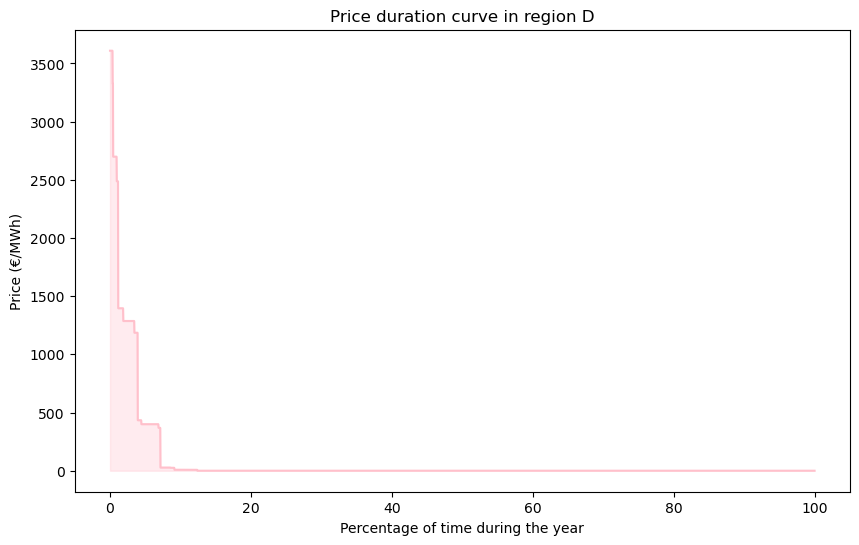

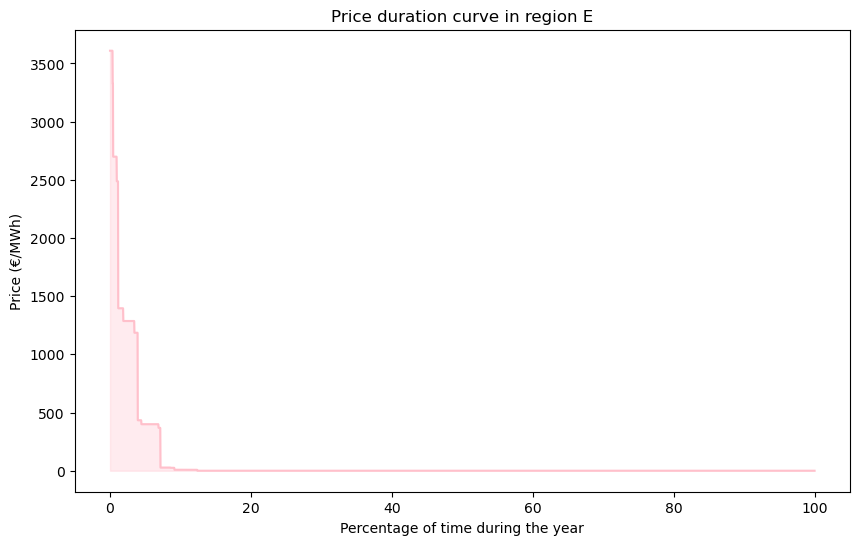

In [92]:
plot_price_curves()

- Average electricity prices per region

In [93]:
n.buses_t.marginal_price.mean() # €/MWh

Bus
A    84.633717
B    84.633862
C    84.633842
D    84.633820
E    84.633875
dtype: float64

- Rate of curtailment

In [94]:
curtailments()

carrier
OCGT     1.0
solar    0.2
dtype: float64


- Storage filling levels

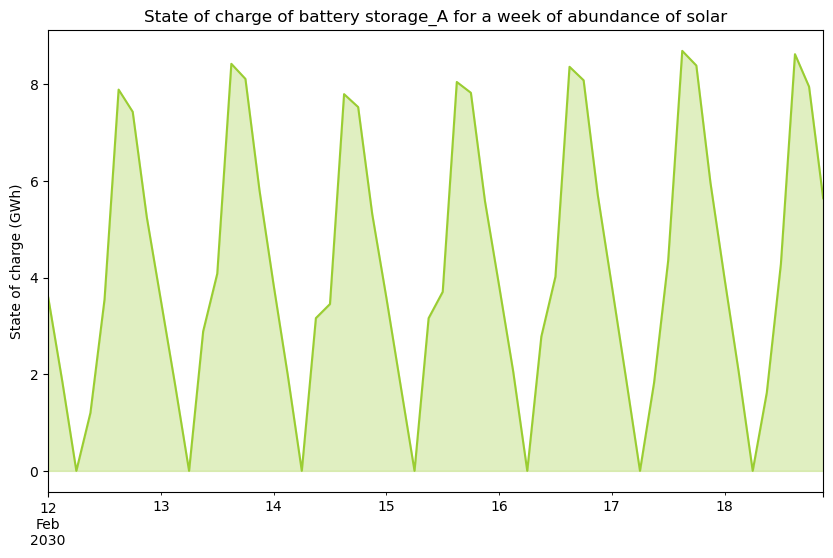

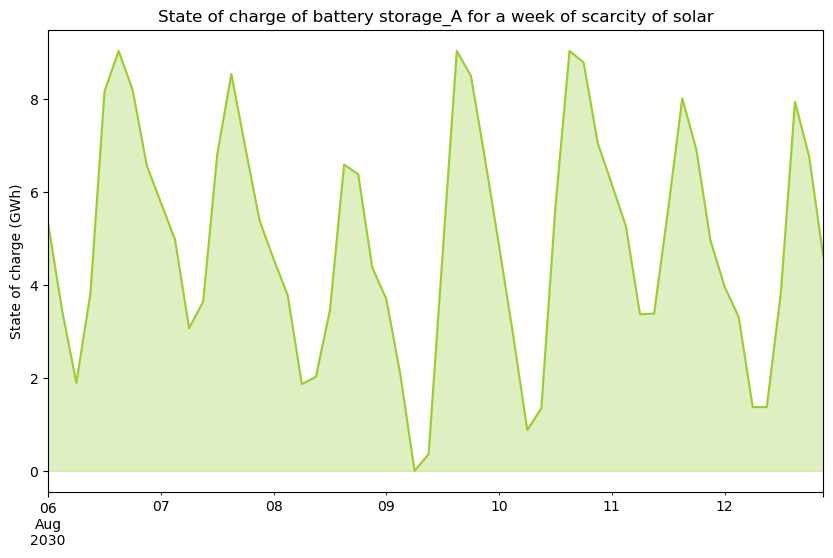

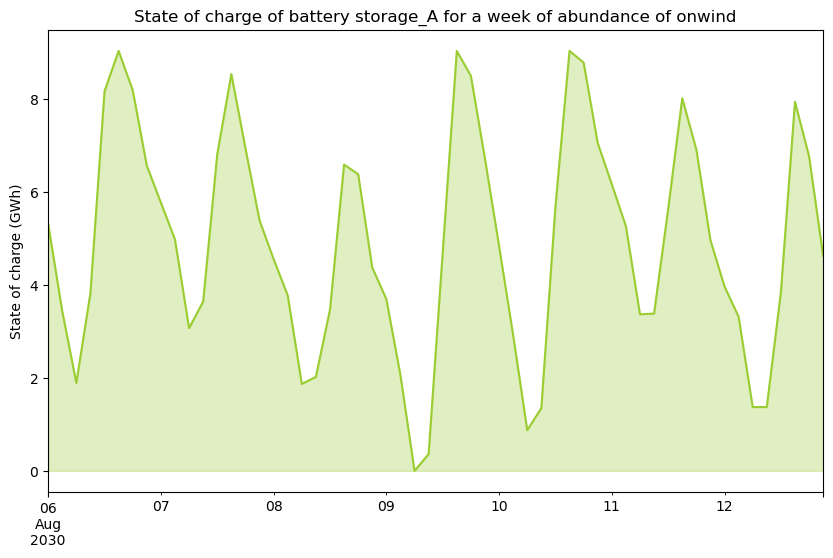

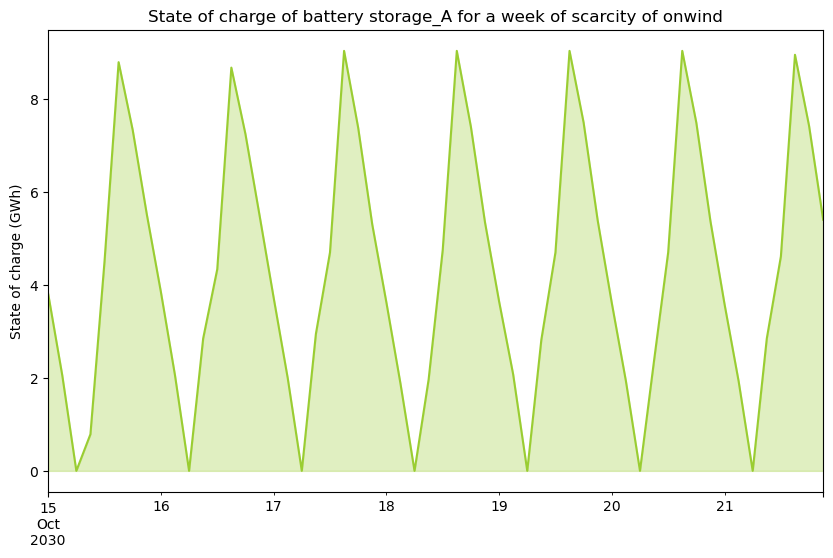

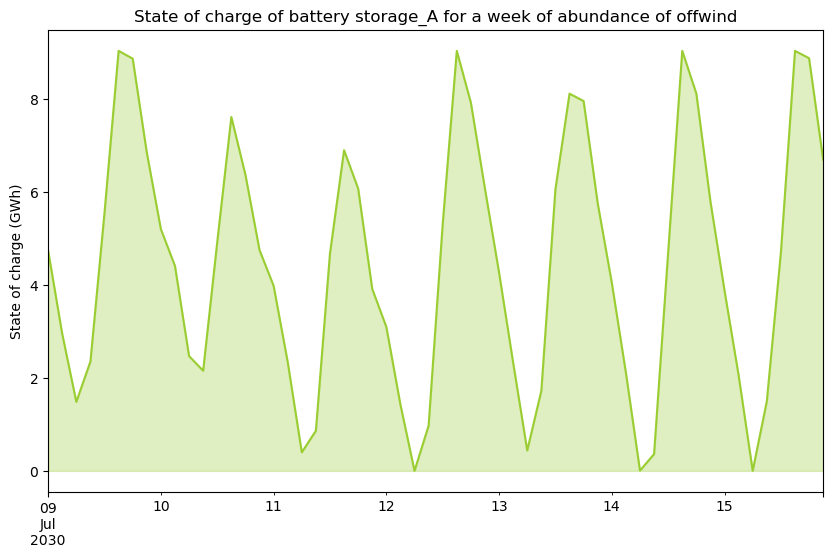

...

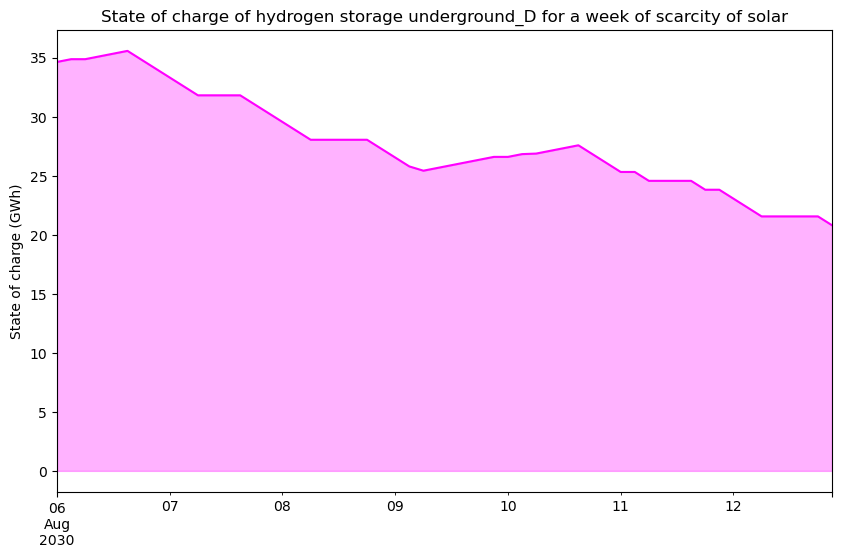

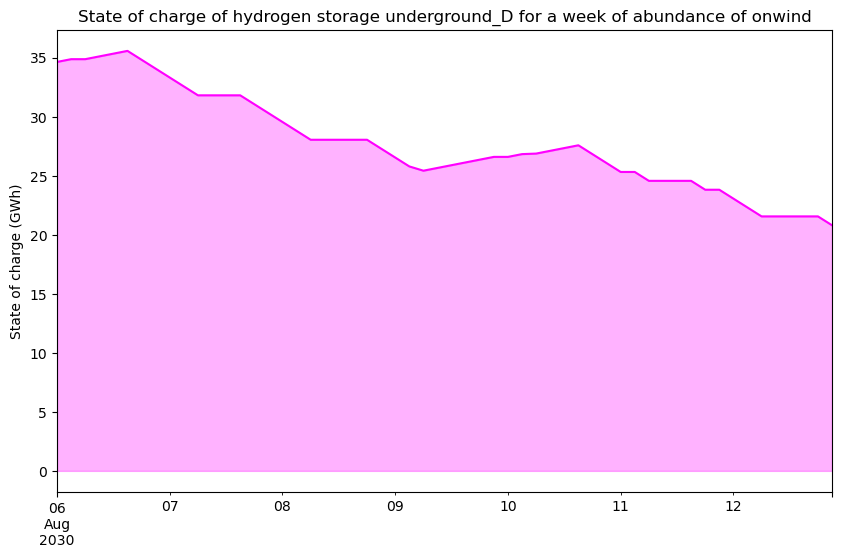

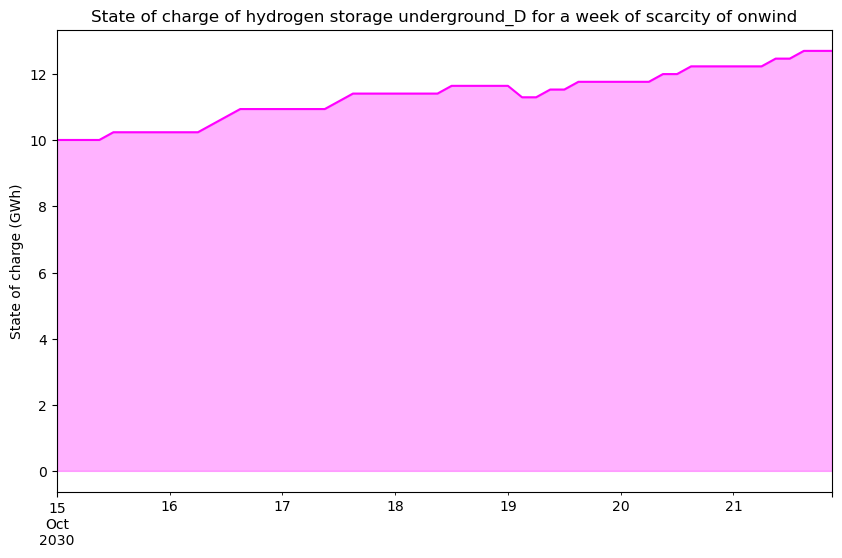

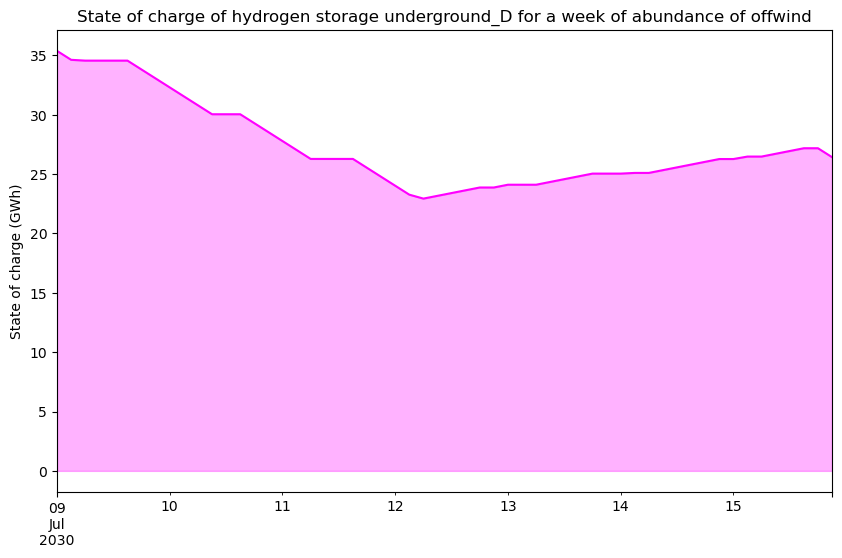

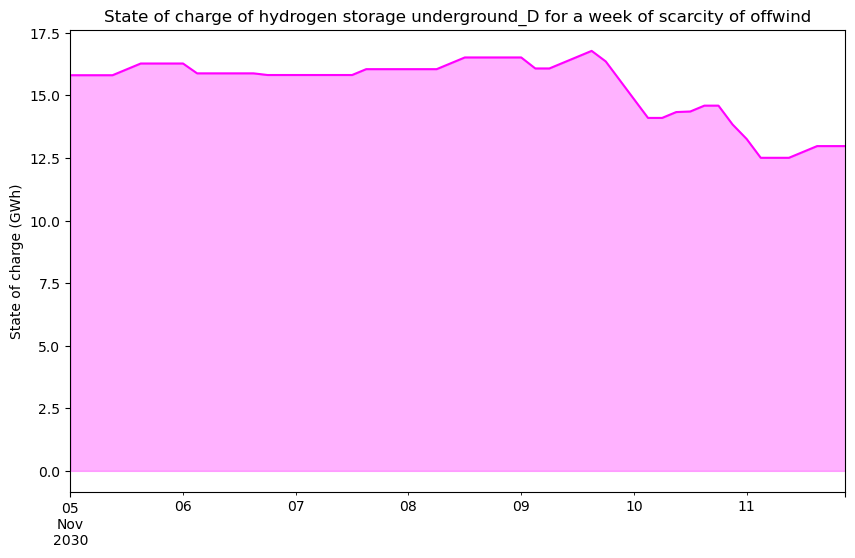

In [95]:
plot_storage()

## Sensivity Analysis: Variations of solar potentials

### 75%

- **Reduce solar maximum capacity**

In [96]:
n.generators.loc[n.generators['carrier'] == "solar", 'p_nom_max'] = 0.75 * p_nom_max_solar

- **Optimize** the model

In [97]:
n.optimize(solver_name="gurobi")

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter WLSAccessID


INFO:gurobipy:Set parameter WLSAccessID


Set parameter WLSSecret


INFO:gurobipy:Set parameter WLSSecret


Set parameter LicenseID to value 2619906


INFO:gurobipy:Set parameter LicenseID to value 2619906


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 15.33it/s]
INFO:linopy.io: Writing time: 3.68s


Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-svb4u9sl.lp


INFO:gurobipy:Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-svb4u9sl.lp


Reading time = 0.81 seconds


INFO:gurobipy:Reading time = 0.81 seconds


obj: 335849 rows, 146026 columns, 735721 nonzeros


INFO:gurobipy:obj: 335849 rows, 146026 columns, 735721 nonzeros


Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


Optimize a model with 335849 rows, 146026 columns and 735721 nonzeros


INFO:gurobipy:Optimize a model with 335849 rows, 146026 columns and 735721 nonzeros


Model fingerprint: 0x2333b610


INFO:gurobipy:Model fingerprint: 0x2333b610


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [8e-09, 3e+02]


INFO:gurobipy:  Matrix range     [8e-09, 3e+02]


  Objective range  [3e-02, 5e+05]


INFO:gurobipy:  Objective range  [3e-02, 5e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [6e+01, 1e+100]


INFO:gurobipy:  RHS range        [6e+01, 1e+100]


INFO:gurobipy:Warning: Model contains large rhs


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 163723 rows and 14754 columns


INFO:gurobipy:Presolve removed 163723 rows and 14754 columns


Presolve time: 0.87s


INFO:gurobipy:Presolve time: 0.87s


Presolved: 172126 rows, 131272 columns, 603738 nonzeros


INFO:gurobipy:Presolved: 172126 rows, 131272 columns, 603738 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.14s


INFO:gurobipy:Ordering time: 0.14s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 5.922e+05


INFO:gurobipy: AA' NZ     : 5.922e+05


 Factor NZ  : 2.646e+06 (roughly 140 MB of memory)


INFO:gurobipy: Factor NZ  : 2.646e+06 (roughly 140 MB of memory)


 Factor Ops : 7.348e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 7.348e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.21806687e+12 -2.93877173e+12  3.40e+04 3.36e+03  1.97e+10     1s


INFO:gurobipy:   0   1.21806687e+12 -2.93877173e+12  3.40e+04 3.36e+03  1.97e+10     1s


   1   1.49022455e+12 -3.47722715e+12  2.47e+04 1.74e+06  1.64e+10     2s


INFO:gurobipy:   1   1.49022455e+12 -3.47722715e+12  2.47e+04 1.74e+06  1.64e+10     2s


   2   1.46987113e+12 -7.19314812e+12  2.22e+04 1.12e+06  1.19e+10     2s


INFO:gurobipy:   2   1.46987113e+12 -7.19314812e+12  2.22e+04 1.12e+06  1.19e+10     2s


   3   9.91918970e+11 -1.41041475e+13  1.75e+04 3.27e+05  5.89e+09     2s


INFO:gurobipy:   3   9.91918970e+11 -1.41041475e+13  1.75e+04 3.27e+05  5.89e+09     2s


   4   3.86914969e+11 -1.41790305e+13  6.57e+03 1.42e+05  2.71e+09     2s


INFO:gurobipy:   4   3.86914969e+11 -1.41790305e+13  6.57e+03 1.42e+05  2.71e+09     2s


   5   1.19289650e+11 -1.11324108e+13  1.57e+03 2.25e+04  5.25e+08     2s


INFO:gurobipy:   5   1.19289650e+11 -1.11324108e+13  1.57e+03 2.25e+04  5.25e+08     2s


   6   6.46816636e+10 -7.41783106e+12  6.04e+02 8.63e+03  2.09e+08     2s


INFO:gurobipy:   6   6.46816636e+10 -7.41783106e+12  6.04e+02 8.63e+03  2.09e+08     2s


   7   4.88715091e+10 -4.94484414e+12  3.41e+02 3.73e+03  9.94e+07     3s


INFO:gurobipy:   7   4.88715091e+10 -4.94484414e+12  3.41e+02 3.73e+03  9.94e+07     3s


   8   3.88806312e+10 -3.36579673e+12  1.84e+02 1.81e+03  4.98e+07     3s


INFO:gurobipy:   8   3.88806312e+10 -3.36579673e+12  1.84e+02 1.81e+03  4.98e+07     3s


   9   3.33282994e+10 -2.32722124e+12  1.03e+02 9.72e+02  2.66e+07     3s


INFO:gurobipy:   9   3.33282994e+10 -2.32722124e+12  1.03e+02 9.72e+02  2.66e+07     3s


  10   2.82698773e+10 -1.07954174e+12  3.08e+01 3.17e+02  9.01e+06     3s


INFO:gurobipy:  10   2.82698773e+10 -1.07954174e+12  3.08e+01 3.17e+02  9.01e+06     3s


  11   2.60943740e+10 -1.58359997e+11  3.56e-02 2.74e+01  9.88e+05     3s


INFO:gurobipy:  11   2.60943740e+10 -1.58359997e+11  3.56e-02 2.74e+01  9.88e+05     3s


  12   2.19898623e+10 -2.83690318e+10  7.81e-03 5.94e+00  2.38e+05     3s


INFO:gurobipy:  12   2.19898623e+10 -2.83690318e+10  7.81e-03 5.94e+00  2.38e+05     3s


  13   1.37214894e+10 -1.05990060e+10  5.41e-04 2.24e+00  1.00e+05     4s


INFO:gurobipy:  13   1.37214894e+10 -1.05990060e+10  5.41e-04 2.24e+00  1.00e+05     4s


  14   1.22258236e+10 -1.02040581e+10  4.24e-04 2.14e+00  9.16e+04     4s


INFO:gurobipy:  14   1.22258236e+10 -1.02040581e+10  4.24e-04 2.14e+00  9.16e+04     4s


  15   7.94489238e+09 -8.39545145e+09  1.80e-04 1.85e+00  6.56e+04     4s


INFO:gurobipy:  15   7.94489238e+09 -8.39545145e+09  1.80e-04 1.85e+00  6.56e+04     4s


  16   5.11893156e+09 -5.91744666e+09  8.34e-05 1.38e+00  4.35e+04     4s


INFO:gurobipy:  16   5.11893156e+09 -5.91744666e+09  8.34e-05 1.38e+00  4.35e+04     4s


  17   3.53754584e+09 -2.73621268e+09  4.59e-05 7.26e-01  2.42e+04     4s


INFO:gurobipy:  17   3.53754584e+09 -2.73621268e+09  4.59e-05 7.26e-01  2.42e+04     4s


  18   1.80182800e+09 -1.44370388e+08  1.51e-05 1.27e-01  7.06e+03     4s


INFO:gurobipy:  18   1.80182800e+09 -1.44370388e+08  1.51e-05 1.27e-01  7.06e+03     4s


  19   1.10754785e+09  4.39608299e+08  5.55e-06 2.72e-02  2.36e+03     5s


INFO:gurobipy:  19   1.10754785e+09  4.39608299e+08  5.55e-06 2.72e-02  2.36e+03     5s


  20   8.97992755e+08  5.82331615e+08  2.85e-06 1.03e-02  1.11e+03     5s


INFO:gurobipy:  20   8.97992755e+08  5.82331615e+08  2.85e-06 1.03e-02  1.11e+03     5s


  21   8.62618625e+08  6.34186027e+08  2.38e-06 6.05e-03  7.96e+02     5s


INFO:gurobipy:  21   8.62618625e+08  6.34186027e+08  2.38e-06 6.05e-03  7.96e+02     5s


  22   8.31043207e+08  6.74547333e+08  2.63e-06 3.90e-03  5.45e+02     5s


INFO:gurobipy:  22   8.31043207e+08  6.74547333e+08  2.63e-06 3.90e-03  5.45e+02     5s


  23   8.17329975e+08  6.96172881e+08  3.08e-06 2.85e-03  4.21e+02     5s


INFO:gurobipy:  23   8.17329975e+08  6.96172881e+08  3.08e-06 2.85e-03  4.21e+02     5s


  24   8.01103468e+08  7.21568706e+08  3.41e-06 1.63e-03  2.76e+02     5s


INFO:gurobipy:  24   8.01103468e+08  7.21568706e+08  3.41e-06 1.63e-03  2.76e+02     5s


  25   7.84608009e+08  7.35428818e+08  8.43e-06 1.02e-03  1.71e+02     6s


INFO:gurobipy:  25   7.84608009e+08  7.35428818e+08  8.43e-06 1.02e-03  1.71e+02     6s


  26   7.78163634e+08  7.46362302e+08  1.01e-05 5.24e-04  1.10e+02     6s


INFO:gurobipy:  26   7.78163634e+08  7.46362302e+08  1.01e-05 5.24e-04  1.10e+02     6s


  27   7.72449993e+08  7.49598624e+08  7.45e-06 3.84e-04  7.91e+01     6s


INFO:gurobipy:  27   7.72449993e+08  7.49598624e+08  7.45e-06 3.84e-04  7.91e+01     6s


  28   7.71518046e+08  7.50581999e+08  7.26e-06 3.43e-04  7.24e+01     6s


INFO:gurobipy:  28   7.71518046e+08  7.50581999e+08  7.26e-06 3.43e-04  7.24e+01     6s


  29   7.68951316e+08  7.51601778e+08  1.63e-05 3.04e-04  6.01e+01     7s


INFO:gurobipy:  29   7.68951316e+08  7.51601778e+08  1.63e-05 3.04e-04  6.01e+01     7s


  30   7.67344653e+08  7.56336096e+08  2.62e-05 1.32e-04  3.79e+01     7s


INFO:gurobipy:  30   7.67344653e+08  7.56336096e+08  2.62e-05 1.32e-04  3.79e+01     7s


  31   7.63686456e+08  7.59895092e+08  6.75e-05 3.41e-05  1.30e+01     7s


INFO:gurobipy:  31   7.63686456e+08  7.59895092e+08  6.75e-05 3.41e-05  1.30e+01     7s


  32   7.62338039e+08  7.61211793e+08  7.09e-05 3.56e-06  3.84e+00     7s


INFO:gurobipy:  32   7.62338039e+08  7.61211793e+08  7.09e-05 3.56e-06  3.84e+00     7s


  33   7.61713605e+08  7.61472648e+08  1.56e-05 1.99e-08  8.19e-01     7s


INFO:gurobipy:  33   7.61713605e+08  7.61472648e+08  1.56e-05 1.99e-08  8.19e-01     7s


  34   7.61640322e+08  7.61528848e+08  8.70e-06 4.68e-07  3.79e-01     7s


INFO:gurobipy:  34   7.61640322e+08  7.61528848e+08  8.70e-06 4.68e-07  3.79e-01     7s


  35   7.61638294e+08  7.61535242e+08  8.49e-06 1.03e-06  3.50e-01     8s


INFO:gurobipy:  35   7.61638294e+08  7.61535242e+08  8.49e-06 1.03e-06  3.50e-01     8s


  36   7.61635274e+08  7.61536135e+08  8.16e-06 1.10e-06  3.37e-01     8s


INFO:gurobipy:  36   7.61635274e+08  7.61536135e+08  8.16e-06 1.10e-06  3.37e-01     8s


  37   7.61632637e+08  7.61537070e+08  7.89e-06 1.07e-06  3.25e-01     8s


INFO:gurobipy:  37   7.61632637e+08  7.61537070e+08  7.89e-06 1.07e-06  3.25e-01     8s


  38   7.61617309e+08  7.61538837e+08  6.26e-06 1.11e-06  2.67e-01     8s


INFO:gurobipy:  38   7.61617309e+08  7.61538837e+08  6.26e-06 1.11e-06  2.67e-01     8s


  39   7.61609605e+08  7.61541626e+08  5.46e-06 8.97e-07  2.31e-01     8s


INFO:gurobipy:  39   7.61609605e+08  7.61541626e+08  5.46e-06 8.97e-07  2.31e-01     8s


  40   7.61604477e+08  7.61543291e+08  4.95e-06 8.68e-07  2.08e-01     9s


INFO:gurobipy:  40   7.61604477e+08  7.61543291e+08  4.95e-06 8.68e-07  2.08e-01     9s


  41   7.61597776e+08  7.61545312e+08  4.34e-06 7.65e-07  1.78e-01     9s


INFO:gurobipy:  41   7.61597776e+08  7.61545312e+08  4.34e-06 7.65e-07  1.78e-01     9s


  42   7.61584914e+08  7.61546352e+08  3.12e-06 6.09e-07  1.31e-01    10s


INFO:gurobipy:  42   7.61584914e+08  7.61546352e+08  3.12e-06 6.09e-07  1.31e-01    10s


  43   7.61579525e+08  7.61549158e+08  2.61e-06 3.86e-07  1.03e-01    10s


INFO:gurobipy:  43   7.61579525e+08  7.61549158e+08  2.61e-06 3.86e-07  1.03e-01    10s


  44   7.61572707e+08  7.61550335e+08  1.91e-06 4.34e-07  7.60e-02    10s


INFO:gurobipy:  44   7.61572707e+08  7.61550335e+08  1.91e-06 4.34e-07  7.60e-02    10s


  45   7.61568614e+08  7.61551948e+08  1.49e-06 4.27e-07  5.66e-02    11s


INFO:gurobipy:  45   7.61568614e+08  7.61551948e+08  1.49e-06 4.27e-07  5.66e-02    11s


  46   7.61566064e+08  7.61552233e+08  1.23e-06 4.62e-07  4.70e-02    11s


INFO:gurobipy:  46   7.61566064e+08  7.61552233e+08  1.23e-06 4.62e-07  4.70e-02    11s


  47   7.61563438e+08  7.61553207e+08  9.54e-07 2.94e-07  3.48e-02    11s


INFO:gurobipy:  47   7.61563438e+08  7.61553207e+08  9.54e-07 2.94e-07  3.48e-02    11s


  48   7.61560900e+08  7.61553468e+08  7.06e-07 2.69e-07  2.52e-02    12s


INFO:gurobipy:  48   7.61560900e+08  7.61553468e+08  7.06e-07 2.69e-07  2.52e-02    12s


  49   7.61560116e+08  7.61553990e+08  6.12e-07 1.53e-07  2.08e-02    12s


INFO:gurobipy:  49   7.61560116e+08  7.61553990e+08  6.12e-07 1.53e-07  2.08e-02    12s


  50   7.61558996e+08  7.61554285e+08  4.92e-07 1.27e-07  1.60e-02    13s


INFO:gurobipy:  50   7.61558996e+08  7.61554285e+08  4.92e-07 1.27e-07  1.60e-02    13s


  51   7.61557367e+08  7.61554390e+08  2.94e-07 2.51e-07  1.01e-02    13s


INFO:gurobipy:  51   7.61557367e+08  7.61554390e+08  2.94e-07 2.51e-07  1.01e-02    13s


  52   7.61556826e+08  7.61554625e+08  2.25e-07 5.33e-08  7.48e-03    13s


INFO:gurobipy:  52   7.61556826e+08  7.61554625e+08  2.25e-07 5.33e-08  7.48e-03    13s


  53   7.61556690e+08  7.61554729e+08  2.06e-07 3.20e-08  6.66e-03    14s


INFO:gurobipy:  53   7.61556690e+08  7.61554729e+08  2.06e-07 3.20e-08  6.66e-03    14s


  54   7.61556153e+08  7.61554828e+08  1.39e-07 6.87e-08  4.50e-03    14s


INFO:gurobipy:  54   7.61556153e+08  7.61554828e+08  1.39e-07 6.87e-08  4.50e-03    14s


  55   7.61555904e+08  7.61554888e+08  1.05e-07 6.82e-08  3.45e-03    15s


INFO:gurobipy:  55   7.61555904e+08  7.61554888e+08  1.05e-07 6.82e-08  3.45e-03    15s


  56   7.61555780e+08  7.61554970e+08  8.76e-08 3.03e-08  2.75e-03    15s


INFO:gurobipy:  56   7.61555780e+08  7.61554970e+08  8.76e-08 3.03e-08  2.75e-03    15s


  57   7.61555704e+08  7.61555012e+08  7.70e-08 3.53e-08  2.35e-03    16s


INFO:gurobipy:  57   7.61555704e+08  7.61555012e+08  7.70e-08 3.53e-08  2.35e-03    16s


  58   7.61555544e+08  7.61555062e+08  5.36e-08 1.11e-08  1.64e-03    16s


INFO:gurobipy:  58   7.61555544e+08  7.61555062e+08  5.36e-08 1.11e-08  1.64e-03    16s


  59   7.61555499e+08  7.61555093e+08  4.72e-08 2.51e-08  1.38e-03    17s


INFO:gurobipy:  59   7.61555499e+08  7.61555093e+08  4.72e-08 2.51e-08  1.38e-03    17s


  60   7.61555397e+08  7.61555097e+08  3.36e-08 6.66e-08  1.02e-03    17s


INFO:gurobipy:  60   7.61555397e+08  7.61555097e+08  3.36e-08 6.66e-08  1.02e-03    17s


  61   7.61555377e+08  7.61555140e+08  3.05e-08 3.20e-08  8.04e-04    18s


INFO:gurobipy:  61   7.61555377e+08  7.61555140e+08  3.05e-08 3.20e-08  8.04e-04    18s


  62   7.61555304e+08  7.61555153e+08  1.96e-08 7.35e-08  5.12e-04    18s


INFO:gurobipy:  62   7.61555304e+08  7.61555153e+08  1.96e-08 7.35e-08  5.12e-04    18s


  63   7.61555270e+08  7.61555154e+08  1.44e-08 1.16e-07  3.94e-04    19s


INFO:gurobipy:  63   7.61555270e+08  7.61555154e+08  1.44e-08 1.16e-07  3.94e-04    19s


  64   7.61555231e+08  7.61555162e+08  7.97e-09 8.68e-08  2.35e-04    19s


INFO:gurobipy:  64   7.61555231e+08  7.61555162e+08  7.97e-09 8.68e-08  2.35e-04    19s


  65   7.61555218e+08  7.61555170e+08  5.88e-09 1.80e-08  1.63e-04    20s


INFO:gurobipy:  65   7.61555218e+08  7.61555170e+08  5.88e-09 1.80e-08  1.63e-04    20s


  66   7.61555212e+08  7.61555174e+08  5.01e-09 3.76e-08  1.29e-04    20s


INFO:gurobipy:  66   7.61555212e+08  7.61555174e+08  5.01e-09 3.76e-08  1.29e-04    20s


  67   7.61555203e+08  7.61555177e+08  3.42e-09 3.07e-08  9.01e-05    20s


INFO:gurobipy:  67   7.61555203e+08  7.61555177e+08  3.42e-09 3.07e-08  9.01e-05    20s


  68   7.61555195e+08  7.61555179e+08  1.88e-09 2.52e-08  5.36e-05    21s


INFO:gurobipy:  68   7.61555195e+08  7.61555179e+08  1.88e-09 2.52e-08  5.36e-05    21s


  69   7.61555191e+08  7.61555182e+08  1.24e-09 7.72e-08  2.90e-05    22s


INFO:gurobipy:  69   7.61555191e+08  7.61555182e+08  1.24e-09 7.72e-08  2.90e-05    22s


  70   7.61555185e+08  7.61555183e+08  3.50e-09 1.96e-08  9.46e-06    22s


INFO:gurobipy:  70   7.61555185e+08  7.61555183e+08  3.50e-09 1.96e-08  9.46e-06    22s


  71   7.61555185e+08  7.61555184e+08  2.76e-09 3.97e-08  4.88e-06    22s


INFO:gurobipy:  71   7.61555185e+08  7.61555184e+08  2.76e-09 3.97e-08  4.88e-06    22s


INFO:gurobipy:


Barrier solved model in 71 iterations and 22.33 seconds (8.13 work units)


INFO:gurobipy:Barrier solved model in 71 iterations and 22.33 seconds (8.13 work units)


Optimal objective 7.61555185e+08


INFO:gurobipy:Optimal objective 7.61555185e+08


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   17717 DPushes remaining with DInf 0.0000000e+00                23s


INFO:gurobipy:   17717 DPushes remaining with DInf 0.0000000e+00                23s


       0 DPushes remaining with DInf 0.0000000e+00                23s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                23s


INFO:gurobipy:


   74574 PPushes remaining with PInf 0.0000000e+00                23s


INFO:gurobipy:   74574 PPushes remaining with PInf 0.0000000e+00                23s


   13416 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:   13416 PPushes remaining with PInf 0.0000000e+00                25s


    2589 PPushes remaining with PInf 0.0000000e+00                32s


INFO:gurobipy:    2589 PPushes remaining with PInf 0.0000000e+00                32s


       0 PPushes remaining with PInf 0.0000000e+00                32s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                32s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 4.7576156e+01     32s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 4.7576156e+01     32s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   78749    7.6155518e+08   0.000000e+00   4.757616e+01     33s


INFO:gurobipy:   78749    7.6155518e+08   0.000000e+00   4.757616e+01     33s


   79189    7.6155518e+08   0.000000e+00   3.144761e-03     35s


INFO:gurobipy:   79189    7.6155518e+08   0.000000e+00   3.144761e-03     35s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


   79212    7.6155518e+08   0.000000e+00   0.000000e+00     36s


INFO:gurobipy:   79212    7.6155518e+08   0.000000e+00   0.000000e+00     36s


INFO:gurobipy:


Solved in 79212 iterations and 35.69 seconds (15.31 work units)


INFO:gurobipy:Solved in 79212 iterations and 35.69 seconds (15.31 work units)


Optimal objective  7.615551838e+08


INFO:gurobipy:Optimal objective  7.615551838e+08


INFO:gurobipy:Warning: environment still referenced so free is deferred (Continue to use WLS)
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 146026 primals, 335849 duals
Objective: 7.62e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper, StorageUnit-ext-p_dispatch-lower, StorageUnit-ext-p_dispatch-upper, StorageUnit-ext-p_store-lower, StorageUnit-ext-p_store-upper, StorageUnit-ext-state_of_charge-lower, StorageUnit-ext-state_of_charge-upper, StorageUnit-energy_balance were not assigned to the network.


('ok', 'optimal')

- Total system cost per technology per year

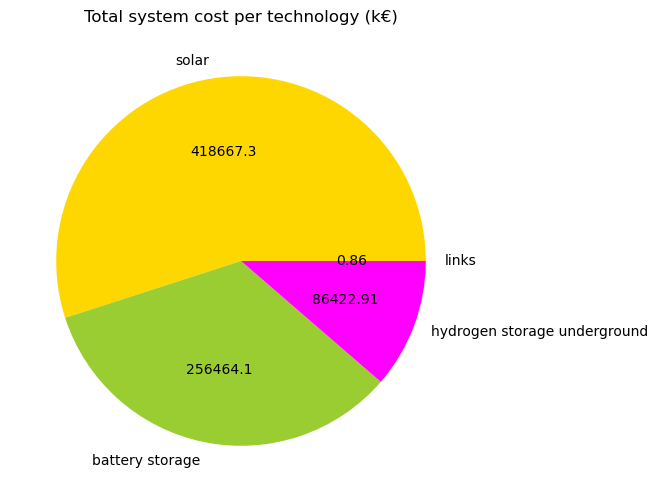

In [98]:
plot_total_costs()

- Capacities built per technologies

In [99]:
capacities_opt = plot_capacities()

- Electricity mix per generator

In [100]:
generator_mix = plot_generators_dispatch()

- Electricity mix per technology

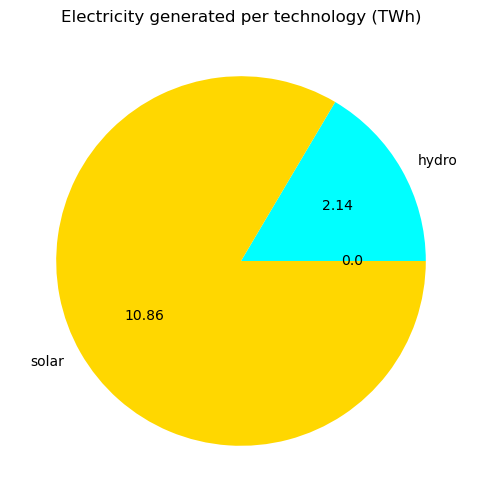

In [101]:
tech_mix = plot_technologies_dispatch()

- Price duration curves

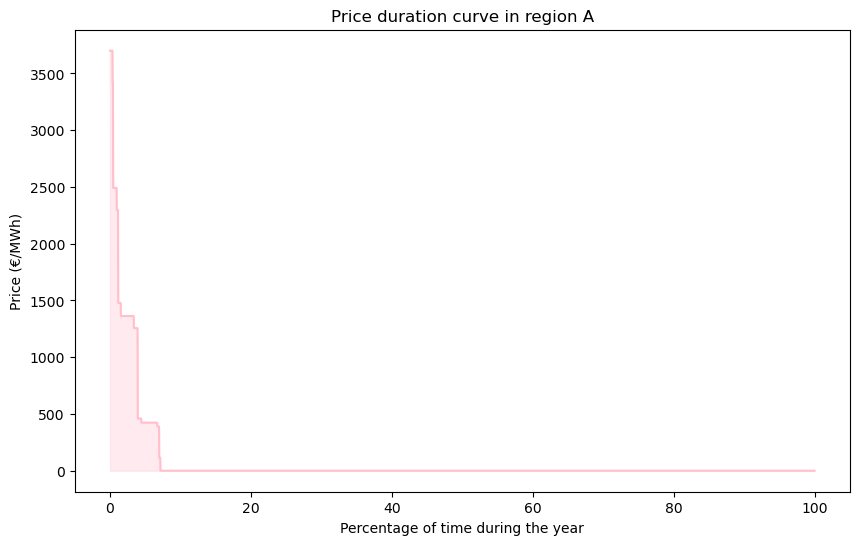

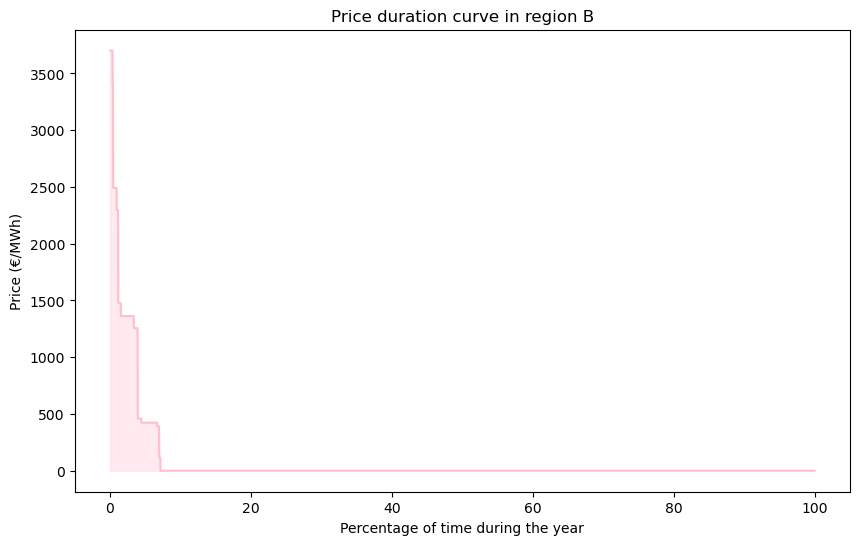

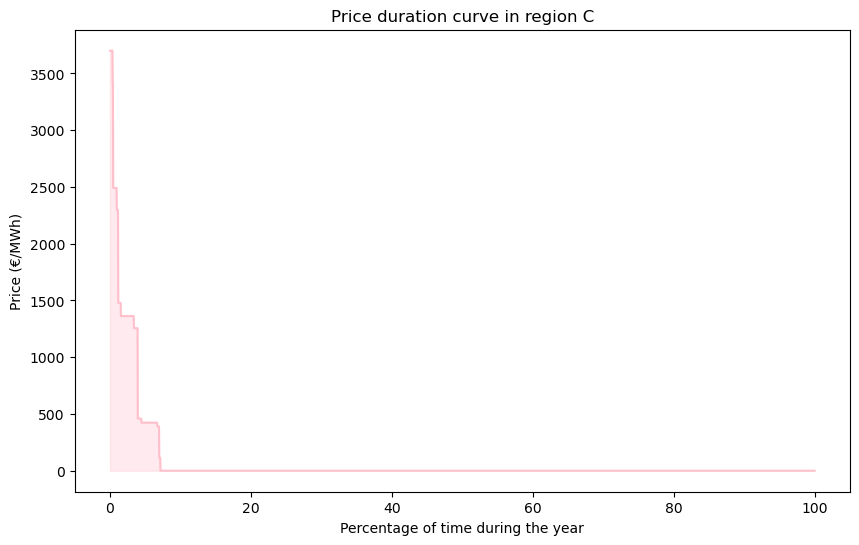

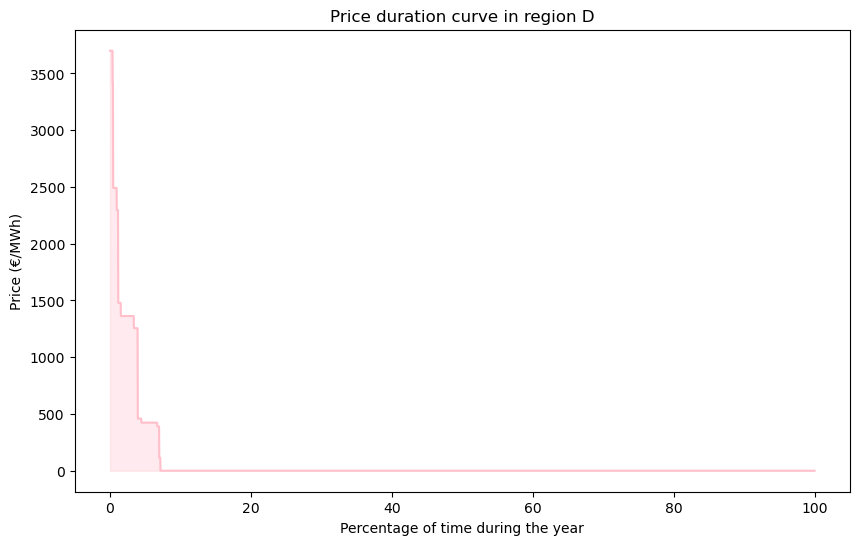

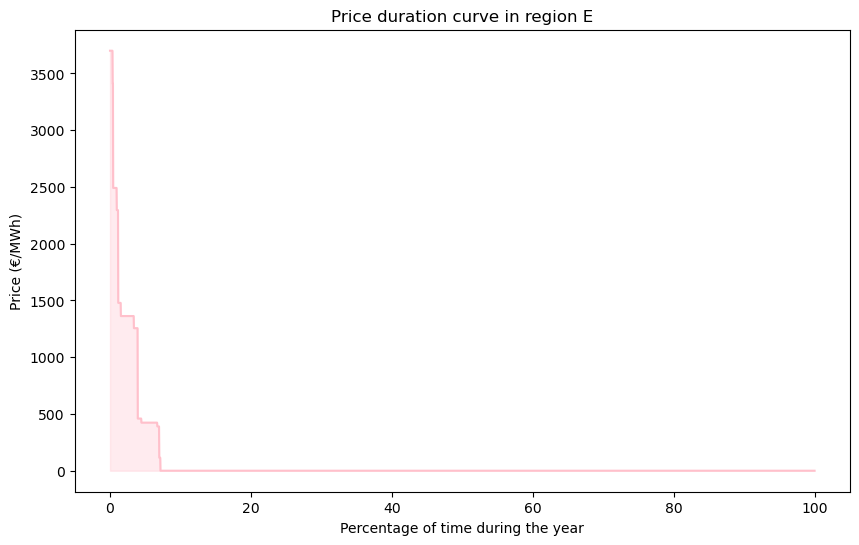

In [102]:
plot_price_curves()

- Average electricity prices per region

In [103]:
n.buses_t.marginal_price.mean() # €/MWh

Bus
A    84.674530
B    84.674675
C    84.674656
D    84.674677
E    84.674646
dtype: float64

- Rate of curtailment

In [104]:
curtailments()

carrier
OCGT     1.00
solar    0.21
dtype: float64


- Storage filling levels

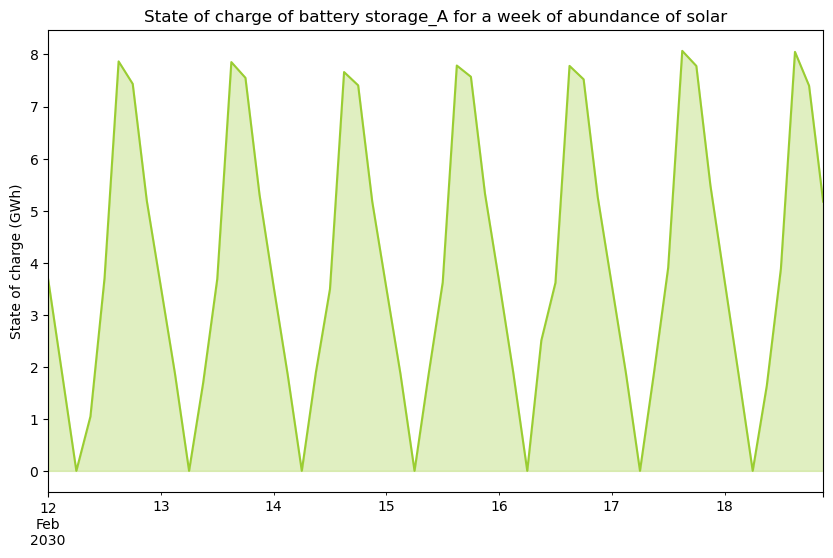

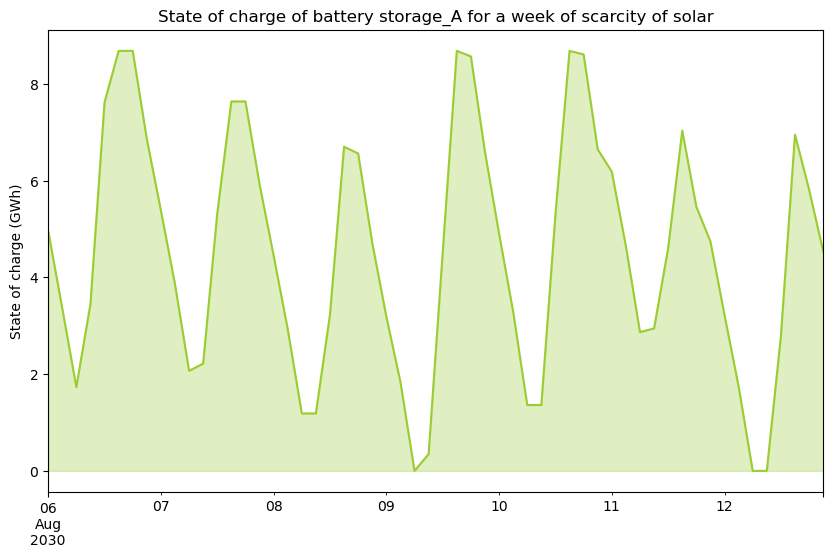

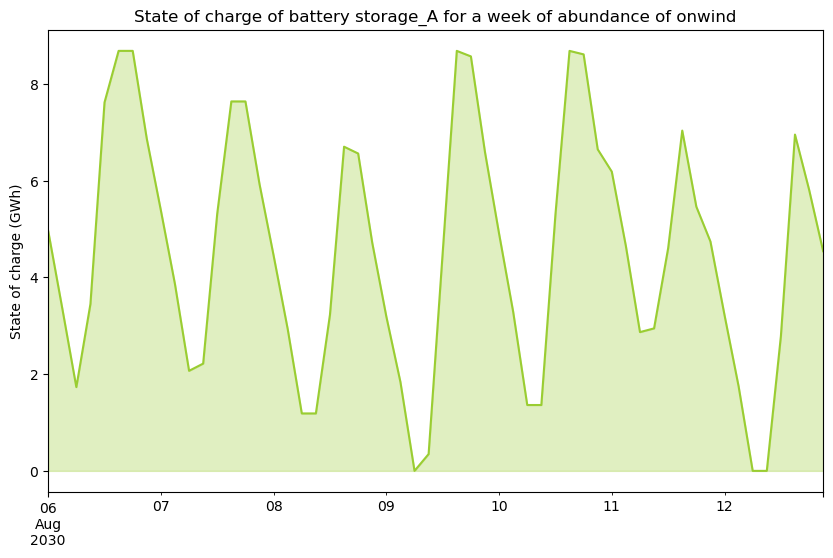

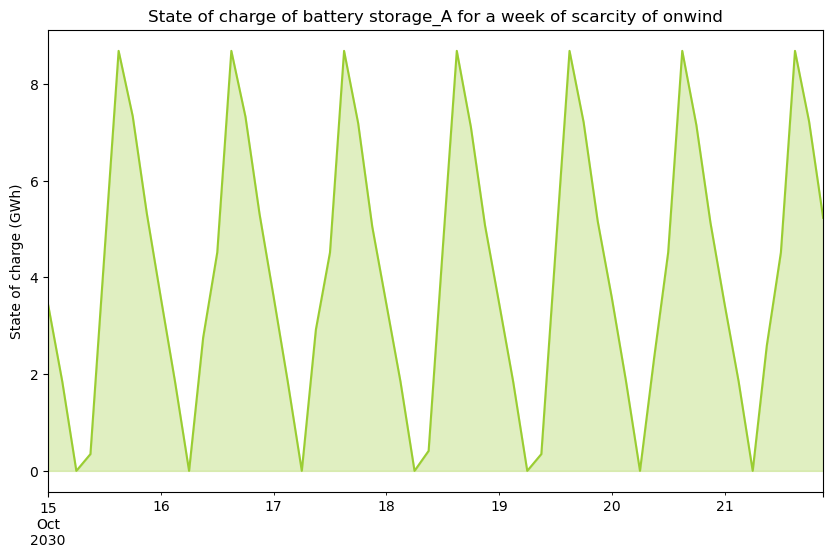

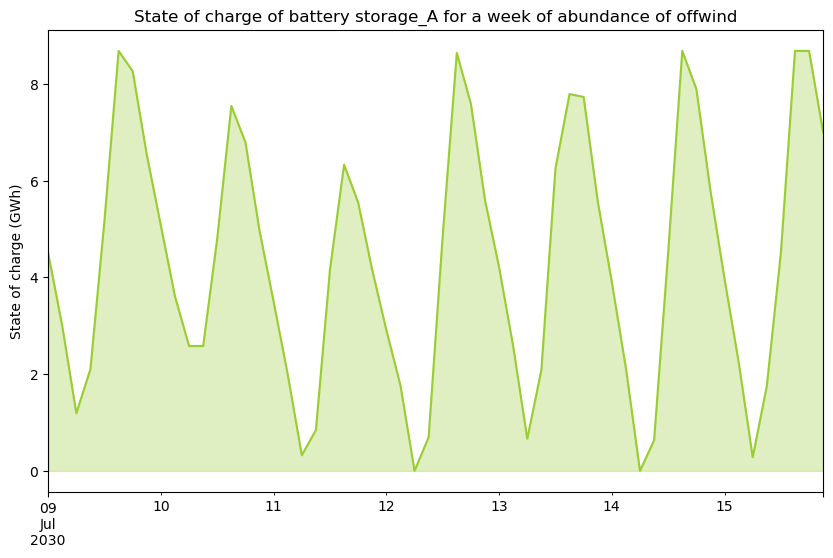

...

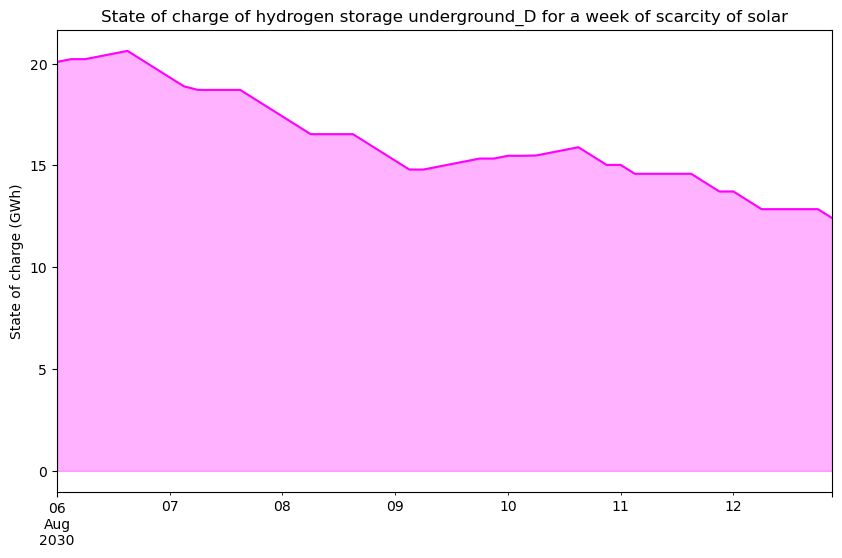

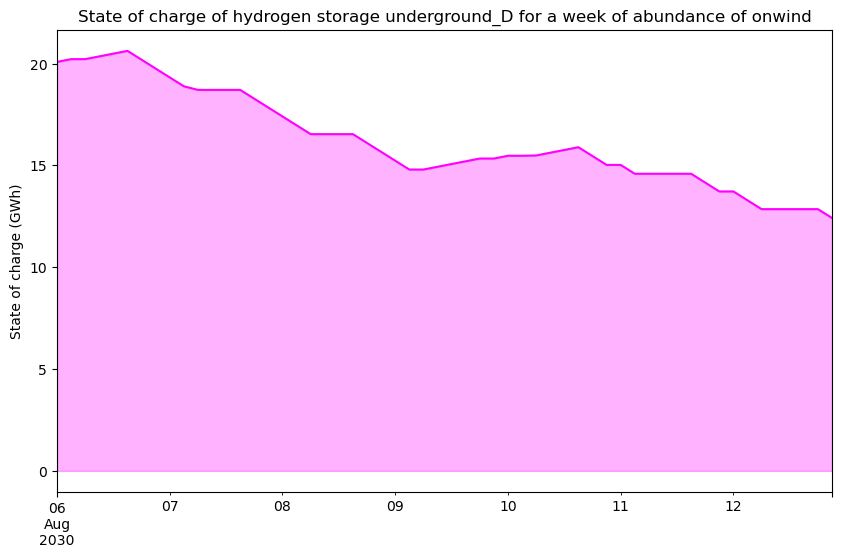

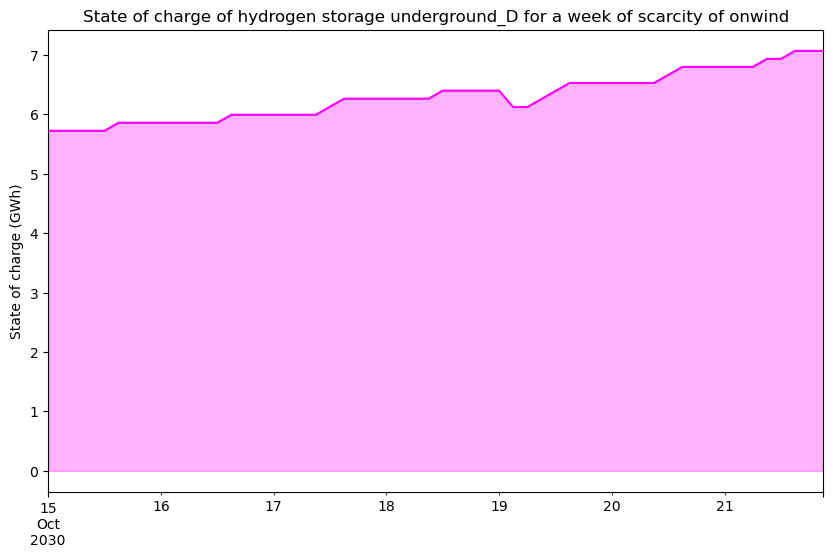

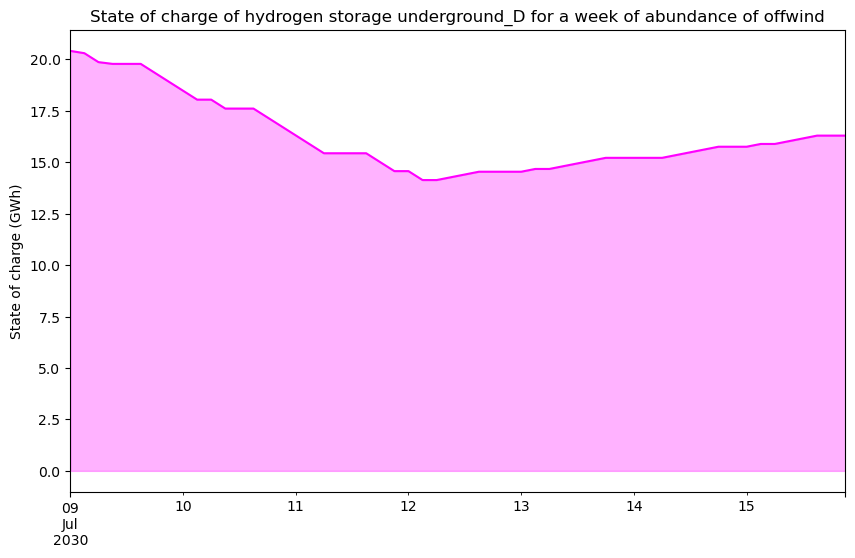

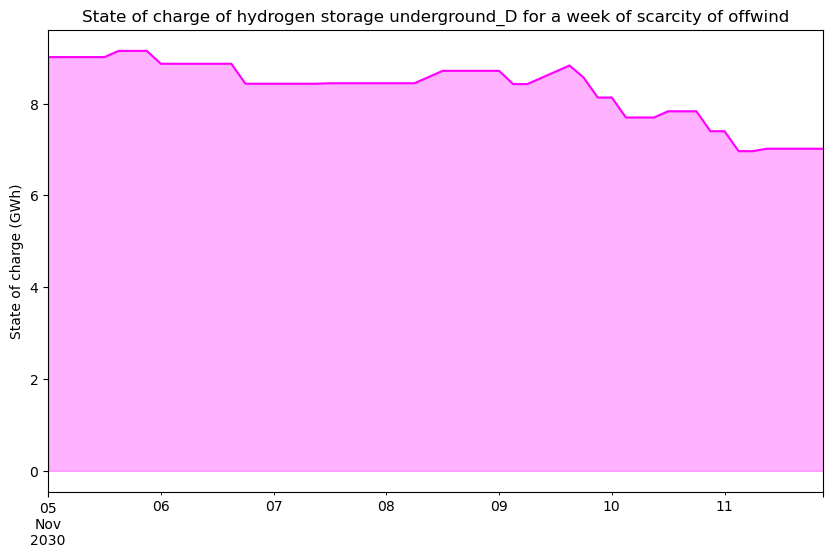

In [105]:
plot_storage()

### 50%

- **Reduce solar maximum capacity**

In [106]:
n.generators.loc[n.generators['carrier'] == "solar", 'p_nom_max'] = 0.5 * p_nom_max_solar

- **Optimize** the model

In [107]:
n.optimize(solver_name="gurobi")

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter WLSAccessID


INFO:gurobipy:Set parameter WLSAccessID


Set parameter WLSSecret


INFO:gurobipy:Set parameter WLSSecret


Set parameter LicenseID to value 2619906


INFO:gurobipy:Set parameter LicenseID to value 2619906


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 17.48it/s]
INFO:linopy.io: Writing time: 3.87s


Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-5vcc2log.lp


INFO:gurobipy:Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-5vcc2log.lp


Reading time = 0.90 seconds


INFO:gurobipy:Reading time = 0.90 seconds


obj: 335849 rows, 146026 columns, 735721 nonzeros


INFO:gurobipy:obj: 335849 rows, 146026 columns, 735721 nonzeros


Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


Optimize a model with 335849 rows, 146026 columns and 735721 nonzeros


INFO:gurobipy:Optimize a model with 335849 rows, 146026 columns and 735721 nonzeros


Model fingerprint: 0x1c692ba5


INFO:gurobipy:Model fingerprint: 0x1c692ba5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [8e-09, 3e+02]


INFO:gurobipy:  Matrix range     [8e-09, 3e+02]


  Objective range  [3e-02, 5e+05]


INFO:gurobipy:  Objective range  [3e-02, 5e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [6e+01, 1e+100]


INFO:gurobipy:  RHS range        [6e+01, 1e+100]


INFO:gurobipy:Warning: Model contains large rhs


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 163723 rows and 14754 columns


INFO:gurobipy:Presolve removed 163723 rows and 14754 columns


Presolve time: 0.81s


INFO:gurobipy:Presolve time: 0.81s


Presolved: 172126 rows, 131272 columns, 603738 nonzeros


INFO:gurobipy:Presolved: 172126 rows, 131272 columns, 603738 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.15s


INFO:gurobipy:Ordering time: 0.15s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 5.922e+05


INFO:gurobipy: AA' NZ     : 5.922e+05


 Factor NZ  : 2.646e+06 (roughly 140 MB of memory)


INFO:gurobipy: Factor NZ  : 2.646e+06 (roughly 140 MB of memory)


 Factor Ops : 7.348e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 7.348e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.21852902e+12 -2.84498216e+12  3.40e+04 3.36e+03  1.97e+10     1s


INFO:gurobipy:   0   1.21852902e+12 -2.84498216e+12  3.40e+04 3.36e+03  1.97e+10     1s


   1   1.47921918e+12 -3.39111217e+12  2.51e+04 1.74e+06  1.65e+10     1s


INFO:gurobipy:   1   1.47921918e+12 -3.39111217e+12  2.51e+04 1.74e+06  1.65e+10     1s


   2   1.42923194e+12 -9.94849276e+12  2.38e+04 1.22e+06  1.31e+10     2s


INFO:gurobipy:   2   1.42923194e+12 -9.94849276e+12  2.38e+04 1.22e+06  1.31e+10     2s


   3   1.12062810e+12 -1.53845859e+13  1.76e+04 3.49e+05  6.05e+09     2s


INFO:gurobipy:   3   1.12062810e+12 -1.53845859e+13  1.76e+04 3.49e+05  6.05e+09     2s


   4   5.72008937e+11 -1.55727993e+13  8.65e+03 1.52e+05  2.93e+09     2s


INFO:gurobipy:   4   5.72008937e+11 -1.55727993e+13  8.65e+03 1.52e+05  2.93e+09     2s


   5   1.33957137e+11 -1.17429419e+13  1.64e+03 1.89e+04  4.60e+08     2s


INFO:gurobipy:   5   1.33957137e+11 -1.17429419e+13  1.64e+03 1.89e+04  4.60e+08     2s


   6   7.38442032e+10 -7.34122248e+12  7.03e+02 7.01e+03  1.84e+08     2s


INFO:gurobipy:   6   7.38442032e+10 -7.34122248e+12  7.03e+02 7.01e+03  1.84e+08     2s


   7   5.69395299e+10 -5.43954600e+12  4.49e+02 3.74e+03  1.06e+08     3s


INFO:gurobipy:   7   5.69395299e+10 -5.43954600e+12  4.49e+02 3.74e+03  1.06e+08     3s


   8   4.48746828e+10 -4.13326110e+12  2.74e+02 2.41e+03  6.50e+07     3s


INFO:gurobipy:   8   4.48746828e+10 -4.13326110e+12  2.74e+02 2.41e+03  6.50e+07     3s


   9   3.58967503e+10 -2.82773889e+12  1.49e+02 1.23e+03  3.46e+07     3s


INFO:gurobipy:   9   3.58967503e+10 -2.82773889e+12  1.49e+02 1.23e+03  3.46e+07     3s


  10   3.11330724e+10 -2.24122983e+12  8.42e+01 8.91e+02  2.30e+07     3s


INFO:gurobipy:  10   3.11330724e+10 -2.24122983e+12  8.42e+01 8.91e+02  2.30e+07     3s


  11   2.61943468e+10 -8.91137888e+11  1.77e+01 2.05e+02  6.17e+06     3s


INFO:gurobipy:  11   2.61943468e+10 -8.91137888e+11  1.77e+01 2.05e+02  6.17e+06     3s


  12   2.43101348e+10 -7.39502076e+10  2.57e-02 1.11e+01  4.72e+05     4s


INFO:gurobipy:  12   2.43101348e+10 -7.39502076e+10  2.57e-02 1.11e+01  4.72e+05     4s


  13   1.96533501e+10 -3.60384866e+10  7.05e-03 6.01e+00  2.50e+05     4s


INFO:gurobipy:  13   1.96533501e+10 -3.60384866e+10  7.05e-03 6.01e+00  2.50e+05     4s


  14   1.46953372e+10 -2.94766756e+10  6.99e-04 5.12e+00  1.89e+05     4s


INFO:gurobipy:  14   1.46953372e+10 -2.94766756e+10  6.99e-04 5.12e+00  1.89e+05     4s


  15   1.18247676e+10 -2.75956027e+10  4.42e-04 4.83e+00  1.68e+05     4s


INFO:gurobipy:  15   1.18247676e+10 -2.75956027e+10  4.42e-04 4.83e+00  1.68e+05     4s


  16   9.16504949e+09 -8.32509563e+09  1.81e-04 2.02e+00  7.20e+04     4s


INFO:gurobipy:  16   9.16504949e+09 -8.32509563e+09  1.81e-04 2.02e+00  7.20e+04     4s


  17   5.76770915e+09 -4.71575862e+09  6.81e-05 1.36e+00  4.27e+04     4s


INFO:gurobipy:  17   5.76770915e+09 -4.71575862e+09  6.81e-05 1.36e+00  4.27e+04     4s


  18   3.36437243e+09 -2.30543515e+09  2.76e-05 8.16e-01  2.26e+04     4s


INFO:gurobipy:  18   3.36437243e+09 -2.30543515e+09  2.76e-05 8.16e-01  2.26e+04     4s


  19   2.00043019e+09 -5.74993853e+08  1.22e-05 3.12e-01  9.98e+03     5s


INFO:gurobipy:  19   2.00043019e+09 -5.74993853e+08  1.22e-05 3.12e-01  9.98e+03     5s


  20   1.22205668e+09  2.08846172e+08  5.13e-06 9.13e-02  3.78e+03     5s


INFO:gurobipy:  20   1.22205668e+09  2.08846172e+08  5.13e-06 9.13e-02  3.78e+03     5s


  21   9.53399739e+08  4.80733664e+08  2.56e-06 3.73e-02  1.74e+03     5s


INFO:gurobipy:  21   9.53399739e+08  4.80733664e+08  2.56e-06 3.73e-02  1.74e+03     5s


  22   8.90407295e+08  5.86582883e+08  1.93e-06 2.02e-02  1.10e+03     5s


INFO:gurobipy:  22   8.90407295e+08  5.86582883e+08  1.93e-06 2.02e-02  1.10e+03     5s


  23   8.58652911e+08  6.33471819e+08  1.50e-06 1.39e-02  8.15e+02     5s


INFO:gurobipy:  23   8.58652911e+08  6.33471819e+08  1.50e-06 1.39e-02  8.15e+02     5s


  24   8.30661262e+08  6.64422595e+08  1.72e-06 1.06e-02  6.04e+02     6s


INFO:gurobipy:  24   8.30661262e+08  6.64422595e+08  1.72e-06 1.06e-02  6.04e+02     6s


  25   8.07086362e+08  6.99312042e+08  2.41e-06 7.15e-03  3.93e+02     6s


INFO:gurobipy:  25   8.07086362e+08  6.99312042e+08  2.41e-06 7.15e-03  3.93e+02     6s


  26   7.90303669e+08  7.20088929e+08  4.62e-06 4.90e-03  2.57e+02     6s


INFO:gurobipy:  26   7.90303669e+08  7.20088929e+08  4.62e-06 4.90e-03  2.57e+02     6s


  27   7.85062769e+08  7.34333644e+08  4.38e-06 3.34e-03  1.85e+02     7s


INFO:gurobipy:  27   7.85062769e+08  7.34333644e+08  4.38e-06 3.34e-03  1.85e+02     7s


  28   7.78980594e+08  7.42855261e+08  4.10e-06 2.44e-03  1.32e+02     7s


INFO:gurobipy:  28   7.78980594e+08  7.42855261e+08  4.10e-06 2.44e-03  1.32e+02     7s


  29   7.75917732e+08  7.45822772e+08  4.32e-06 2.14e-03  1.11e+02     7s


INFO:gurobipy:  29   7.75917732e+08  7.45822772e+08  4.32e-06 2.14e-03  1.11e+02     7s


  30   7.73884544e+08  7.53383742e+08  4.03e-06 1.42e-03  7.51e+01     7s


INFO:gurobipy:  30   7.73884544e+08  7.53383742e+08  4.03e-06 1.42e-03  7.51e+01     7s


  31   7.71582952e+08  7.61615885e+08  7.80e-06 6.45e-04  3.63e+01     7s


INFO:gurobipy:  31   7.71582952e+08  7.61615885e+08  7.80e-06 6.45e-04  3.63e+01     7s


  32   7.71264537e+08  7.62591670e+08  6.42e-06 5.53e-04  3.15e+01     8s


INFO:gurobipy:  32   7.71264537e+08  7.62591670e+08  6.42e-06 5.53e-04  3.15e+01     8s


  33   7.70943302e+08  7.64188110e+08  5.33e-06 4.08e-04  2.44e+01     8s


INFO:gurobipy:  33   7.70943302e+08  7.64188110e+08  5.33e-06 4.08e-04  2.44e+01     8s


  34   7.69456761e+08  7.67417940e+08  1.02e-05 1.20e-04  7.29e+00     8s


INFO:gurobipy:  34   7.69456761e+08  7.67417940e+08  1.02e-05 1.20e-04  7.29e+00     8s


  35   7.69124863e+08  7.68276680e+08  5.05e-06 4.54e-05  2.98e+00     8s


INFO:gurobipy:  35   7.69124863e+08  7.68276680e+08  5.05e-06 4.54e-05  2.98e+00     8s


  36   7.69041587e+08  7.68390646e+08  3.56e-06 3.48e-05  2.27e+00     8s


INFO:gurobipy:  36   7.69041587e+08  7.68390646e+08  3.56e-06 3.48e-05  2.27e+00     8s


  37   7.69021706e+08  7.68566249e+08  3.06e-06 2.00e-05  1.58e+00     8s


INFO:gurobipy:  37   7.69021706e+08  7.68566249e+08  3.06e-06 2.00e-05  1.58e+00     8s


  38   7.68956462e+08  7.68644670e+08  2.81e-06 1.42e-05  1.08e+00     9s


INFO:gurobipy:  38   7.68956462e+08  7.68644670e+08  2.81e-06 1.42e-05  1.08e+00     9s


  39   7.68917596e+08  7.68839135e+08  2.52e-06 1.45e-06  2.69e-01     9s


INFO:gurobipy:  39   7.68917596e+08  7.68839135e+08  2.52e-06 1.45e-06  2.69e-01     9s


  40   7.68902758e+08  7.68862179e+08  1.54e-06 1.08e-05  1.38e-01     9s


INFO:gurobipy:  40   7.68902758e+08  7.68862179e+08  1.54e-06 1.08e-05  1.38e-01     9s


  41   7.68900984e+08  7.68862953e+08  1.43e-06 1.37e-05  1.30e-01     9s


INFO:gurobipy:  41   7.68900984e+08  7.68862953e+08  1.43e-06 1.37e-05  1.30e-01     9s


  42   7.68898433e+08  7.68865814e+08  1.28e-06 1.10e-05  1.11e-01     9s


INFO:gurobipy:  42   7.68898433e+08  7.68865814e+08  1.28e-06 1.10e-05  1.11e-01     9s


  43   7.68892095e+08  7.68868146e+08  8.96e-07 8.74e-06  8.17e-02     9s


INFO:gurobipy:  43   7.68892095e+08  7.68868146e+08  8.96e-07 8.74e-06  8.17e-02     9s


  44   7.68889596e+08  7.68870918e+08  7.52e-07 5.62e-06  6.36e-02    10s


INFO:gurobipy:  44   7.68889596e+08  7.68870918e+08  7.52e-07 5.62e-06  6.36e-02    10s


  45   7.68886734e+08  7.68871720e+08  5.91e-07 5.23e-06  5.12e-02    10s


INFO:gurobipy:  45   7.68886734e+08  7.68871720e+08  5.91e-07 5.23e-06  5.12e-02    10s


  46   7.68883525e+08  7.68873131e+08  4.12e-07 3.41e-06  3.54e-02    10s


INFO:gurobipy:  46   7.68883525e+08  7.68873131e+08  4.12e-07 3.41e-06  3.54e-02    10s


  47   7.68882455e+08  7.68873484e+08  3.54e-07 2.99e-06  3.06e-02    11s


INFO:gurobipy:  47   7.68882455e+08  7.68873484e+08  3.54e-07 2.99e-06  3.06e-02    11s


  48   7.68881465e+08  7.68874100e+08  3.01e-07 2.27e-06  2.51e-02    11s


INFO:gurobipy:  48   7.68881465e+08  7.68874100e+08  3.01e-07 2.27e-06  2.51e-02    11s


  49   7.68880313e+08  7.68874428e+08  2.38e-07 1.92e-06  2.00e-02    11s


INFO:gurobipy:  49   7.68880313e+08  7.68874428e+08  2.38e-07 1.92e-06  2.00e-02    11s


  50   7.68879624e+08  7.68874545e+08  2.00e-07 1.90e-06  1.73e-02    12s


INFO:gurobipy:  50   7.68879624e+08  7.68874545e+08  2.00e-07 1.90e-06  1.73e-02    12s


  51   7.68878875e+08  7.68874938e+08  1.58e-07 1.35e-06  1.34e-02    12s


INFO:gurobipy:  51   7.68878875e+08  7.68874938e+08  1.58e-07 1.35e-06  1.34e-02    12s


  52   7.68878290e+08  7.68875173e+08  1.23e-07 1.03e-06  1.06e-02    13s


INFO:gurobipy:  52   7.68878290e+08  7.68875173e+08  1.23e-07 1.03e-06  1.06e-02    13s


  53   7.68877805e+08  7.68875284e+08  9.41e-08 1.06e-06  8.59e-03    14s


INFO:gurobipy:  53   7.68877805e+08  7.68875284e+08  9.41e-08 1.06e-06  8.59e-03    14s


  54   7.68877357e+08  7.68875501e+08  6.71e-08 6.87e-07  6.32e-03    14s


INFO:gurobipy:  54   7.68877357e+08  7.68875501e+08  6.71e-08 6.87e-07  6.32e-03    14s


  55   7.68877251e+08  7.68875641e+08  6.05e-08 6.00e-07  5.49e-03    15s


INFO:gurobipy:  55   7.68877251e+08  7.68875641e+08  6.05e-08 6.00e-07  5.49e-03    15s


  56   7.68876985e+08  7.68875767e+08  4.36e-08 3.05e-07  4.15e-03    15s


INFO:gurobipy:  56   7.68876985e+08  7.68875767e+08  4.36e-08 3.05e-07  4.15e-03    15s


  57   7.68876841e+08  7.68875857e+08  3.47e-08 2.75e-07  3.35e-03    16s


INFO:gurobipy:  57   7.68876841e+08  7.68875857e+08  3.47e-08 2.75e-07  3.35e-03    16s


  58   7.68876768e+08  7.68875992e+08  3.01e-08 1.66e-07  2.64e-03    16s


INFO:gurobipy:  58   7.68876768e+08  7.68875992e+08  3.01e-08 1.66e-07  2.64e-03    16s


  59   7.68876666e+08  7.68876045e+08  2.36e-08 1.31e-07  2.11e-03    17s


INFO:gurobipy:  59   7.68876666e+08  7.68876045e+08  2.36e-08 1.31e-07  2.11e-03    17s


  60   7.68876627e+08  7.68876070e+08  2.14e-08 1.02e-07  1.90e-03    17s


INFO:gurobipy:  60   7.68876627e+08  7.68876070e+08  2.14e-08 1.02e-07  1.90e-03    17s


  61   7.68876517e+08  7.68876103e+08  1.46e-08 1.17e-07  1.41e-03    17s


INFO:gurobipy:  61   7.68876517e+08  7.68876103e+08  1.46e-08 1.17e-07  1.41e-03    17s


  62   7.68876469e+08  7.68876150e+08  1.17e-08 8.57e-08  1.09e-03    18s


INFO:gurobipy:  62   7.68876469e+08  7.68876150e+08  1.17e-08 8.57e-08  1.09e-03    18s


  63   7.68876441e+08  7.68876190e+08  9.95e-09 4.86e-08  8.54e-04    18s


INFO:gurobipy:  63   7.68876441e+08  7.68876190e+08  9.95e-09 4.86e-08  8.54e-04    18s


  64   7.68876401e+08  7.68876215e+08  7.40e-09 2.11e-08  6.33e-04    19s


INFO:gurobipy:  64   7.68876401e+08  7.68876215e+08  7.40e-09 2.11e-08  6.33e-04    19s


  65   7.68876385e+08  7.68876228e+08  6.38e-09 6.84e-08  5.34e-04    19s


INFO:gurobipy:  65   7.68876385e+08  7.68876228e+08  6.38e-09 6.84e-08  5.34e-04    19s


  66   7.68876376e+08  7.68876248e+08  5.76e-09 4.15e-08  4.34e-04    20s


INFO:gurobipy:  66   7.68876376e+08  7.68876248e+08  5.76e-09 4.15e-08  4.34e-04    20s


  67   7.68876348e+08  7.68876268e+08  3.96e-09 2.77e-08  2.70e-04    20s


INFO:gurobipy:  67   7.68876348e+08  7.68876268e+08  3.96e-09 2.77e-08  2.70e-04    20s


  68   7.68876333e+08  7.68876273e+08  3.11e-09 4.90e-08  2.04e-04    21s


INFO:gurobipy:  68   7.68876333e+08  7.68876273e+08  3.11e-09 4.90e-08  2.04e-04    21s


  69   7.68876317e+08  7.68876276e+08  2.03e-09 4.33e-09  1.38e-04    21s


INFO:gurobipy:  69   7.68876317e+08  7.68876276e+08  2.03e-09 4.33e-09  1.38e-04    21s


  70   7.68876301e+08  7.68876280e+08  9.10e-10 8.34e-08  7.10e-05    21s


INFO:gurobipy:  70   7.68876301e+08  7.68876280e+08  9.10e-10 8.34e-08  7.10e-05    21s


  71   7.68876299e+08  7.68876280e+08  8.22e-10 5.72e-08  6.44e-05    22s


INFO:gurobipy:  71   7.68876299e+08  7.68876280e+08  8.22e-10 5.72e-08  6.44e-05    22s


  72   7.68876299e+08  7.68876281e+08  8.12e-10 5.63e-08  5.97e-05    22s


INFO:gurobipy:  72   7.68876299e+08  7.68876281e+08  8.12e-10 5.63e-08  5.97e-05    22s


  73   7.68876297e+08  7.68876283e+08  6.92e-10 6.16e-08  4.60e-05    22s


INFO:gurobipy:  73   7.68876297e+08  7.68876283e+08  6.92e-10 6.16e-08  4.60e-05    22s


  74   7.68876293e+08  7.68876285e+08  4.68e-10 8.18e-08  2.92e-05    22s


INFO:gurobipy:  74   7.68876293e+08  7.68876285e+08  4.68e-10 8.18e-08  2.92e-05    22s


  75   7.68876291e+08  7.68876285e+08  3.25e-10 4.55e-08  1.94e-05    22s


INFO:gurobipy:  75   7.68876291e+08  7.68876285e+08  3.25e-10 4.55e-08  1.94e-05    22s


INFO:gurobipy:


Barrier solved model in 75 iterations and 22.41 seconds (7.50 work units)


INFO:gurobipy:Barrier solved model in 75 iterations and 22.41 seconds (7.50 work units)


Optimal objective 7.68876291e+08


INFO:gurobipy:Optimal objective 7.68876291e+08


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   16873 DPushes remaining with DInf 0.0000000e+00                23s


INFO:gurobipy:   16873 DPushes remaining with DInf 0.0000000e+00                23s


       0 DPushes remaining with DInf 0.0000000e+00                23s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                23s


INFO:gurobipy:


   75119 PPushes remaining with PInf 1.2892154e-06                23s


INFO:gurobipy:   75119 PPushes remaining with PInf 1.2892154e-06                23s


   13414 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:   13414 PPushes remaining with PInf 0.0000000e+00                25s


       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.6214104e+01     29s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.6214104e+01     29s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   78957    7.6887629e+08   0.000000e+00   1.621410e+01     29s


INFO:gurobipy:   78957    7.6887629e+08   0.000000e+00   1.621410e+01     29s


   79197    7.6887629e+08   0.000000e+00   3.934442e+01     30s


INFO:gurobipy:   79197    7.6887629e+08   0.000000e+00   3.934442e+01     30s


   79947    7.6887629e+08   0.000000e+00   1.502122e+00     36s


INFO:gurobipy:   79947    7.6887629e+08   0.000000e+00   1.502122e+00     36s


   80691    7.6887629e+08   0.000000e+00   0.000000e+00     41s


INFO:gurobipy:   80691    7.6887629e+08   0.000000e+00   0.000000e+00     41s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


   80691    7.6887629e+08   0.000000e+00   0.000000e+00     41s


INFO:gurobipy:   80691    7.6887629e+08   0.000000e+00   0.000000e+00     41s


INFO:gurobipy:


Solved in 80691 iterations and 41.01 seconds (22.48 work units)


INFO:gurobipy:Solved in 80691 iterations and 41.01 seconds (22.48 work units)


Optimal objective  7.688762859e+08


INFO:gurobipy:Optimal objective  7.688762859e+08


INFO:gurobipy:Warning: environment still referenced so free is deferred (Continue to use WLS)
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 146026 primals, 335849 duals
Objective: 7.69e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper, StorageUnit-ext-p_dispatch-lower, StorageUnit-ext-p_dispatch-upper, StorageUnit-ext-p_store-lower, StorageUnit-ext-p_store-upper, StorageUnit-ext-state_of_charge-lower, StorageUnit-ext-state_of_charge-upper, StorageUnit-energy_balance were not assigned to the network.


('ok', 'optimal')

- Total system cost per technology per year

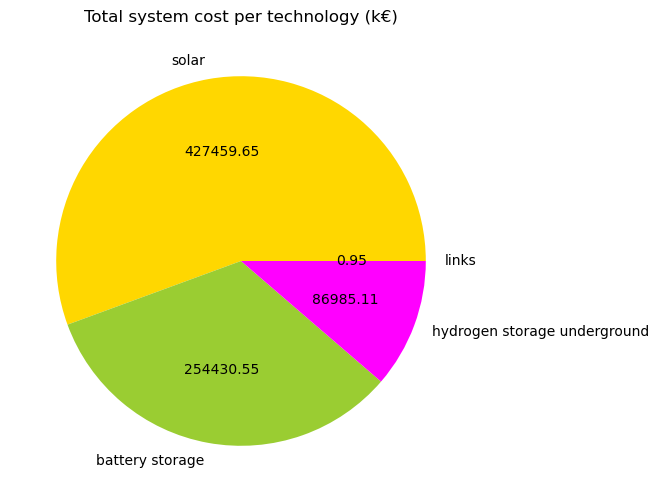

In [108]:
plot_total_costs()

- Capacities built per technologies

In [109]:
capacities_opt = plot_capacities()

- Electricity mix per generator

In [110]:
generator_mix = plot_generators_dispatch()

- Electricity mix per technology

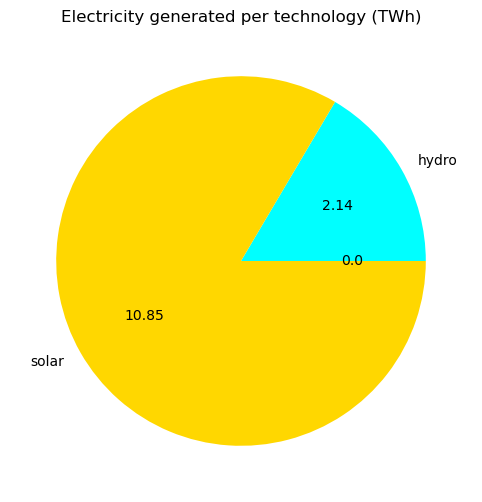

In [111]:
tech_mix = plot_technologies_dispatch()

- Price duration curves

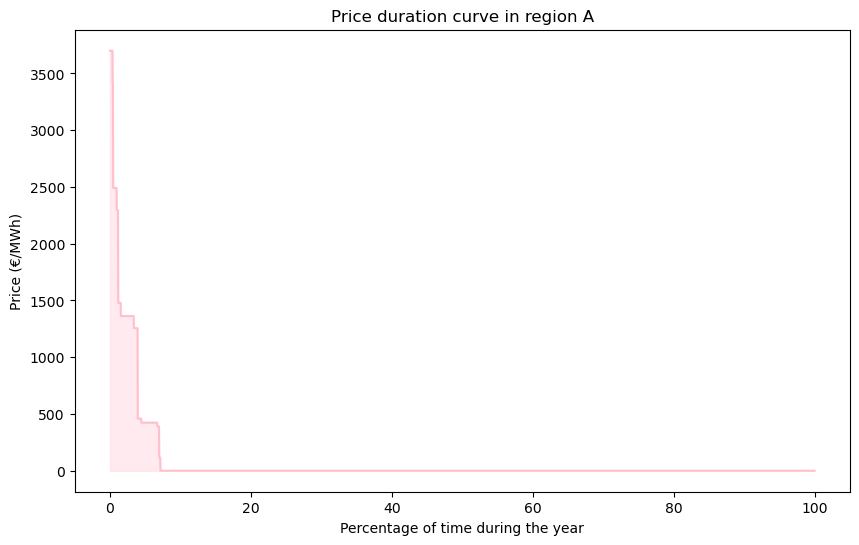

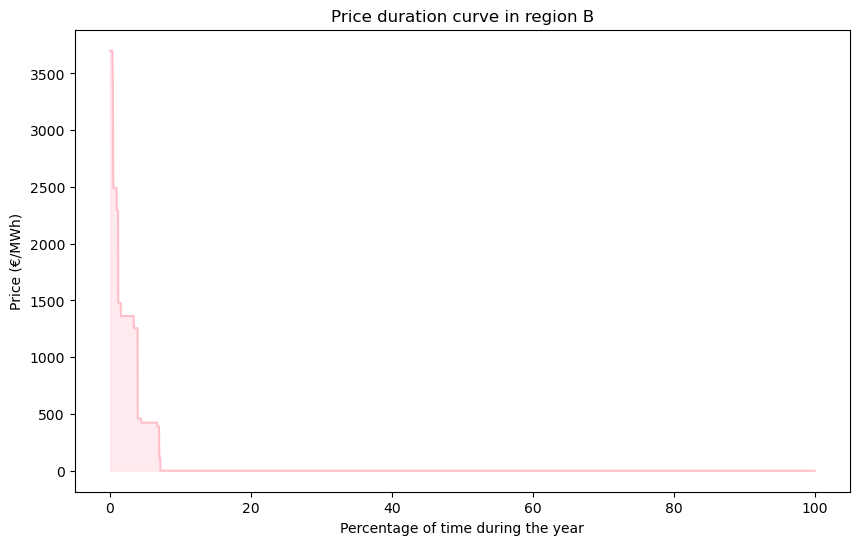

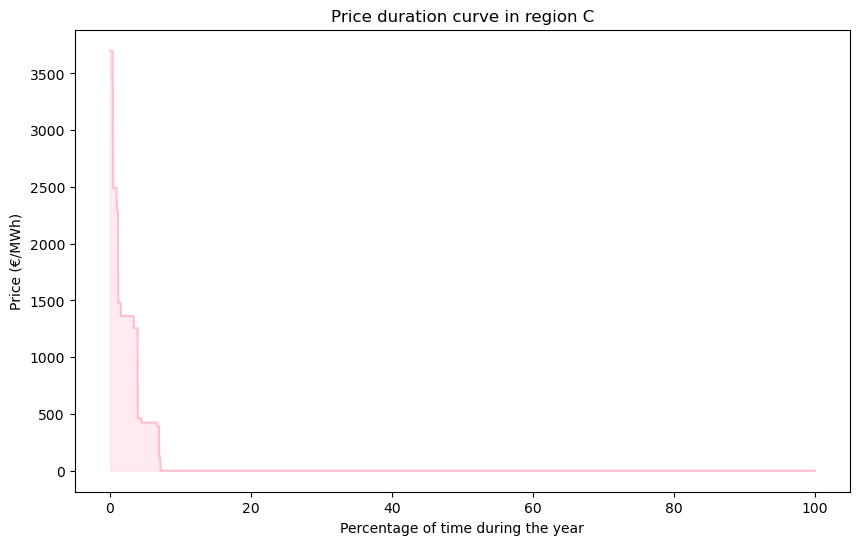

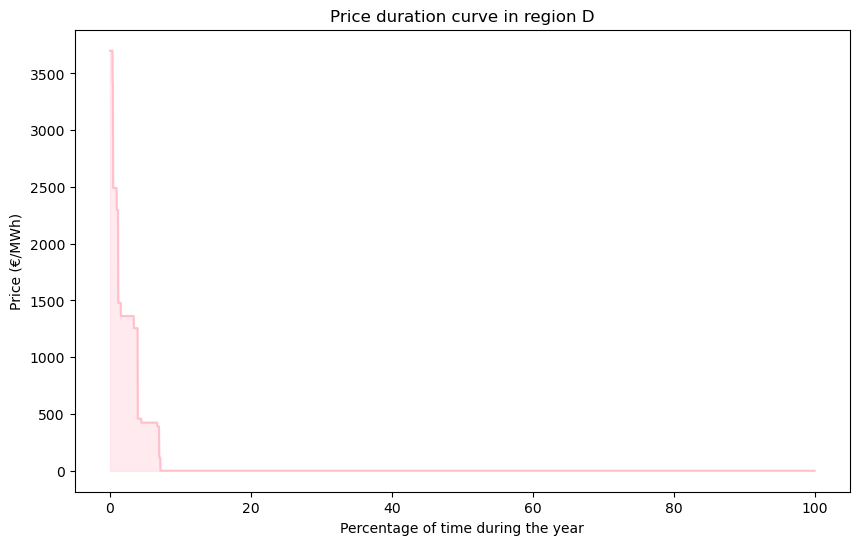

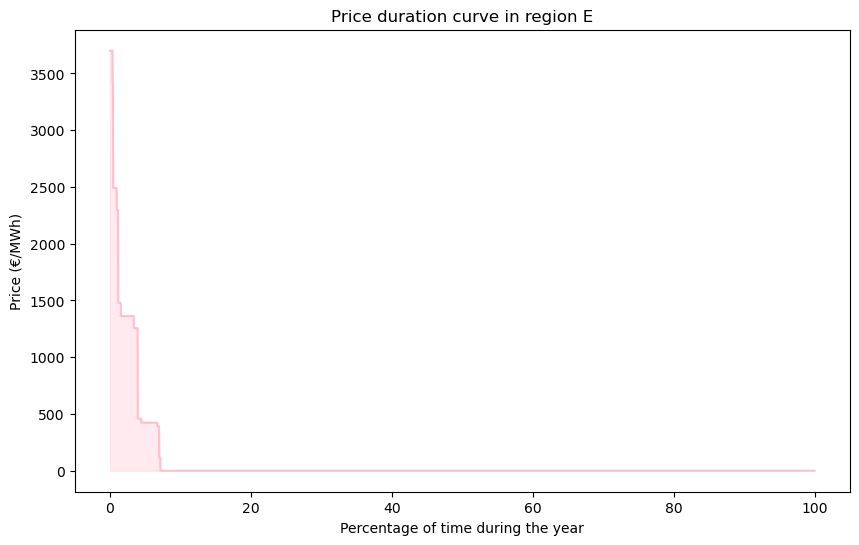

In [112]:
plot_price_curves()

- Average electricity prices per region

In [113]:
n.buses_t.marginal_price.mean() # €/MWh

Bus
A    84.674541
B    84.674686
C    84.674666
D    84.674807
E    84.674707
dtype: float64

- Rate of curtailment

In [114]:
curtailments()

carrier
OCGT     1.00
solar    0.22
dtype: float64


- Storage filling levels

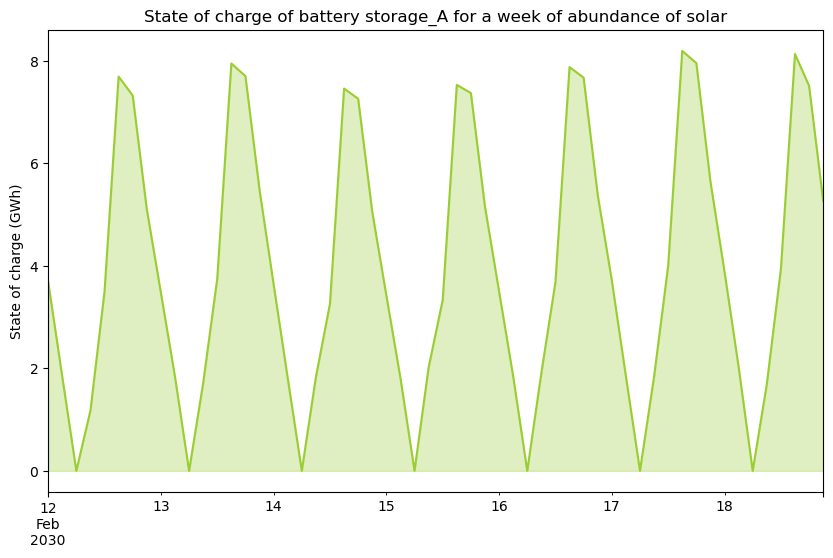

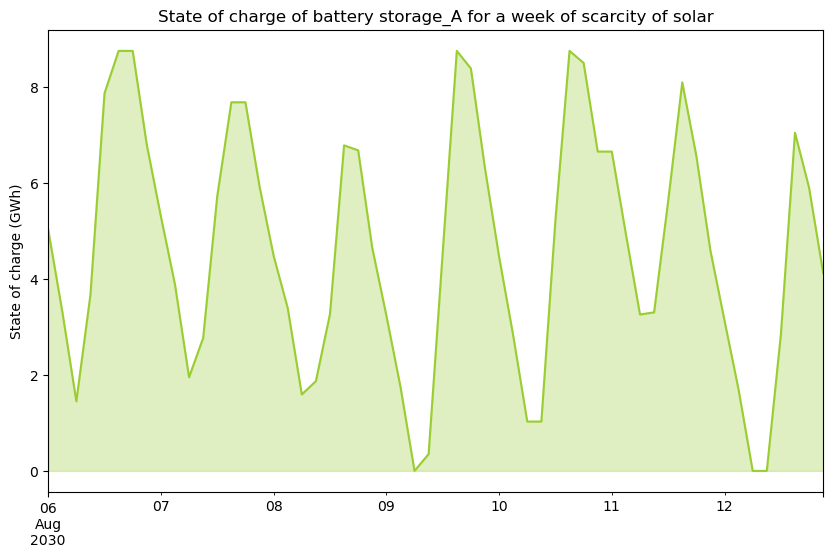

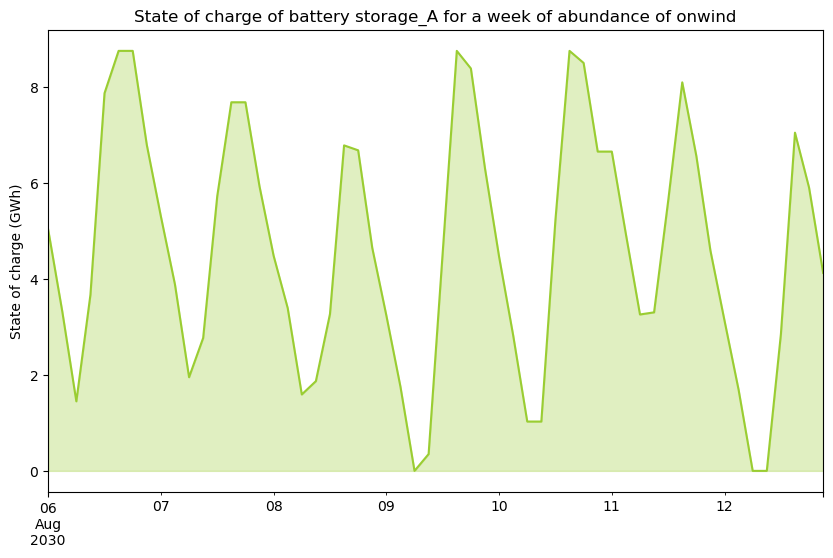

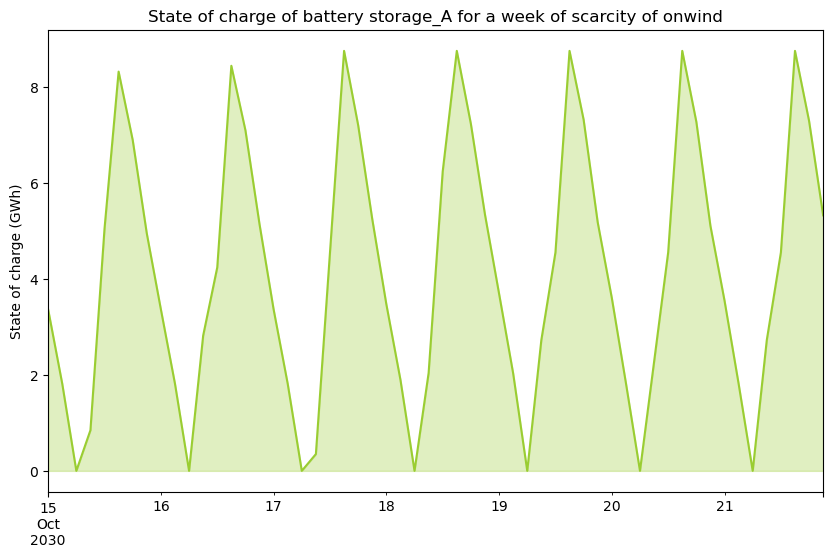

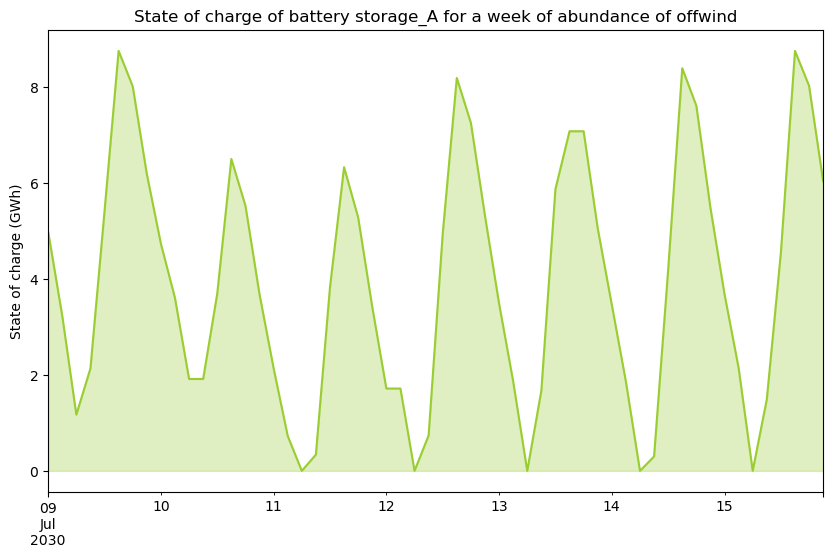

...

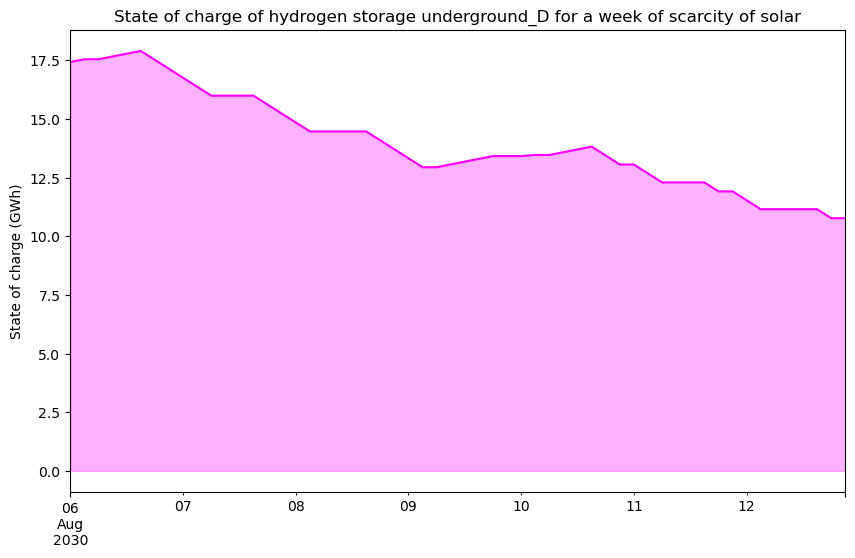

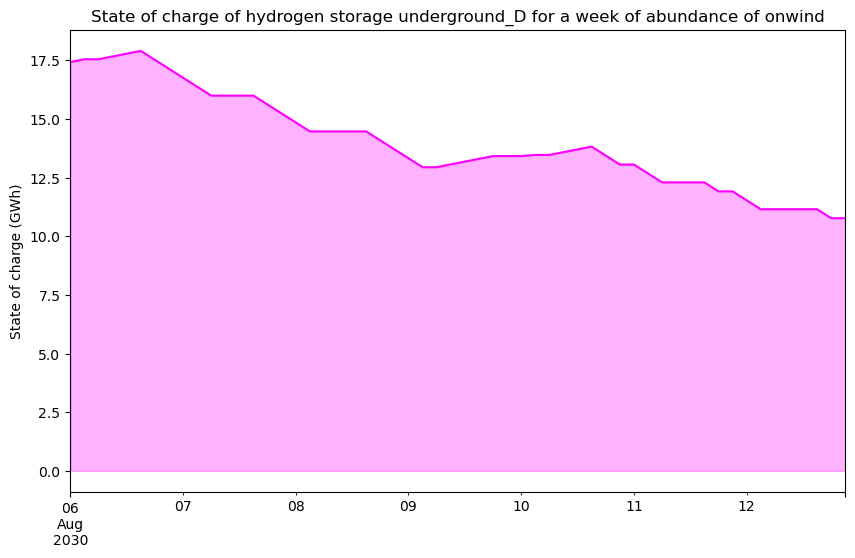

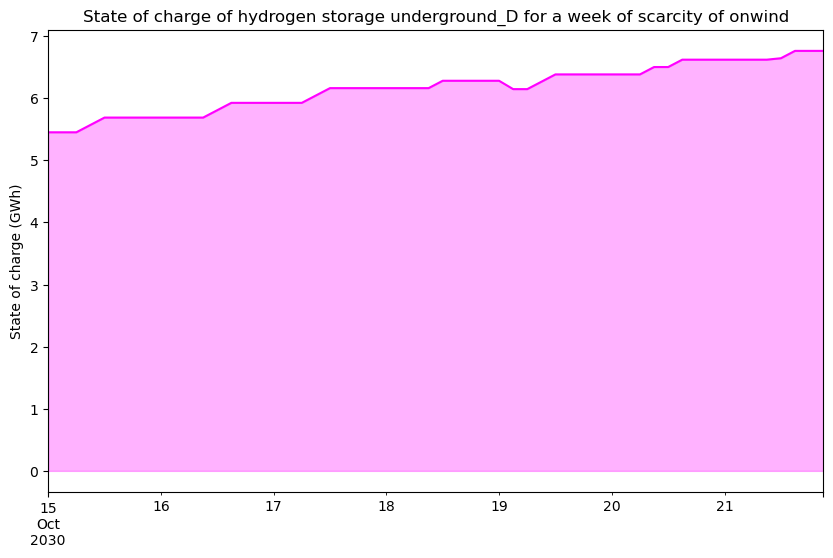

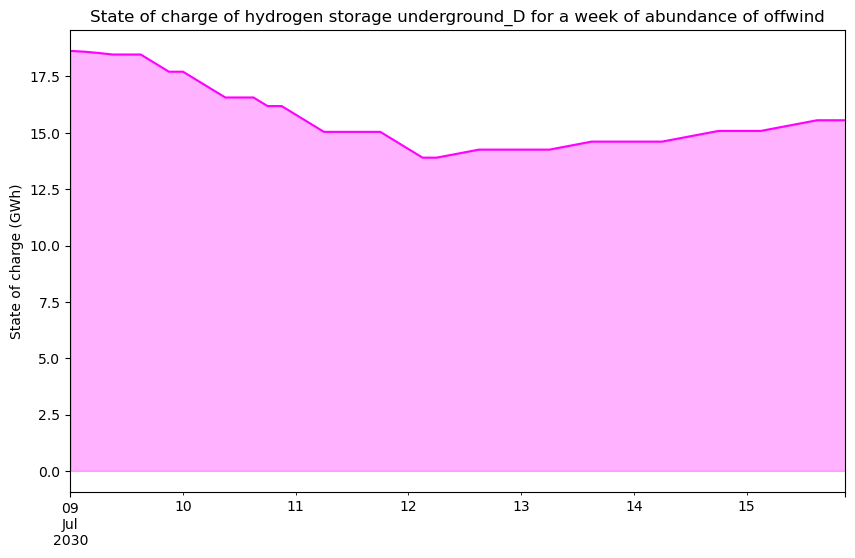

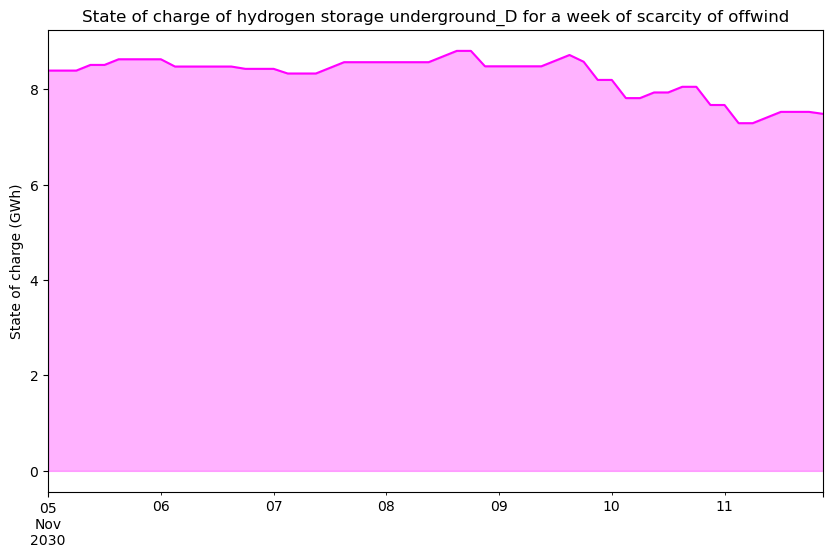

In [115]:
plot_storage()

### 25%

- **Reduce solar maximum capacity**

In [116]:
n.generators.loc[n.generators['carrier'] == "solar", 'p_nom_max'] = 0.25 * p_nom_max_solar

- **Optimize** the model

In [117]:
n.optimize(solver_name="gurobi")

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter WLSAccessID


INFO:gurobipy:Set parameter WLSAccessID


Set parameter WLSSecret


INFO:gurobipy:Set parameter WLSSecret


Set parameter LicenseID to value 2619906


INFO:gurobipy:Set parameter LicenseID to value 2619906


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 14.28it/s]
INFO:linopy.io: Writing time: 3.69s


Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-59a_l70u.lp


INFO:gurobipy:Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-59a_l70u.lp


Reading time = 0.91 seconds


INFO:gurobipy:Reading time = 0.91 seconds


obj: 335849 rows, 146026 columns, 735721 nonzeros


INFO:gurobipy:obj: 335849 rows, 146026 columns, 735721 nonzeros


Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


Optimize a model with 335849 rows, 146026 columns and 735721 nonzeros


INFO:gurobipy:Optimize a model with 335849 rows, 146026 columns and 735721 nonzeros


Model fingerprint: 0x3081ecbc


INFO:gurobipy:Model fingerprint: 0x3081ecbc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [8e-09, 3e+02]


INFO:gurobipy:  Matrix range     [8e-09, 3e+02]


  Objective range  [3e-02, 5e+05]


INFO:gurobipy:  Objective range  [3e-02, 5e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [6e+01, 1e+100]


INFO:gurobipy:  RHS range        [6e+01, 1e+100]


INFO:gurobipy:Warning: Model contains large rhs


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 163723 rows and 14754 columns


INFO:gurobipy:Presolve removed 163723 rows and 14754 columns


Presolve time: 0.99s


INFO:gurobipy:Presolve time: 0.99s


Presolved: 172126 rows, 131272 columns, 603738 nonzeros


INFO:gurobipy:Presolved: 172126 rows, 131272 columns, 603738 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.13s


INFO:gurobipy:Ordering time: 0.13s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 5.922e+05


INFO:gurobipy: AA' NZ     : 5.922e+05


 Factor NZ  : 2.646e+06 (roughly 140 MB of memory)


INFO:gurobipy: Factor NZ  : 2.646e+06 (roughly 140 MB of memory)


 Factor Ops : 7.348e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 7.348e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.21899103e+12 -2.75119254e+12  3.40e+04 3.36e+03  1.97e+10     2s


INFO:gurobipy:   0   1.21899103e+12 -2.75119254e+12  3.40e+04 3.36e+03  1.97e+10     2s


   1   1.45387922e+12 -3.30287750e+12  2.60e+04 1.74e+06  1.67e+10     2s


INFO:gurobipy:   1   1.45387922e+12 -3.30287750e+12  2.60e+04 1.74e+06  1.67e+10     2s


   2   1.47471276e+12 -1.25766234e+13  2.23e+04 1.05e+06  1.18e+10     2s


INFO:gurobipy:   2   1.47471276e+12 -1.25766234e+13  2.23e+04 1.05e+06  1.18e+10     2s


   3   7.44137388e+11 -1.80384320e+13  1.43e+04 3.66e+05  5.91e+09     2s


INFO:gurobipy:   3   7.44137388e+11 -1.80384320e+13  1.43e+04 3.66e+05  5.91e+09     2s


   4   1.76813367e+11 -1.73444786e+13  2.63e+03 8.09e+04  1.31e+09     2s


INFO:gurobipy:   4   1.76813367e+11 -1.73444786e+13  2.63e+03 8.09e+04  1.31e+09     2s


   5   9.53862359e+10 -1.04894195e+13  1.18e+03 2.34e+04  4.34e+08     2s


INFO:gurobipy:   5   9.53862359e+10 -1.04894195e+13  1.18e+03 2.34e+04  4.34e+08     2s


   6   6.88279514e+10 -7.28013286e+12  7.37e+02 9.74e+03  2.09e+08     2s


INFO:gurobipy:   6   6.88279514e+10 -7.28013286e+12  7.37e+02 9.74e+03  2.09e+08     2s


   7   4.68017054e+10 -4.97195799e+12  3.78e+02 4.50e+03  1.02e+08     3s


INFO:gurobipy:   7   4.68017054e+10 -4.97195799e+12  3.78e+02 4.50e+03  1.02e+08     3s


   8   3.55326863e+10 -3.60200280e+12  2.04e+02 2.30e+03  5.44e+07     3s


INFO:gurobipy:   8   3.55326863e+10 -3.60200280e+12  2.04e+02 2.30e+03  5.44e+07     3s


   9   2.84924329e+10 -2.28241188e+12  1.03e+02 9.54e+02  2.44e+07     3s


INFO:gurobipy:   9   2.84924329e+10 -2.28241188e+12  1.03e+02 9.54e+02  2.44e+07     3s


  10   2.33320672e+10 -1.28422801e+12  2.71e+01 3.89e+02  9.94e+06     3s


INFO:gurobipy:  10   2.33320672e+10 -1.28422801e+12  2.71e+01 3.89e+02  9.94e+06     3s


  11   2.12429197e+10 -2.66280080e+11  3.52e-01 6.40e+01  1.65e+06     4s


INFO:gurobipy:  11   2.12429197e+10 -2.66280080e+11  3.52e-01 6.40e+01  1.65e+06     4s


  12   1.87606786e+10 -1.79520774e+10  3.15e-09 6.00e+00  1.80e+05     4s


INFO:gurobipy:  12   1.87606786e+10 -1.79520774e+10  3.15e-09 6.00e+00  1.80e+05     4s


  13   1.28870497e+10 -9.06711677e+09  1.63e-09 2.93e+00  9.81e+04     4s


INFO:gurobipy:  13   1.28870497e+10 -9.06711677e+09  1.63e-09 2.93e+00  9.81e+04     4s


  14   8.94884095e+09 -2.73245619e+09  2.32e-09 9.39e-01  4.59e+04     4s


INFO:gurobipy:  14   8.94884095e+09 -2.73245619e+09  2.32e-09 9.39e-01  4.59e+04     4s


  15   5.92071859e+09 -1.06280904e+09  3.03e-09 4.49e-01  2.62e+04     4s


INFO:gurobipy:  15   5.92071859e+09 -1.06280904e+09  3.03e-09 4.49e-01  2.62e+04     4s


  16   3.61352159e+09 -2.69098590e+08  2.62e-09 1.53e-01  1.39e+04     5s


INFO:gurobipy:  16   3.61352159e+09 -2.69098590e+08  2.62e-09 1.53e-01  1.39e+04     5s


  17   1.76718360e+09  7.38816938e+07  5.82e-09 7.52e-02  6.05e+03     5s


INFO:gurobipy:  17   1.76718360e+09  7.38816938e+07  5.82e-09 7.52e-02  6.05e+03     5s


  18   1.43143347e+09  2.78547619e+08  1.66e-08 4.17e-02  4.08e+03     5s


INFO:gurobipy:  18   1.43143347e+09  2.78547619e+08  1.66e-08 4.17e-02  4.08e+03     5s


  19   1.18867983e+09  4.31402591e+08  9.60e-08 2.32e-02  2.67e+03     5s


INFO:gurobipy:  19   1.18867983e+09  4.31402591e+08  9.60e-08 2.32e-02  2.67e+03     5s


  20   1.04491698e+09  4.93721422e+08  1.17e-07 1.65e-02  1.94e+03     5s


INFO:gurobipy:  20   1.04491698e+09  4.93721422e+08  1.17e-07 1.65e-02  1.94e+03     5s


  21   9.68546531e+08  5.69852773e+08  1.17e-07 9.68e-03  1.39e+03     6s


INFO:gurobipy:  21   9.68546531e+08  5.69852773e+08  1.17e-07 9.68e-03  1.39e+03     6s


  22   8.84301034e+08  6.21975155e+08  4.64e-07 6.24e-03  9.19e+02     6s


INFO:gurobipy:  22   8.84301034e+08  6.21975155e+08  4.64e-07 6.24e-03  9.19e+02     6s


  23   8.64529097e+08  6.37654977e+08  8.84e-07 5.37e-03  7.95e+02     6s


INFO:gurobipy:  23   8.64529097e+08  6.37654977e+08  8.84e-07 5.37e-03  7.95e+02     6s


  24   8.45802190e+08  6.55619596e+08  1.24e-06 4.44e-03  6.66e+02     6s


INFO:gurobipy:  24   8.45802190e+08  6.55619596e+08  1.24e-06 4.44e-03  6.66e+02     6s


  25   8.40648567e+08  6.67668593e+08  2.85e-06 3.91e-03  6.05e+02     7s


INFO:gurobipy:  25   8.40648567e+08  6.67668593e+08  2.85e-06 3.91e-03  6.05e+02     7s


  26   8.26332390e+08  6.94474900e+08  5.29e-06 2.78e-03  4.61e+02     7s


INFO:gurobipy:  26   8.26332390e+08  6.94474900e+08  5.29e-06 2.78e-03  4.61e+02     7s


  27   8.14711001e+08  7.07555189e+08  7.25e-06 2.32e-03  3.75e+02     7s


INFO:gurobipy:  27   8.14711001e+08  7.07555189e+08  7.25e-06 2.32e-03  3.75e+02     7s


  28   8.05986942e+08  7.21546449e+08  7.48e-06 1.84e-03  2.96e+02     7s


INFO:gurobipy:  28   8.05986942e+08  7.21546449e+08  7.48e-06 1.84e-03  2.96e+02     7s


  29   7.93380744e+08  7.48154217e+08  2.95e-05 1.02e-03  1.59e+02     8s


INFO:gurobipy:  29   7.93380744e+08  7.48154217e+08  2.95e-05 1.02e-03  1.59e+02     8s


  30   7.88907195e+08  7.72777250e+08  4.91e-05 3.00e-04  5.63e+01     8s


INFO:gurobipy:  30   7.88907195e+08  7.72777250e+08  4.91e-05 3.00e-04  5.63e+01     8s


  31   7.87296381e+08  7.78169559e+08  3.91e-05 1.50e-04  3.17e+01     8s


INFO:gurobipy:  31   7.87296381e+08  7.78169559e+08  3.91e-05 1.50e-04  3.17e+01     8s


  32   7.86390838e+08  7.79266600e+08  2.75e-05 1.19e-04  2.47e+01     8s


INFO:gurobipy:  32   7.86390838e+08  7.79266600e+08  2.75e-05 1.19e-04  2.47e+01     8s


  33   7.85650583e+08  7.81303781e+08  2.01e-05 6.34e-05  1.50e+01     8s


INFO:gurobipy:  33   7.85650583e+08  7.81303781e+08  2.01e-05 6.34e-05  1.50e+01     8s


  34   7.84353672e+08  7.83306227e+08  1.33e-05 1.51e-05  3.58e+00     8s


INFO:gurobipy:  34   7.84353672e+08  7.83306227e+08  1.33e-05 1.51e-05  3.58e+00     8s


  35   7.84037766e+08  7.83802697e+08  2.89e-06 2.81e-06  8.01e-01     8s


INFO:gurobipy:  35   7.84037766e+08  7.83802697e+08  2.89e-06 2.81e-06  8.01e-01     8s


  36   7.84013969e+08  7.83878092e+08  1.89e-06 1.45e-06  4.63e-01     9s


INFO:gurobipy:  36   7.84013969e+08  7.83878092e+08  1.89e-06 1.45e-06  4.63e-01     9s


  37   7.84004550e+08  7.83907854e+08  1.53e-06 2.45e-06  3.29e-01     9s


INFO:gurobipy:  37   7.84004550e+08  7.83907854e+08  1.53e-06 2.45e-06  3.29e-01     9s


  38   7.84003811e+08  7.83918628e+08  1.50e-06 1.36e-06  2.90e-01     9s


INFO:gurobipy:  38   7.84003811e+08  7.83918628e+08  1.50e-06 1.36e-06  2.90e-01     9s


  39   7.84000099e+08  7.83921941e+08  1.35e-06 8.74e-07  2.66e-01     9s


INFO:gurobipy:  39   7.84000099e+08  7.83921941e+08  1.35e-06 8.74e-07  2.66e-01     9s


  40   7.83995611e+08  7.83924539e+08  1.17e-06 1.47e-06  2.42e-01     9s


INFO:gurobipy:  40   7.83995611e+08  7.83924539e+08  1.17e-06 1.47e-06  2.42e-01     9s


  41   7.83993158e+08  7.83935161e+08  1.09e-06 1.78e-06  1.97e-01    10s


INFO:gurobipy:  41   7.83993158e+08  7.83935161e+08  1.09e-06 1.78e-06  1.97e-01    10s


  42   7.83989949e+08  7.83936668e+08  9.68e-07 2.36e-06  1.81e-01    10s


INFO:gurobipy:  42   7.83989949e+08  7.83936668e+08  9.68e-07 2.36e-06  1.81e-01    10s


  43   7.83982306e+08  7.83948993e+08  6.78e-07 2.14e-06  1.13e-01    10s


INFO:gurobipy:  43   7.83982306e+08  7.83948993e+08  6.78e-07 2.14e-06  1.13e-01    10s


  44   7.83977859e+08  7.83952331e+08  5.28e-07 1.64e-06  8.68e-02    10s


INFO:gurobipy:  44   7.83977859e+08  7.83952331e+08  5.28e-07 1.64e-06  8.68e-02    10s


  45   7.83974490e+08  7.83955746e+08  4.13e-07 1.02e-06  6.37e-02    11s


INFO:gurobipy:  45   7.83974490e+08  7.83955746e+08  4.13e-07 1.02e-06  6.37e-02    11s


  46   7.83971158e+08  7.83957711e+08  3.04e-07 6.86e-07  4.57e-02    11s


INFO:gurobipy:  46   7.83971158e+08  7.83957711e+08  3.04e-07 6.86e-07  4.57e-02    11s


  47   7.83969372e+08  7.83959276e+08  2.48e-07 1.18e-06  3.43e-02    11s


INFO:gurobipy:  47   7.83969372e+08  7.83959276e+08  2.48e-07 1.18e-06  3.43e-02    11s


  48   7.83966804e+08  7.83960112e+08  1.60e-07 7.55e-07  2.27e-02    12s


INFO:gurobipy:  48   7.83966804e+08  7.83960112e+08  1.60e-07 7.55e-07  2.27e-02    12s


  49   7.83965726e+08  7.83960984e+08  1.24e-07 4.30e-07  1.61e-02    12s


INFO:gurobipy:  49   7.83965726e+08  7.83960984e+08  1.24e-07 4.30e-07  1.61e-02    12s


  50   7.83964702e+08  7.83961150e+08  9.16e-08 3.55e-07  1.21e-02    12s


INFO:gurobipy:  50   7.83964702e+08  7.83961150e+08  9.16e-08 3.55e-07  1.21e-02    12s


  51   7.83963984e+08  7.83961340e+08  6.70e-08 2.55e-07  8.99e-03    13s


INFO:gurobipy:  51   7.83963984e+08  7.83961340e+08  6.70e-08 2.55e-07  8.99e-03    13s


  52   7.83963674e+08  7.83961557e+08  5.57e-08 2.81e-07  7.19e-03    13s


INFO:gurobipy:  52   7.83963674e+08  7.83961557e+08  5.57e-08 2.81e-07  7.19e-03    13s


  53   7.83963297e+08  7.83961733e+08  4.26e-08 1.59e-07  5.32e-03    13s


INFO:gurobipy:  53   7.83963297e+08  7.83961733e+08  4.26e-08 1.59e-07  5.32e-03    13s


  54   7.83962880e+08  7.83961806e+08  2.70e-08 1.03e-07  3.65e-03    14s


INFO:gurobipy:  54   7.83962880e+08  7.83961806e+08  2.70e-08 1.03e-07  3.65e-03    14s


  55   7.83962773e+08  7.83961853e+08  2.31e-08 1.42e-07  3.13e-03    14s


INFO:gurobipy:  55   7.83962773e+08  7.83961853e+08  2.31e-08 1.42e-07  3.13e-03    14s


  56   7.83962723e+08  7.83961914e+08  2.13e-08 1.06e-07  2.75e-03    14s


INFO:gurobipy:  56   7.83962723e+08  7.83961914e+08  2.13e-08 1.06e-07  2.75e-03    14s


  57   7.83962487e+08  7.83961937e+08  1.28e-08 1.06e-07  1.87e-03    15s


INFO:gurobipy:  57   7.83962487e+08  7.83961937e+08  1.28e-08 1.06e-07  1.87e-03    15s


  58   7.83962443e+08  7.83961970e+08  1.13e-08 8.65e-08  1.61e-03    15s


INFO:gurobipy:  58   7.83962443e+08  7.83961970e+08  1.13e-08 8.65e-08  1.61e-03    15s


  59   7.83962405e+08  7.83962016e+08  9.95e-09 5.90e-08  1.32e-03    15s


INFO:gurobipy:  59   7.83962405e+08  7.83962016e+08  9.95e-09 5.90e-08  1.32e-03    15s


  60   7.83962393e+08  7.83962029e+08  9.42e-09 2.28e-08  1.24e-03    16s


INFO:gurobipy:  60   7.83962393e+08  7.83962029e+08  9.42e-09 2.28e-08  1.24e-03    16s


  61   7.83962368e+08  7.83962033e+08  8.46e-09 6.21e-08  1.14e-03    16s


INFO:gurobipy:  61   7.83962368e+08  7.83962033e+08  8.46e-09 6.21e-08  1.14e-03    16s


  62   7.83962331e+08  7.83962047e+08  6.98e-09 1.08e-07  9.65e-04    16s


INFO:gurobipy:  62   7.83962331e+08  7.83962047e+08  6.98e-09 1.08e-07  9.65e-04    16s


  63   7.83962266e+08  7.83962056e+08  4.72e-09 4.87e-08  7.15e-04    16s


INFO:gurobipy:  63   7.83962266e+08  7.83962056e+08  4.72e-09 4.87e-08  7.15e-04    16s


  64   7.83962217e+08  7.83962089e+08  2.68e-09 6.70e-08  4.36e-04    17s


INFO:gurobipy:  64   7.83962217e+08  7.83962089e+08  2.68e-09 6.70e-08  4.36e-04    17s


  65   7.83962206e+08  7.83962105e+08  2.27e-09 6.37e-08  3.45e-04    17s


INFO:gurobipy:  65   7.83962206e+08  7.83962105e+08  2.27e-09 6.37e-08  3.45e-04    17s


  66   7.83962186e+08  7.83962112e+08  1.49e-09 8.00e-08  2.52e-04    17s


INFO:gurobipy:  66   7.83962186e+08  7.83962112e+08  1.49e-09 8.00e-08  2.52e-04    17s


  67   7.83962170e+08  7.83962123e+08  8.16e-10 7.00e-11  1.59e-04    18s


INFO:gurobipy:  67   7.83962170e+08  7.83962123e+08  8.16e-10 7.00e-11  1.59e-04    18s


  68   7.83962164e+08  7.83962131e+08  5.85e-10 3.75e-08  1.12e-04    18s


INFO:gurobipy:  68   7.83962164e+08  7.83962131e+08  5.85e-10 3.75e-08  1.12e-04    18s


  69   7.83962163e+08  7.83962133e+08  5.61e-10 3.51e-08  1.00e-04    18s


INFO:gurobipy:  69   7.83962163e+08  7.83962133e+08  5.61e-10 3.51e-08  1.00e-04    18s


  70   7.83962163e+08  7.83962134e+08  5.45e-10 1.85e-08  9.59e-05    19s


INFO:gurobipy:  70   7.83962163e+08  7.83962134e+08  5.45e-10 1.85e-08  9.59e-05    19s


  71   7.83962159e+08  7.83962138e+08  4.25e-10 4.07e-08  7.31e-05    19s


INFO:gurobipy:  71   7.83962159e+08  7.83962138e+08  4.25e-10 4.07e-08  7.31e-05    19s


  72   7.83962159e+08  7.83962139e+08  3.97e-10 5.84e-08  6.82e-05    19s


INFO:gurobipy:  72   7.83962159e+08  7.83962139e+08  3.97e-10 5.84e-08  6.82e-05    19s


  73   7.83962156e+08  7.83962140e+08  3.08e-10 4.08e-09  5.52e-05    20s


INFO:gurobipy:  73   7.83962156e+08  7.83962140e+08  3.08e-10 4.08e-09  5.52e-05    20s


  74   7.83962155e+08  7.83962140e+08  2.57e-10 5.99e-08  4.89e-05    20s


INFO:gurobipy:  74   7.83962155e+08  7.83962140e+08  2.57e-10 5.99e-08  4.89e-05    20s


  75   7.83962154e+08  7.83962142e+08  2.22e-10 6.47e-08  3.99e-05    20s


INFO:gurobipy:  75   7.83962154e+08  7.83962142e+08  2.22e-10 6.47e-08  3.99e-05    20s


  76   7.83962152e+08  7.83962145e+08  1.61e-10 1.72e-08  2.62e-05    21s


INFO:gurobipy:  76   7.83962152e+08  7.83962145e+08  1.61e-10 1.72e-08  2.62e-05    21s


INFO:gurobipy:


Barrier solved model in 76 iterations and 20.77 seconds (7.84 work units)


INFO:gurobipy:Barrier solved model in 76 iterations and 20.77 seconds (7.84 work units)


Optimal objective 7.83962152e+08


INFO:gurobipy:Optimal objective 7.83962152e+08


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   17518 DPushes remaining with DInf 0.0000000e+00                21s


INFO:gurobipy:   17518 DPushes remaining with DInf 0.0000000e+00                21s


       0 DPushes remaining with DInf 0.0000000e+00                21s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                21s


INFO:gurobipy:


   75586 PPushes remaining with PInf 0.0000000e+00                21s


INFO:gurobipy:   75586 PPushes remaining with PInf 0.0000000e+00                21s


    1349 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:    1349 PPushes remaining with PInf 0.0000000e+00                25s


       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                25s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 6.7923381e+01     25s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 6.7923381e+01     25s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   78309    7.8396215e+08   0.000000e+00   6.792338e+01     25s


INFO:gurobipy:   78309    7.8396215e+08   0.000000e+00   6.792338e+01     25s


   79079    7.8396215e+08   0.000000e+00   6.919445e-01     30s


INFO:gurobipy:   79079    7.8396215e+08   0.000000e+00   6.919445e-01     30s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


   79198    7.8396215e+08   0.000000e+00   0.000000e+00     31s


INFO:gurobipy:   79198    7.8396215e+08   0.000000e+00   0.000000e+00     31s


INFO:gurobipy:


Solved in 79198 iterations and 31.23 seconds (17.11 work units)


INFO:gurobipy:Solved in 79198 iterations and 31.23 seconds (17.11 work units)


Optimal objective  7.839621479e+08


INFO:gurobipy:Optimal objective  7.839621479e+08


INFO:gurobipy:Warning: environment still referenced so free is deferred (Continue to use WLS)
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 146026 primals, 335849 duals
Objective: 7.84e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper, StorageUnit-ext-p_dispatch-lower, StorageUnit-ext-p_dispatch-upper, StorageUnit-ext-p_store-lower, StorageUnit-ext-p_store-upper, StorageUnit-ext-state_of_charge-lower, StorageUnit-ext-state_of_charge-upper, StorageUnit-energy_balance were not assigned to the network.


('ok', 'optimal')

- Total system cost per technology per year

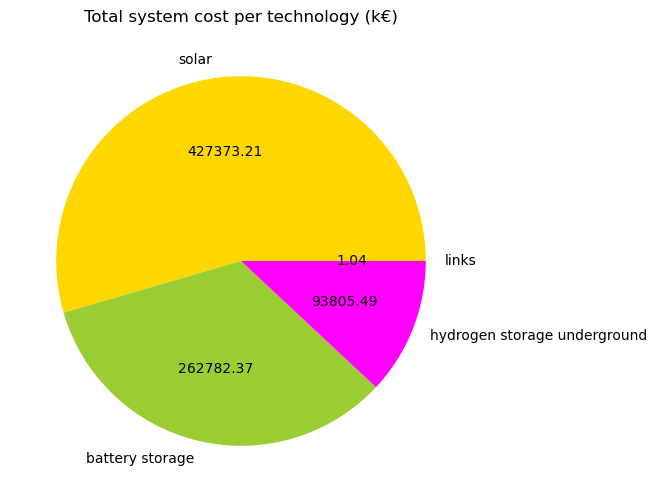

In [118]:
plot_total_costs()

- Capacities built per technologies

In [119]:
capacities_opt = plot_capacities()

- Electricity mix per generator

In [120]:
generator_mix = plot_generators_dispatch()

- Electricity mix per technology

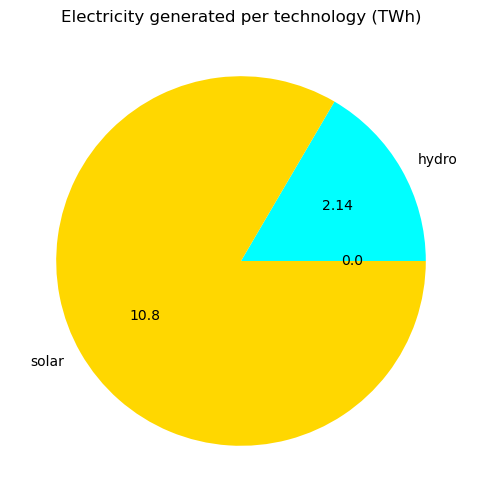

In [121]:
tech_mix = plot_technologies_dispatch()

- Price duration curves

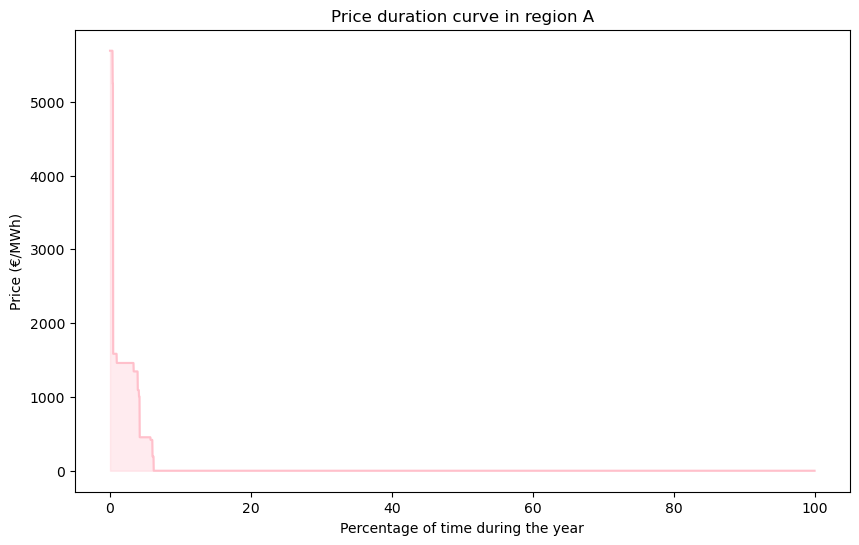

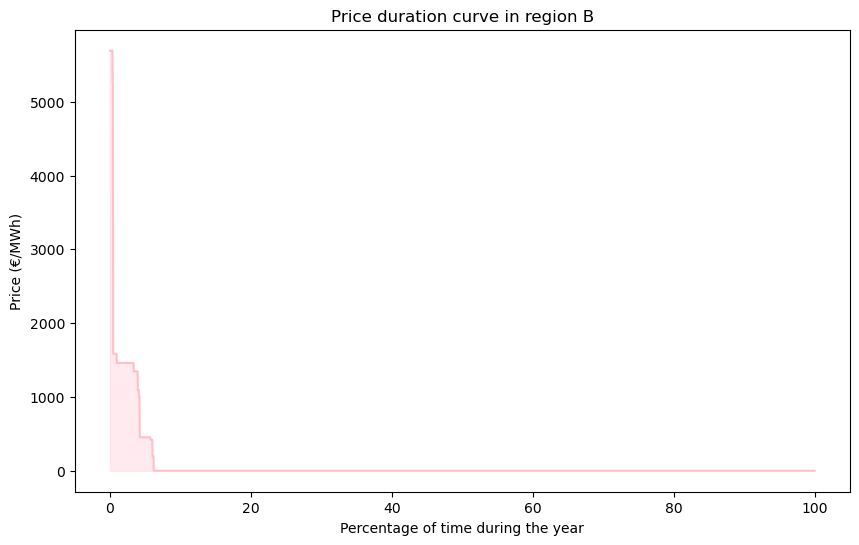

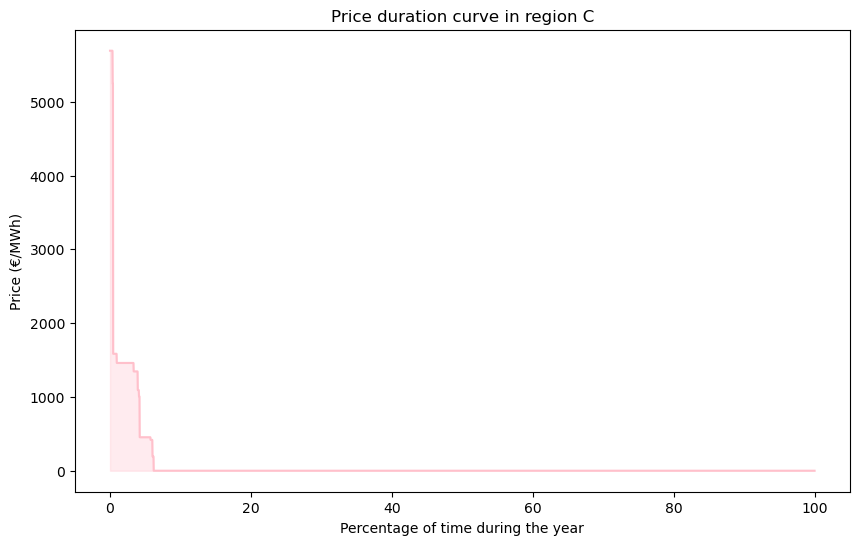

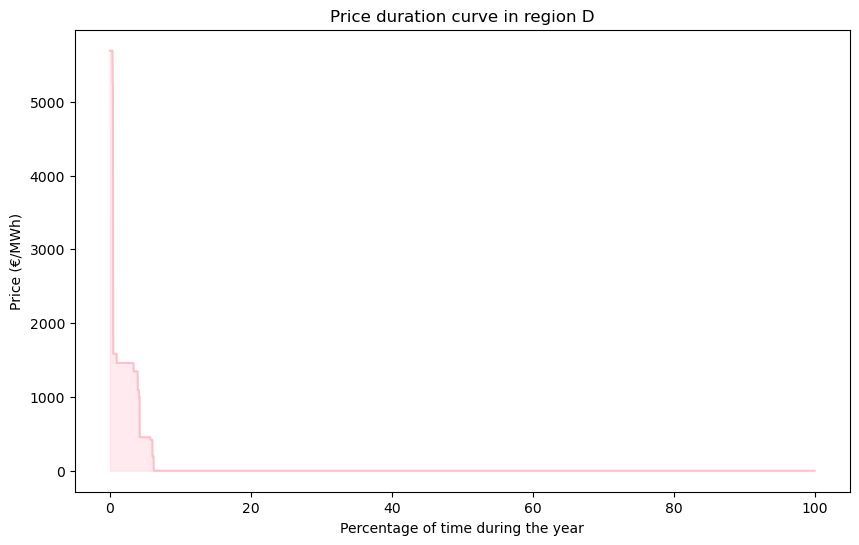

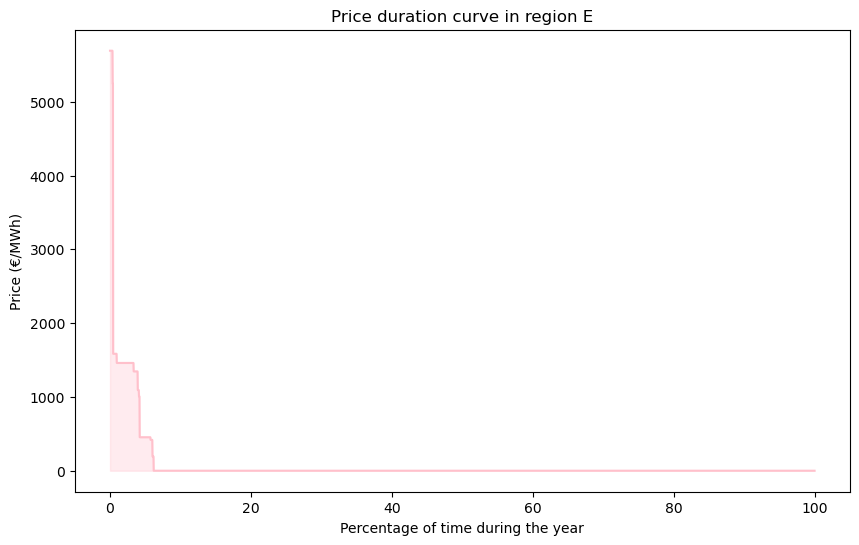

In [122]:
plot_price_curves()

- Average electricity prices per region

In [123]:
n.buses_t.marginal_price.mean() # €/MWh

Bus
A    87.422281
B    87.422395
C    87.422421
D    87.422561
E    87.422446
dtype: float64

- Rate of curtailment

In [124]:
curtailments()

carrier
OCGT     1.00
solar    0.24
dtype: float64


- Storage filling levels

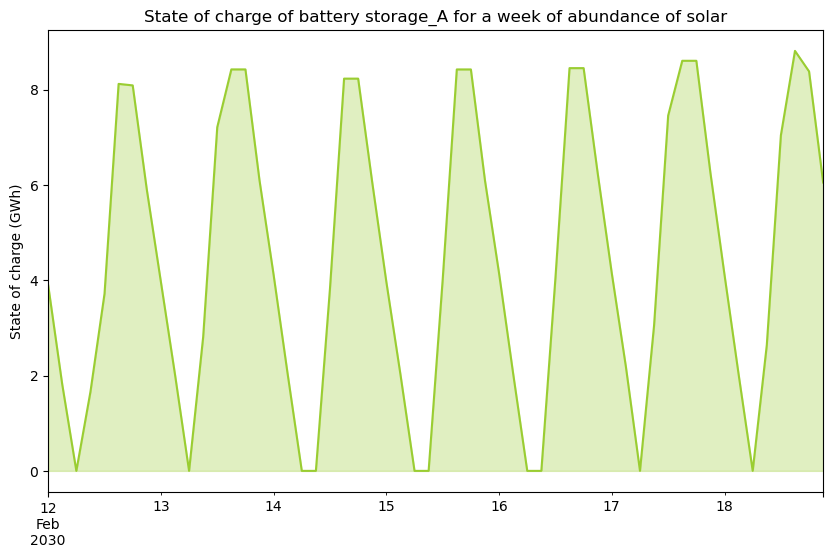

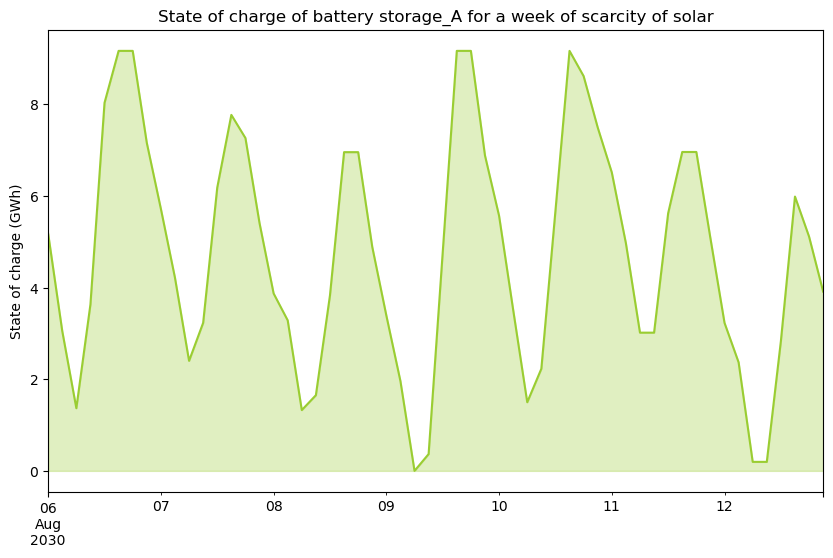

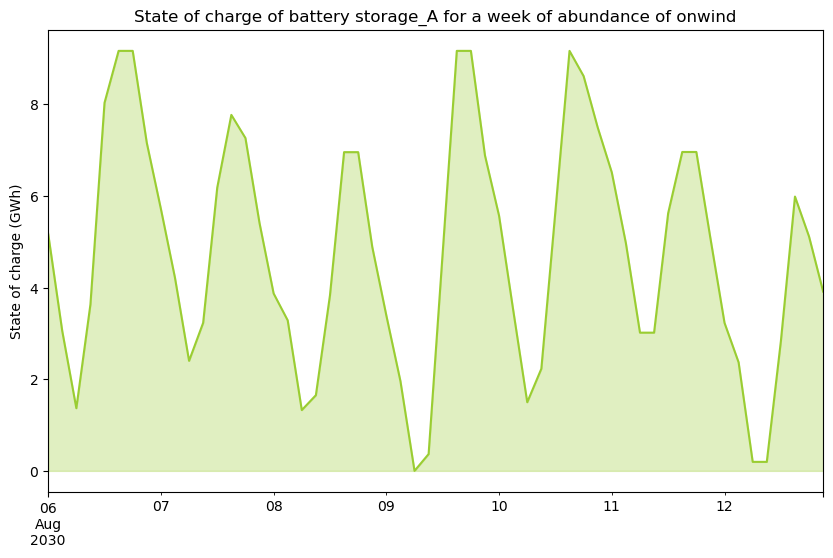

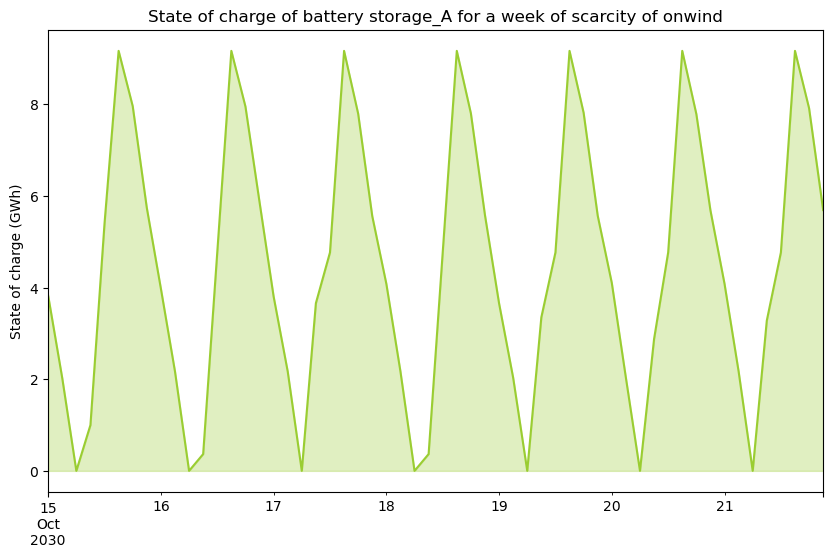

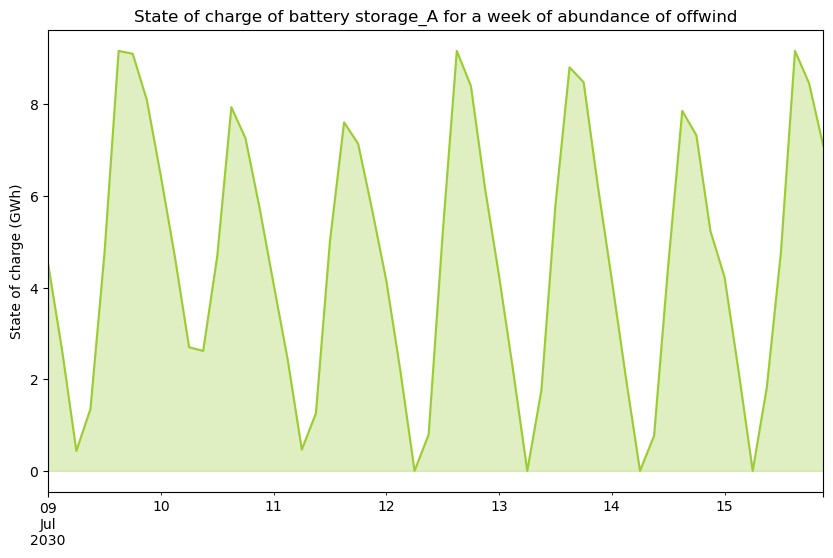

...

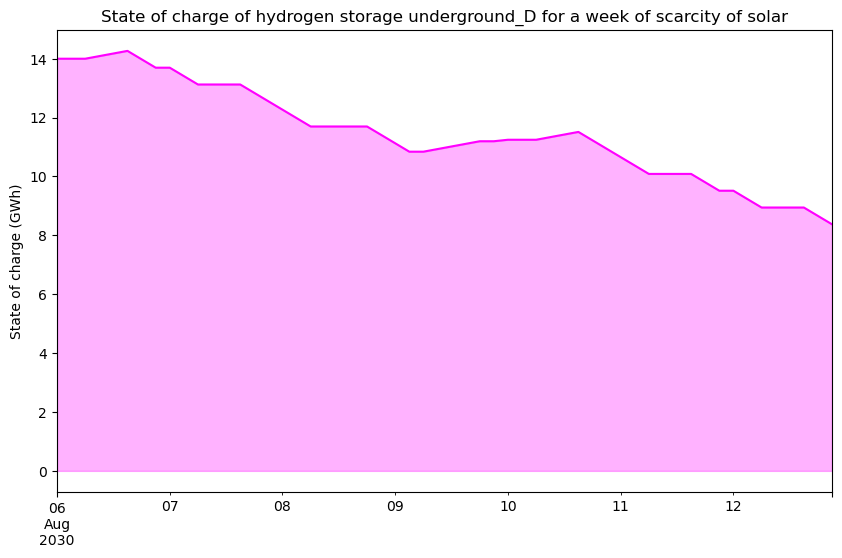

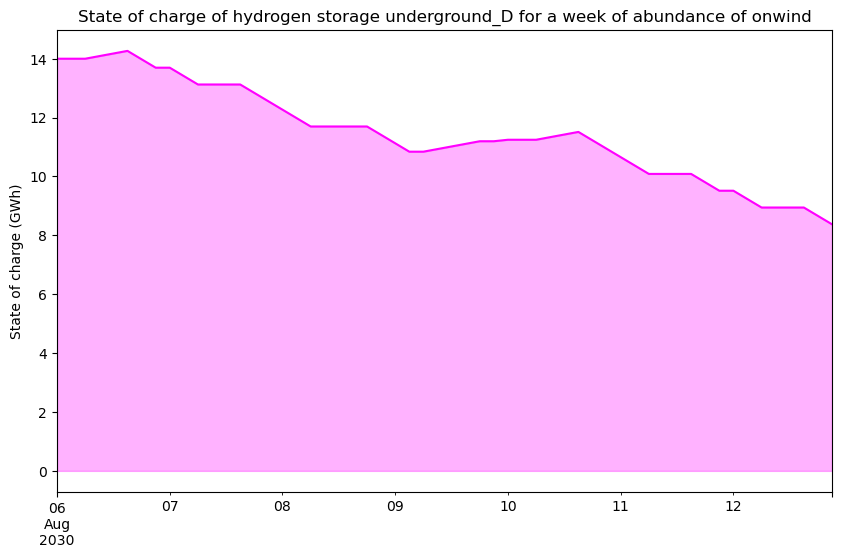

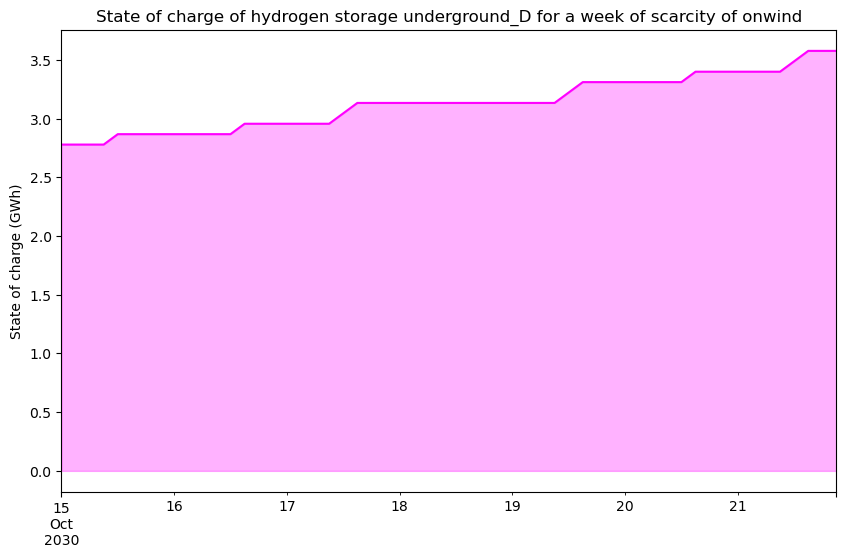

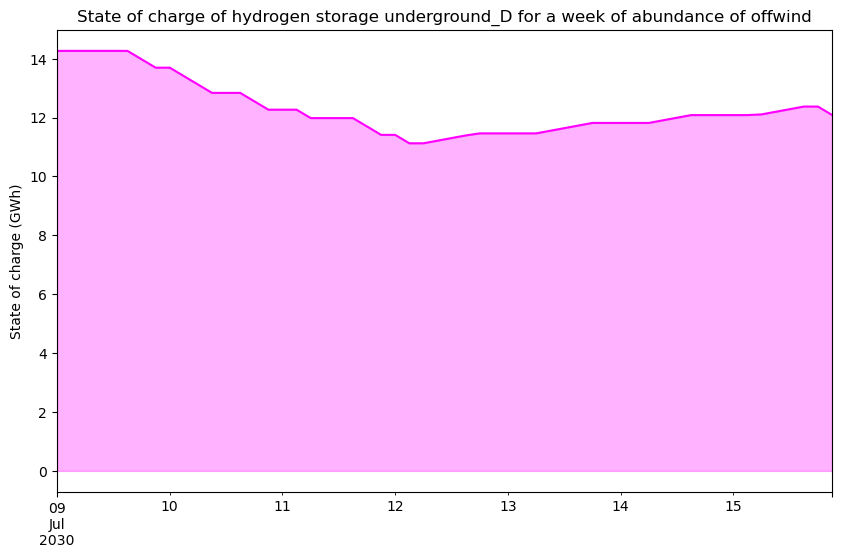

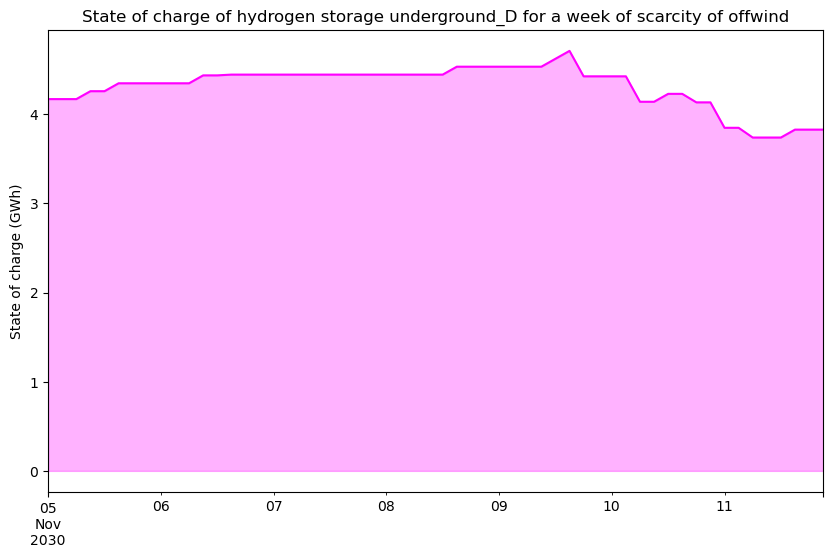

In [125]:
plot_storage()

### 0%

- **Reduce solar maximum capacity**

In [126]:
n.generators.loc[n.generators['carrier'] == "solar", 'p_nom_max'] = 0 * p_nom_max_solar

- **Optimize** the model

In [127]:
n.optimize(solver_name="gurobi")

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter WLSAccessID


INFO:gurobipy:Set parameter WLSAccessID


Set parameter WLSSecret


INFO:gurobipy:Set parameter WLSSecret


Set parameter LicenseID to value 2619906


INFO:gurobipy:Set parameter LicenseID to value 2619906


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|█████████████████████████████████████████████████████| 8/8 [00:00<00:00, 16.37it/s]
INFO:linopy.io: Writing time: 3.52s


Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-7us1n1b0.lp


INFO:gurobipy:Read LP format model from file C:\Users\mathi\AppData\Local\Temp\linopy-problem-7us1n1b0.lp


Reading time = 0.76 seconds


INFO:gurobipy:Reading time = 0.76 seconds


obj: 335849 rows, 146026 columns, 735721 nonzeros


INFO:gurobipy:obj: 335849 rows, 146026 columns, 735721 nonzeros


Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: Intel(R) Core(TM) i5-7300HQ CPU @ 2.50GHz, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


INFO:gurobipy:Academic license 2619906 - for non-commercial use only - registered to d.___@campus.tu-berlin.de


Optimize a model with 335849 rows, 146026 columns and 735721 nonzeros


INFO:gurobipy:Optimize a model with 335849 rows, 146026 columns and 735721 nonzeros


Model fingerprint: 0x96aa3e83


INFO:gurobipy:Model fingerprint: 0x96aa3e83


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [8e-09, 3e+02]


INFO:gurobipy:  Matrix range     [8e-09, 3e+02]


  Objective range  [3e-02, 5e+05]


INFO:gurobipy:  Objective range  [3e-02, 5e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [6e+01, 1e+100]


INFO:gurobipy:  RHS range        [6e+01, 1e+100]


INFO:gurobipy:Warning: Model contains large rhs


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 169563 rows and 20628 columns


INFO:gurobipy:Presolve removed 169563 rows and 20628 columns


Presolve time: 0.60s


INFO:gurobipy:Presolve time: 0.60s


Presolved: 166286 rows, 125398 columns, 583718 nonzeros


INFO:gurobipy:Presolved: 166286 rows, 125398 columns, 583718 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.14s


INFO:gurobipy:Ordering time: 0.14s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 22


INFO:gurobipy: Dense cols : 22


 AA' NZ     : 5.783e+05


INFO:gurobipy: AA' NZ     : 5.783e+05


 Factor NZ  : 2.529e+06 (roughly 140 MB of memory)


INFO:gurobipy: Factor NZ  : 2.529e+06 (roughly 140 MB of memory)


 Factor Ops : 6.592e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 6.592e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.30499171e+12 -2.65713960e+12  2.43e+04 2.16e+03  2.18e+10     1s


INFO:gurobipy:   0   1.30499171e+12 -2.65713960e+12  2.43e+04 2.16e+03  2.18e+10     1s


   1   1.60021072e+12 -3.08562694e+12  1.77e+04 1.79e+06  1.82e+10     1s


INFO:gurobipy:   1   1.60021072e+12 -3.08562694e+12  1.77e+04 1.79e+06  1.82e+10     1s


   2   1.58248368e+12 -4.72669961e+12  1.59e+04 1.16e+06  1.31e+10     1s


INFO:gurobipy:   2   1.58248368e+12 -4.72669961e+12  1.59e+04 1.16e+06  1.31e+10     1s


   3   9.36086063e+11 -7.19656431e+12  1.17e+04 3.18e+05  5.99e+09     1s


INFO:gurobipy:   3   9.36086063e+11 -7.19656431e+12  1.17e+04 3.18e+05  5.99e+09     1s


   4   2.48527673e+11 -5.29080020e+12  2.25e+03 8.65e+04  1.55e+09     2s


INFO:gurobipy:   4   2.48527673e+11 -5.29080020e+12  2.25e+03 8.65e+04  1.55e+09     2s


   5   1.08667533e+11 -3.85522879e+12  8.37e+02 2.09e+04  4.28e+08     2s


INFO:gurobipy:   5   1.08667533e+11 -3.85522879e+12  8.37e+02 2.09e+04  4.28e+08     2s


   6   7.39559081e+10 -3.18890751e+12  4.91e+02 8.71e+03  2.04e+08     2s


INFO:gurobipy:   6   7.39559081e+10 -3.18890751e+12  4.91e+02 8.71e+03  2.04e+08     2s


   7   5.43857131e+10 -2.69276826e+12  3.00e+02 4.71e+03  1.18e+08     2s


INFO:gurobipy:   7   5.43857131e+10 -2.69276826e+12  3.00e+02 4.71e+03  1.18e+08     2s


   8   4.35794778e+10 -2.27648697e+12  1.97e+02 2.62e+03  7.09e+07     2s


INFO:gurobipy:   8   4.35794778e+10 -2.27648697e+12  1.97e+02 2.62e+03  7.09e+07     2s


   9   3.54435676e+10 -1.80957680e+12  1.21e+02 1.31e+03  3.95e+07     2s


INFO:gurobipy:   9   3.54435676e+10 -1.80957680e+12  1.21e+02 1.31e+03  3.95e+07     2s


  10   2.82861825e+10 -1.35630076e+12  5.67e+01 6.44e+02  1.96e+07     2s


INFO:gurobipy:  10   2.82861825e+10 -1.35630076e+12  5.67e+01 6.44e+02  1.96e+07     2s


  11   2.48589722e+10 -7.48174340e+11  2.47e+01 2.11e+02  7.40e+06     3s


INFO:gurobipy:  11   2.48589722e+10 -7.48174340e+11  2.47e+01 2.11e+02  7.40e+06     3s


  12   2.17688053e+10 -1.92922691e+11  1.92e-02 2.88e+01  1.15e+06     3s


INFO:gurobipy:  12   2.17688053e+10 -1.92922691e+11  1.92e-02 2.88e+01  1.15e+06     3s


  13   1.68975462e+10 -5.92064958e+09  2.70e-05 1.71e+00  9.97e+04     3s


INFO:gurobipy:  13   1.68975462e+10 -5.92064958e+09  2.70e-05 1.71e+00  9.97e+04     3s


  14   1.24826838e+10 -3.09113631e+08  1.16e-05 9.35e-01  5.32e+04     3s


INFO:gurobipy:  14   1.24826838e+10 -3.09113631e+08  1.16e-05 9.35e-01  5.32e+04     3s


  15   8.79860127e+09  7.67897441e+08  6.76e-06 6.15e-01  3.28e+04     3s


INFO:gurobipy:  15   8.79860127e+09  7.67897441e+08  6.76e-06 6.15e-01  3.28e+04     3s


  16   7.03547156e+09  2.25625926e+09  4.16e-06 3.15e-01  1.90e+04     3s


INFO:gurobipy:  16   7.03547156e+09  2.25625926e+09  4.16e-06 3.15e-01  1.90e+04     3s


  17   6.04028404e+09  3.05164326e+09  2.54e-06 1.85e-01  1.18e+04     4s


INFO:gurobipy:  17   6.04028404e+09  3.05164326e+09  2.54e-06 1.85e-01  1.18e+04     4s


  18   5.67838793e+09  3.75273538e+09  1.84e-06 9.78e-02  7.45e+03     4s


INFO:gurobipy:  18   5.67838793e+09  3.75273538e+09  1.84e-06 9.78e-02  7.45e+03     4s


  19   5.63187728e+09  3.85421501e+09  1.74e-06 8.79e-02  6.87e+03     4s


INFO:gurobipy:  19   5.63187728e+09  3.85421501e+09  1.74e-06 8.79e-02  6.87e+03     4s


  20   5.39322852e+09  4.24971049e+09  1.21e-06 5.26e-02  4.40e+03     4s


INFO:gurobipy:  20   5.39322852e+09  4.24971049e+09  1.21e-06 5.26e-02  4.40e+03     4s


  21   5.29685398e+09  4.30561918e+09  9.97e-07 4.77e-02  3.82e+03     4s


INFO:gurobipy:  21   5.29685398e+09  4.30561918e+09  9.97e-07 4.77e-02  3.82e+03     4s


  22   5.28320669e+09  4.43624079e+09  1.23e-06 3.79e-02  3.25e+03     4s


INFO:gurobipy:  22   5.28320669e+09  4.43624079e+09  1.23e-06 3.79e-02  3.25e+03     4s


  23   5.17599697e+09  4.64521070e+09  8.42e-07 2.19e-02  2.03e+03     4s


INFO:gurobipy:  23   5.17599697e+09  4.64521070e+09  8.42e-07 2.19e-02  2.03e+03     4s


  24   5.14600111e+09  4.74829866e+09  7.85e-07 1.44e-02  1.51e+03     5s


INFO:gurobipy:  24   5.14600111e+09  4.74829866e+09  7.85e-07 1.44e-02  1.51e+03     5s


  25   5.11265800e+09  4.83941993e+09  2.16e-06 9.06e-03  1.03e+03     5s


INFO:gurobipy:  25   5.11265800e+09  4.83941993e+09  2.16e-06 9.06e-03  1.03e+03     5s


  26   5.07985110e+09  4.85370438e+09  1.61e-06 7.83e-03  8.58e+02     5s


INFO:gurobipy:  26   5.07985110e+09  4.85370438e+09  1.61e-06 7.83e-03  8.58e+02     5s


  27   5.06325198e+09  4.88028418e+09  1.21e-06 6.40e-03  6.94e+02     5s


INFO:gurobipy:  27   5.06325198e+09  4.88028418e+09  1.21e-06 6.40e-03  6.94e+02     5s


  28   5.05430851e+09  4.90795982e+09  1.17e-06 4.99e-03  5.55e+02     5s


INFO:gurobipy:  28   5.05430851e+09  4.90795982e+09  1.17e-06 4.99e-03  5.55e+02     5s


  29   5.05187434e+09  4.92924607e+09  2.17e-06 4.01e-03  4.64e+02     6s


INFO:gurobipy:  29   5.05187434e+09  4.92924607e+09  2.17e-06 4.01e-03  4.64e+02     6s


  30   5.04560368e+09  4.92927509e+09  1.78e-06 3.94e-03  4.41e+02     6s


INFO:gurobipy:  30   5.04560368e+09  4.92927509e+09  1.78e-06 3.94e-03  4.41e+02     6s


  31   5.04147933e+09  4.94446138e+09  1.83e-06 3.03e-03  3.66e+02     6s


INFO:gurobipy:  31   5.04147933e+09  4.94446138e+09  1.83e-06 3.03e-03  3.66e+02     6s


  32   5.03321844e+09  4.96085520e+09  2.43e-06 2.14e-03  2.73e+02     6s


INFO:gurobipy:  32   5.03321844e+09  4.96085520e+09  2.43e-06 2.14e-03  2.73e+02     6s


  33   5.03258480e+09  4.96482193e+09  2.08e-06 1.97e-03  2.55e+02     6s


INFO:gurobipy:  33   5.03258480e+09  4.96482193e+09  2.08e-06 1.97e-03  2.55e+02     6s


  34   5.02900661e+09  4.99397283e+09  2.08e-06 7.90e-04  1.31e+02     7s


INFO:gurobipy:  34   5.02900661e+09  4.99397283e+09  2.08e-06 7.90e-04  1.31e+02     7s


  35   5.01836037e+09  5.00607289e+09  8.71e-06 2.54e-04  4.57e+01     7s


INFO:gurobipy:  35   5.01836037e+09  5.00607289e+09  8.71e-06 2.54e-04  4.57e+01     7s


  36   5.01557367e+09  5.00889207e+09  8.63e-06 1.26e-04  2.47e+01     7s


INFO:gurobipy:  36   5.01557367e+09  5.00889207e+09  8.63e-06 1.26e-04  2.47e+01     7s


  37   5.01389043e+09  5.01195354e+09  6.72e-06 2.20e-05  7.10e+00     7s


INFO:gurobipy:  37   5.01389043e+09  5.01195354e+09  6.72e-06 2.20e-05  7.10e+00     7s


  38   5.01336587e+09  5.01250047e+09  3.47e-06 5.48e-06  3.15e+00     7s


INFO:gurobipy:  38   5.01336587e+09  5.01250047e+09  3.47e-06 5.48e-06  3.15e+00     7s


  39   5.01294149e+09  5.01270490e+09  1.51e-06 3.42e-07  8.58e-01     7s


INFO:gurobipy:  39   5.01294149e+09  5.01270490e+09  1.51e-06 3.42e-07  8.58e-01     7s


  40   5.01285659e+09  5.01276582e+09  7.51e-07 1.39e-07  3.28e-01     8s


INFO:gurobipy:  40   5.01285659e+09  5.01276582e+09  7.51e-07 1.39e-07  3.28e-01     8s


  41   5.01284748e+09  5.01276935e+09  6.56e-07 1.65e-07  2.83e-01     8s


INFO:gurobipy:  41   5.01284748e+09  5.01276935e+09  6.56e-07 1.65e-07  2.83e-01     8s


  42   5.01283936e+09  5.01277259e+09  5.71e-07 1.18e-07  2.41e-01     8s


INFO:gurobipy:  42   5.01283936e+09  5.01277259e+09  5.71e-07 1.18e-07  2.41e-01     8s


  43   5.01283111e+09  5.01277478e+09  4.82e-07 3.66e-08  2.04e-01     8s


INFO:gurobipy:  43   5.01283111e+09  5.01277478e+09  4.82e-07 3.66e-08  2.04e-01     8s


  44   5.01282266e+09  5.01277759e+09  3.92e-07 2.46e-08  1.63e-01     8s


INFO:gurobipy:  44   5.01282266e+09  5.01277759e+09  3.92e-07 2.46e-08  1.63e-01     8s


  45   5.01280483e+09  5.01277933e+09  2.02e-07 9.06e-08  9.22e-02     9s


INFO:gurobipy:  45   5.01280483e+09  5.01277933e+09  2.02e-07 9.06e-08  9.22e-02     9s


  46   5.01279720e+09  5.01278275e+09  1.23e-07 3.64e-12  5.22e-02     9s


INFO:gurobipy:  46   5.01279720e+09  5.01278275e+09  1.23e-07 3.64e-12  5.22e-02     9s


  47   5.01279526e+09  5.01278349e+09  1.05e-07 6.58e-08  4.26e-02     9s


INFO:gurobipy:  47   5.01279526e+09  5.01278349e+09  1.05e-07 6.58e-08  4.26e-02     9s


  48   5.01279228e+09  5.01278365e+09  7.51e-08 3.64e-12  3.12e-02     9s


INFO:gurobipy:  48   5.01279228e+09  5.01278365e+09  7.51e-08 3.64e-12  3.12e-02     9s


  49   5.01279190e+09  5.01278392e+09  7.13e-08 8.63e-08  2.88e-02    10s


INFO:gurobipy:  49   5.01279190e+09  5.01278392e+09  7.13e-08 8.63e-08  2.88e-02    10s


  50   5.01278887e+09  5.01278416e+09  3.92e-08 8.93e-08  1.70e-02    10s


INFO:gurobipy:  50   5.01278887e+09  5.01278416e+09  3.92e-08 8.93e-08  1.70e-02    10s


  51   5.01278729e+09  5.01278457e+09  2.30e-08 8.08e-09  9.82e-03    10s


INFO:gurobipy:  51   5.01278729e+09  5.01278457e+09  2.30e-08 8.08e-09  9.82e-03    10s


  52   5.01278690e+09  5.01278477e+09  1.95e-08 5.06e-08  7.68e-03    11s


INFO:gurobipy:  52   5.01278690e+09  5.01278477e+09  1.95e-08 5.06e-08  7.68e-03    11s


  53   5.01278649e+09  5.01278485e+09  1.53e-08 4.63e-08  5.93e-03    11s


INFO:gurobipy:  53   5.01278649e+09  5.01278485e+09  1.53e-08 4.63e-08  5.93e-03    11s


  54   5.01278616e+09  5.01278494e+09  1.15e-08 6.49e-08  4.41e-03    11s


INFO:gurobipy:  54   5.01278616e+09  5.01278494e+09  1.15e-08 6.49e-08  4.41e-03    11s


  55   5.01278598e+09  5.01278500e+09  9.50e-09 1.05e-07  3.56e-03    12s


INFO:gurobipy:  55   5.01278598e+09  5.01278500e+09  9.50e-09 1.05e-07  3.56e-03    12s


  56   5.01278528e+09  5.01278510e+09  1.64e-09 6.04e-08  6.44e-04    12s


INFO:gurobipy:  56   5.01278528e+09  5.01278510e+09  1.64e-09 6.04e-08  6.44e-04    12s


  57   5.01278522e+09  5.01278512e+09  1.07e-09 7.03e-09  3.75e-04    13s


INFO:gurobipy:  57   5.01278522e+09  5.01278512e+09  1.07e-09 7.03e-09  3.75e-04    13s


  58   5.01278516e+09  5.01278512e+09  3.64e-10 1.39e-08  1.30e-04    14s


INFO:gurobipy:  58   5.01278516e+09  5.01278512e+09  3.64e-10 1.39e-08  1.30e-04    14s


  59   5.01278514e+09  5.01278513e+09  1.82e-10 7.87e-08  6.30e-05    14s


INFO:gurobipy:  59   5.01278514e+09  5.01278513e+09  1.82e-10 7.87e-08  6.30e-05    14s


  60   5.01278513e+09  5.01278513e+09  7.28e-11 1.07e-07  2.63e-05    14s


INFO:gurobipy:  60   5.01278513e+09  5.01278513e+09  7.28e-11 1.07e-07  2.63e-05    14s


  61   5.01278513e+09  5.01278513e+09  2.87e-09 4.95e-07  2.70e-08    15s


INFO:gurobipy:  61   5.01278513e+09  5.01278513e+09  2.87e-09 4.95e-07  2.70e-08    15s


  62   5.01278513e+09  5.01278513e+09  1.52e-08 7.30e-07  5.58e-10    15s


INFO:gurobipy:  62   5.01278513e+09  5.01278513e+09  1.52e-08 7.30e-07  5.58e-10    15s


INFO:gurobipy:


Barrier solved model in 62 iterations and 14.77 seconds (5.95 work units)


INFO:gurobipy:Barrier solved model in 62 iterations and 14.77 seconds (5.95 work units)


Optimal objective 5.01278513e+09


INFO:gurobipy:Optimal objective 5.01278513e+09


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    8798 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:    8798 DPushes remaining with DInf 0.0000000e+00                15s


    1495 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:    1495 DPushes remaining with DInf 0.0000000e+00                15s


       0 DPushes remaining with DInf 0.0000000e+00                16s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                16s


INFO:gurobipy:


   34071 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:   34071 PPushes remaining with PInf 0.0000000e+00                16s


    4587 PPushes remaining with PInf 0.0000000e+00                20s


INFO:gurobipy:    4587 PPushes remaining with PInf 0.0000000e+00                20s


       0 PPushes remaining with PInf 0.0000000e+00                21s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                21s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 8.1043663e-08     21s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 8.1043663e-08     21s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   40128    5.0127851e+09   0.000000e+00   0.000000e+00     21s


INFO:gurobipy:   40128    5.0127851e+09   0.000000e+00   0.000000e+00     21s


INFO:gurobipy:


Solved in 40128 iterations and 21.37 seconds (11.69 work units)


INFO:gurobipy:Solved in 40128 iterations and 21.37 seconds (11.69 work units)


Optimal objective  5.012785126e+09


INFO:gurobipy:Optimal objective  5.012785126e+09


INFO:gurobipy:Warning: environment still referenced so free is deferred (Continue to use WLS)
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 146026 primals, 335849 duals
Objective: 5.01e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper, StorageUnit-ext-p_dispatch-lower, StorageUnit-ext-p_dispatch-upper, StorageUnit-ext-p_store-lower, StorageUnit-ext-p_store-upper, StorageUnit-ext-state_of_charge-lower, StorageUnit-ext-state_of_charge-upper, StorageUnit-energy_balance were not assigned to the network.


('ok', 'optimal')

- Total system cost per technology per year

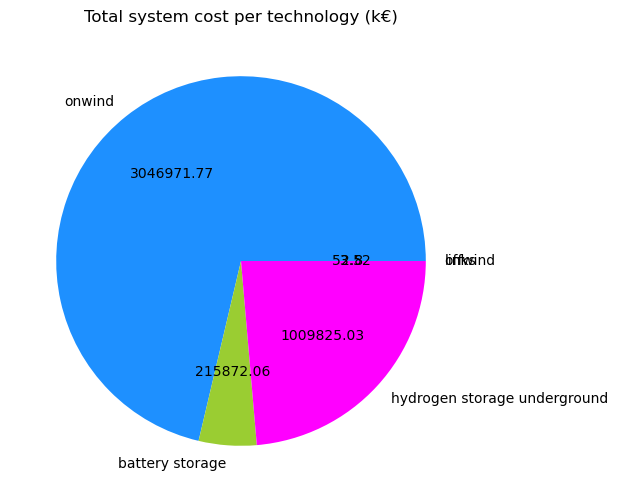

In [128]:
plot_total_costs()

- Capacities built per technologies

In [129]:
capacities_opt = plot_capacities()

- Electricity mix per generator

In [130]:
generator_mix = plot_generators_dispatch()

- Electricity mix per technology

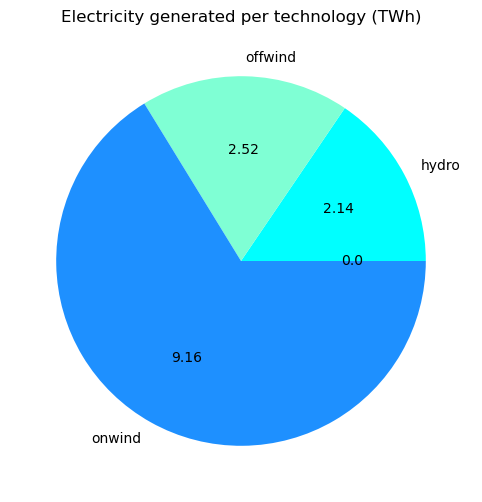

In [131]:
tech_mix = plot_technologies_dispatch()

- Price duration curves

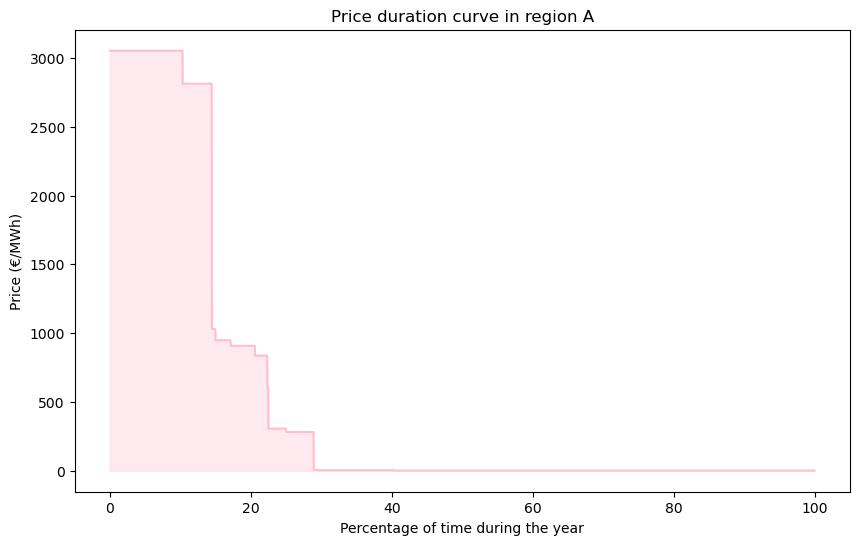

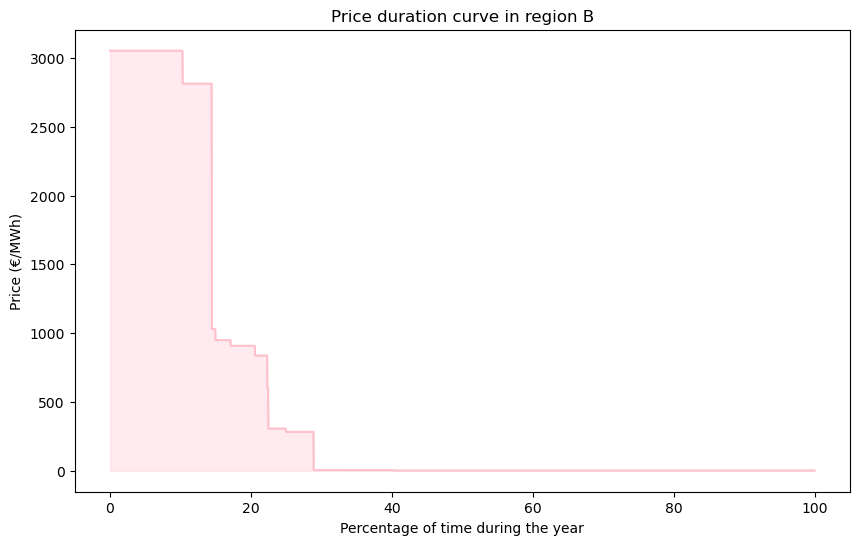

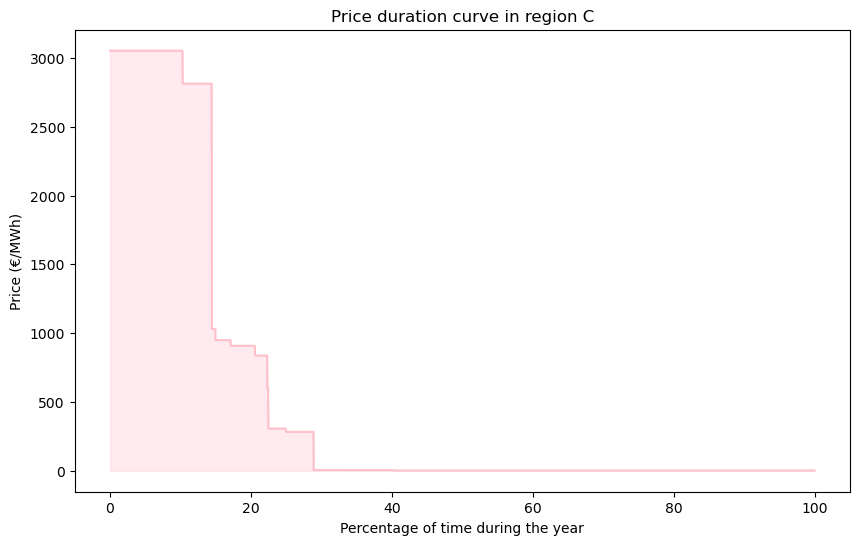

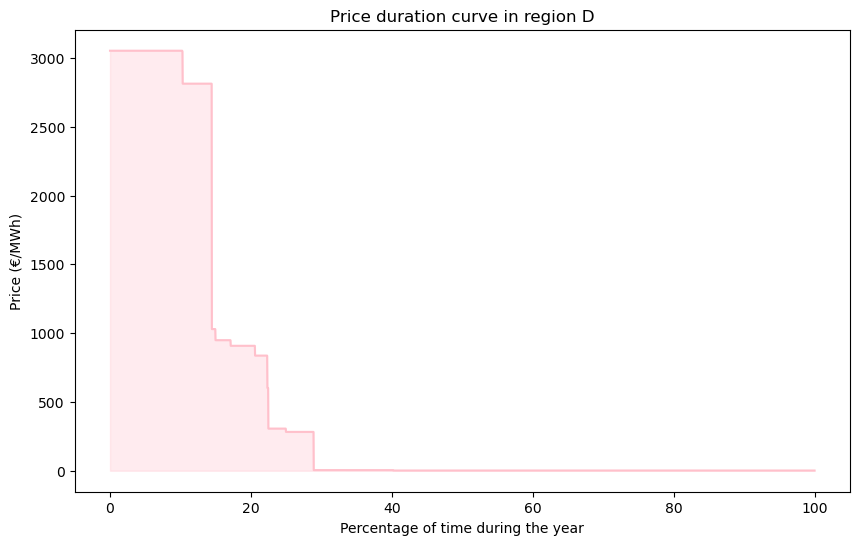

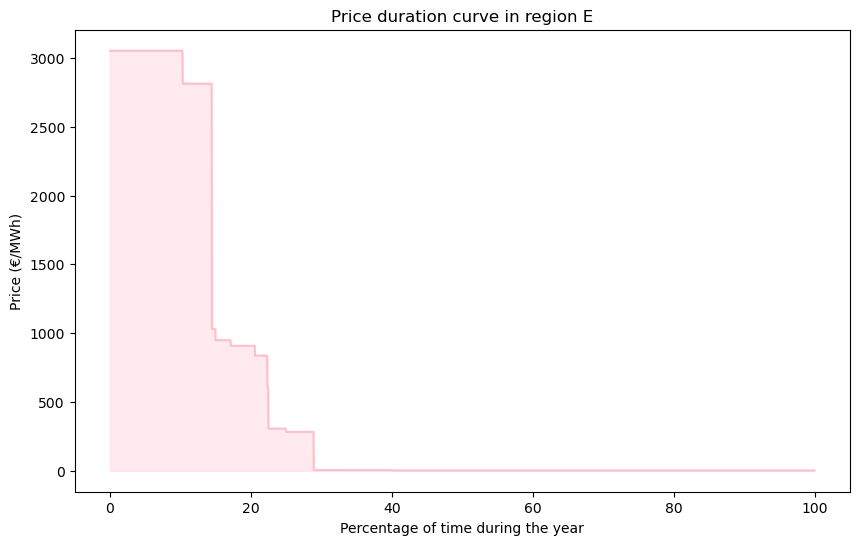

In [132]:
plot_price_curves()

- Average electricity prices per region

In [133]:
n.buses_t.marginal_price.mean() # €/MWh

Bus
A    523.944446
B    523.944452
C    523.944585
D    523.944575
E    523.944457
dtype: float64

- Rate of curtailment

In [134]:
curtailments()

carrier
OCGT      1.00
onwind    0.32
dtype: float64


- Storage filling levels

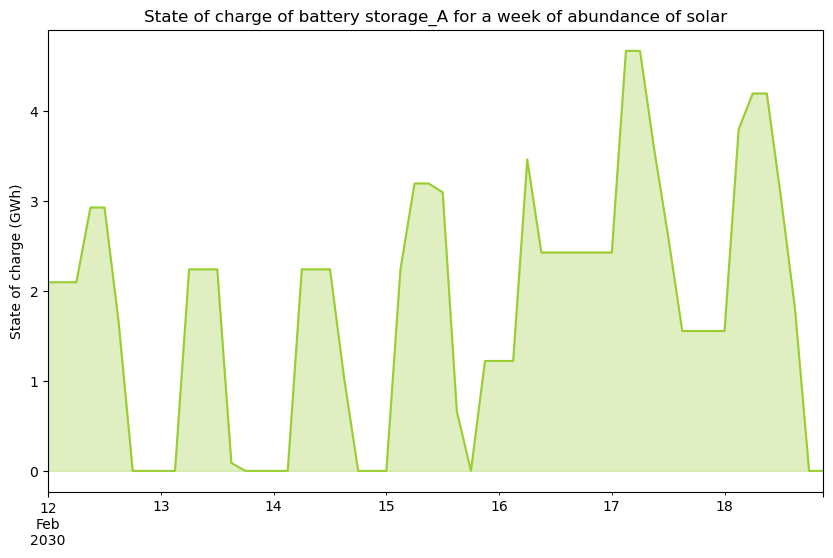

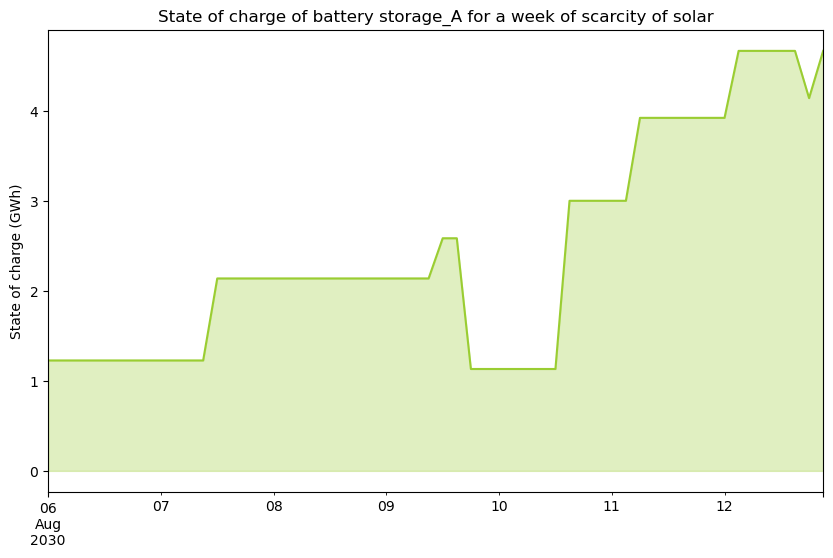

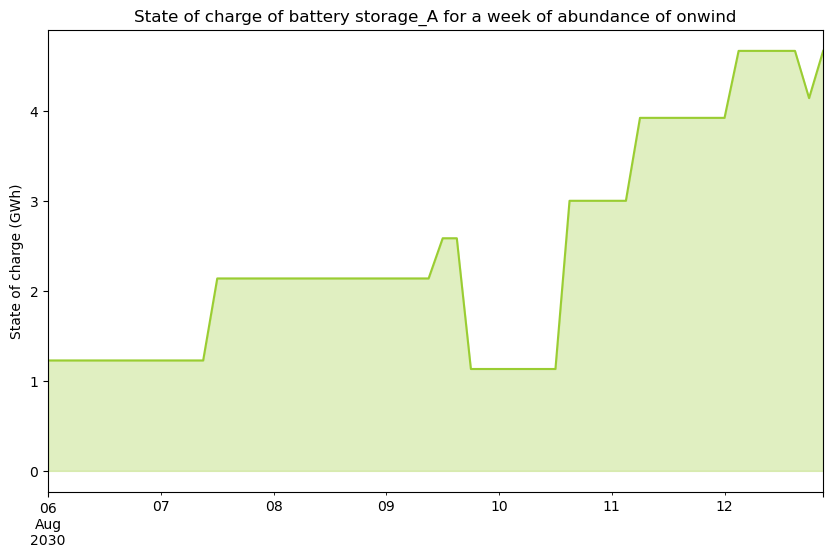

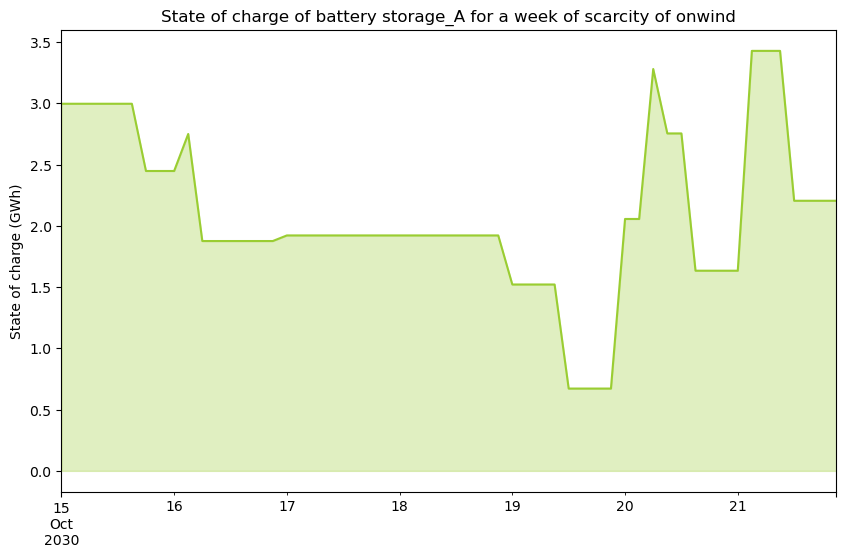

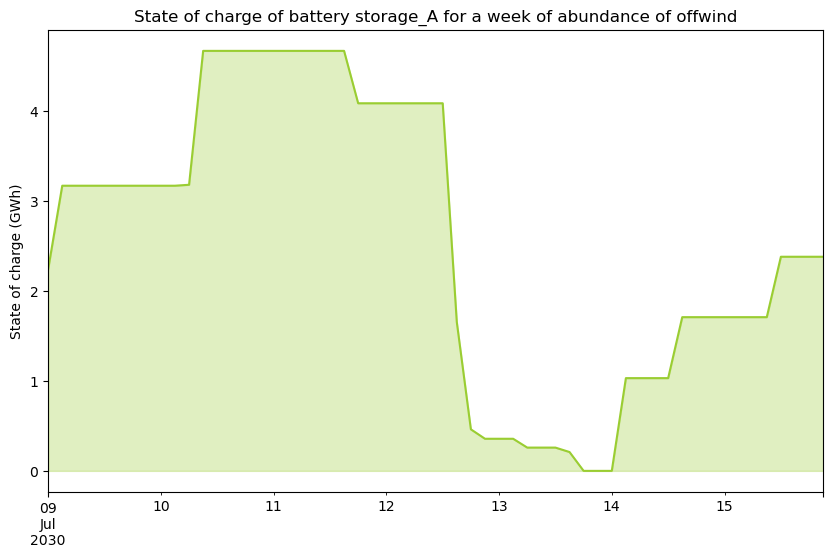

...

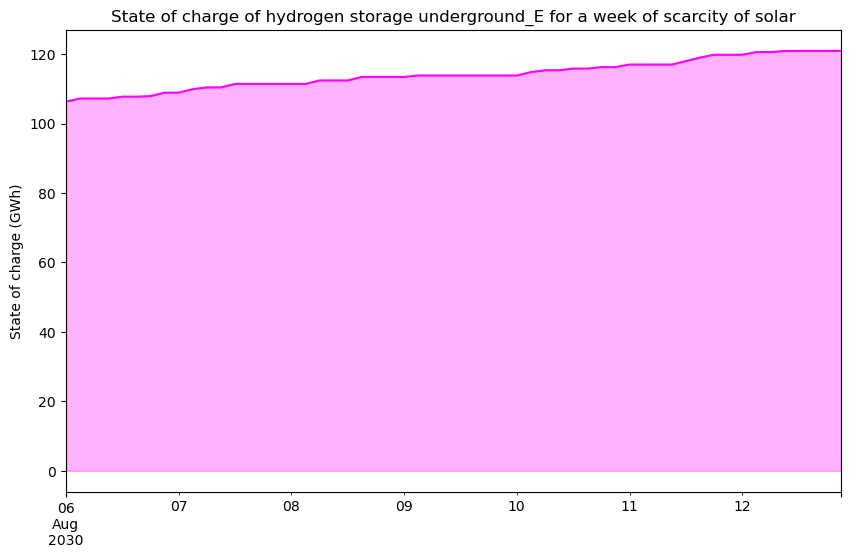

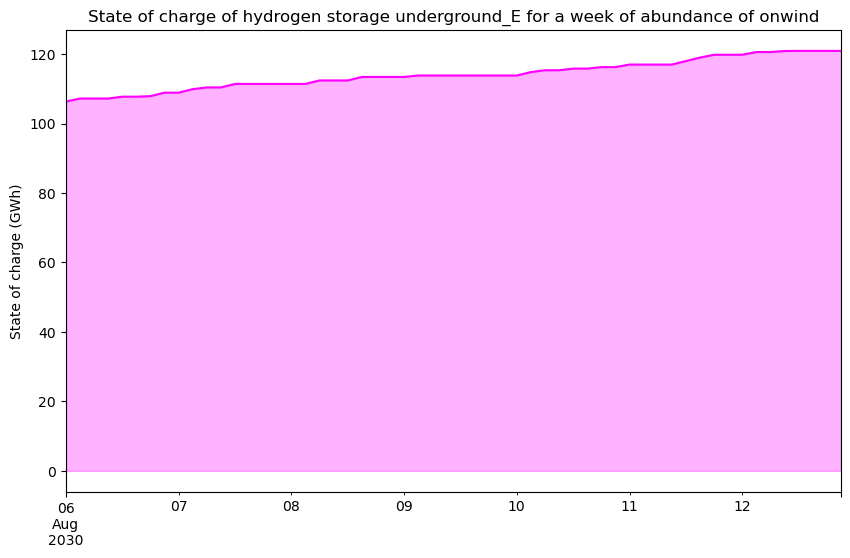

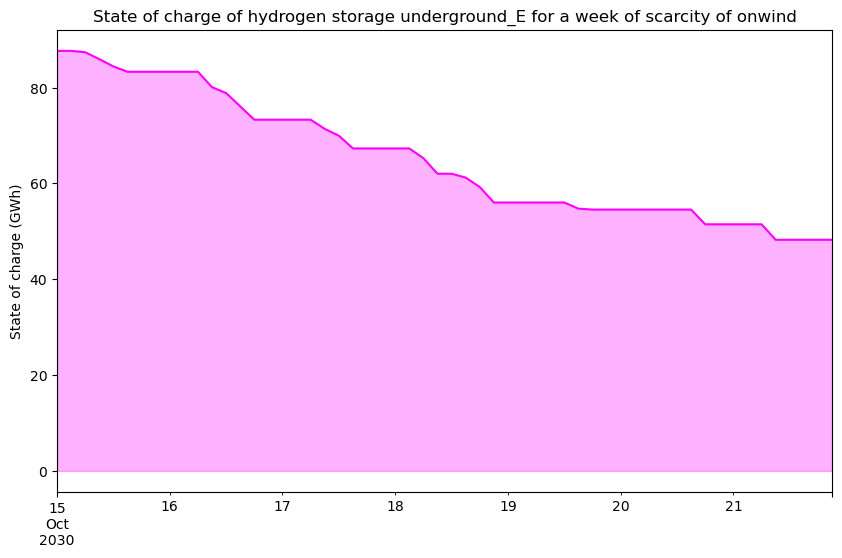

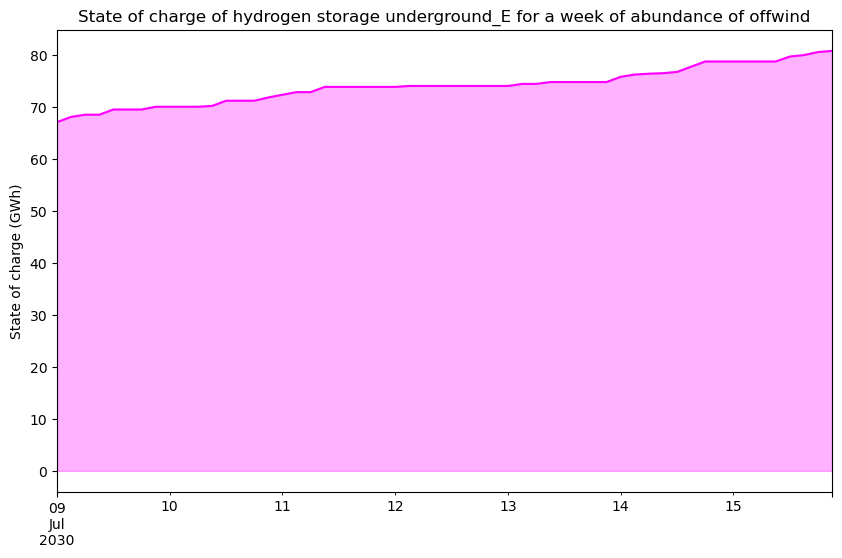

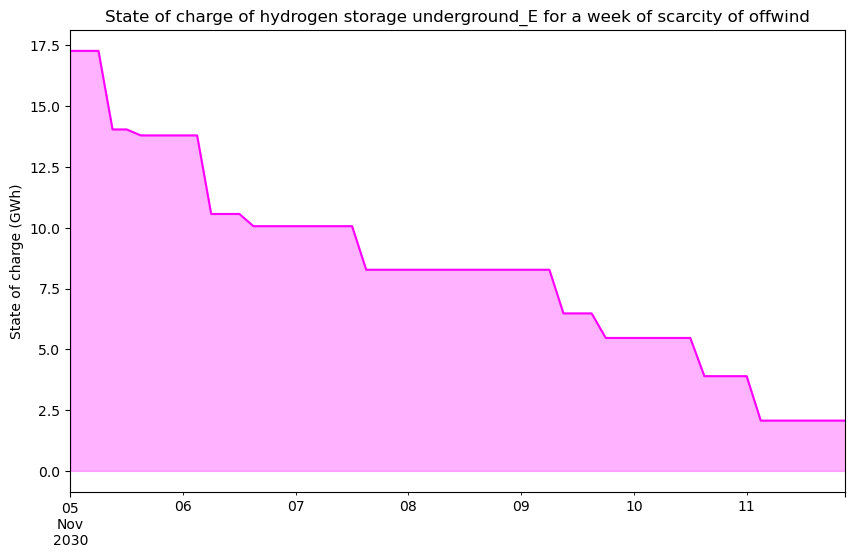

In [135]:
plot_storage()